<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: deeppink;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 20px;
              color:white;">Proyecto Final - Análisis a Profundidad de Características para la Detección de Cáncer de Mama
    
</h2>
</div>

<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: plum;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Importación de Librerias
    
</h2>
</div>

In [473]:
import pandas as pd
import pandas as dq
import numpy as np
from prettytable import PrettyTable
import matplotlib.pyplot as plt
from pandas_dq import dq_report
import seaborn as sns
import statsmodels.api as sm
from scipy.stats import norm
%matplotlib inline

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.svm import SVC, SVR
from sklearn.feature_selection import RFE
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF



from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [474]:
from sklearn.datasets import load_breast_cancer
from sklearn.inspection import permutation_importance

<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: plum;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Inspección de datos
    
</h2>
</div>

In [475]:
df = pd.read_csv(r'breast-cancer.csv', index_col=False,)
print(df)

        id    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0      842302      M        17.99         10.38         122.80       1001.0     
1      842517      M        20.57         17.77         132.90       1326.0     
2    84300903      M        19.69         21.25         130.00       1203.0     
3    84348301      M        11.42         20.38          77.58        386.1     
4    84358402      M        20.29         14.34         135.10       1297.0     
..        ...       ...          ...           ...             ...        ...   
564    926424      M        21.56         22.39         142.00       1479.0     
565    926682      M        20.13         28.25         131.20       1261.0     
566    926954      M        16.60         28.08         108.30        858.1     
567    927241      M        20.60         29.33         140.10       1265.0     
568     92751      B         7.76         24.54          47.92        181.0     

     smoothness_mean  compa

Se muestra las primeras 10 filas del DataFrame df, ofreciendo una vista rápida de los datos al proporcionar una muestra de las observaciones iniciales en el conjunto de datos.

In [476]:
df.head(10)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,0.2087,0.07613,0.3345,0.8902,2.217,27.19,0.007510,0.03345,0.03672,0.01137,0.02165,0.005082,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,0.1794,0.05742,0.4467,0.7732,3.180,53.91,0.004314,0.01382,0.02254,0.01039,0.01369,0.002179,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,0.2196,0.07451,0.5835,1.3770,3.856,50.96,0.008805,0.03029,0.02488,0.01448,0.01486,0.005412,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,0.2350,0.07389,0.3063,1.0020,2.406,24.32,0.005731,0.03502,0.03553,0.01226,0.02143,0.003749,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,0.2030,0.08243,0.2976,1.5990,2.039,23.94,0.007149,0.07217,0.07743,0.01432,0.01789,0.010080,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750


La siguiente línea de codigo nos permite ver que los datos tienen 569 registros, cada uno con 32 columnas.

In [477]:
df.shape

(569, 32)

El siguiente codigo nos permite obtener una visión general de la información del DataFrame, incluidos los tipos de datos de cada columna, la cantidad de valores no nulos y la cantidad de memoria utilizada

In [478]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

Esto es útil para identificar rápidamente si hay datos faltantes en tu conjunto de datos y qué columnas se ven afectadas.

In [479]:
df.isnull().any()

id                         False
diagnosis                  False
radius_mean                False
texture_mean               False
perimeter_mean             False
area_mean                  False
smoothness_mean            False
compactness_mean           False
concavity_mean             False
concave points_mean        False
symmetry_mean              False
fractal_dimension_mean     False
radius_se                  False
texture_se                 False
perimeter_se               False
area_se                    False
smoothness_se              False
compactness_se             False
concavity_se               False
concave points_se          False
symmetry_se                False
fractal_dimension_se       False
radius_worst               False
texture_worst              False
perimeter_worst            False
area_worst                 False
smoothness_worst           False
compactness_worst          False
concavity_worst            False
concave points_worst       False
symmetry_w

Se logra vizualizar que el código elimina la columna `id` del DataFrame df y muestra las primeras 10 filas del DataFrame modificado. Esto sugiere que la columna 'id' se considera redundante y no útil para el análisis.

Entonces el diagnóstico es una variable categórica, porque representa un número fijo de valores posibles (es decir, Maligno, de Benigno. Los algoritmos de aprendizaje automático quieren números, y no cadenas, como entradas, por lo que necesitamos codificar para convertirlos.

In [480]:
df.diagnosis.unique()

array(['M', 'B'], dtype=object)

En estas líneas de código eliminan la columna 'id' del DataFrame.

In [481]:
df.drop('id', axis =1, inplace=True)
df.head(10)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
5,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,0.2087,0.07613,0.3345,0.8902,2.217,27.19,0.007510,0.03345,0.03672,0.01137,0.02165,0.005082,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440
6,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,0.1794,0.05742,0.4467,0.7732,3.180,53.91,0.004314,0.01382,0.02254,0.01039,0.01369,0.002179,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368
7,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,0.2196,0.07451,0.5835,1.3770,3.856,50.96,0.008805,0.03029,0.02488,0.01448,0.01486,0.005412,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510
8,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,0.2350,0.07389,0.3063,1.0020,2.406,24.32,0.005731,0.03502,0.03553,0.01226,0.02143,0.003749,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720
9,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,0.2030,0.08243,0.2976,1.5990,2.039,23.94,0.007149,0.07217,0.07743,0.01432,0.01789,0.010080,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750


El código proporciona una tabla que muestra cuántas observaciones hay para cada valor único en la columna `diagnosis`. 

In [482]:
diag_gr = df.groupby('diagnosis', axis=0)
pd.DataFrame(diag_gr.size(), columns=['# of observations'])

,# of observations
diagnosis,
B,357
M,212


El código crea un diccionario de mapeo donde `M` se asigna a 1 y `B` se asigna a 0. Luego, aplica este mapeo a la columna `diagnosis` en el DataFrame df, convirtiendo los valores `M` en 1 y `B` en 0.

**Observación**
357 observaciones indican la ausencia de células cancerosas y 212 muestran ausencia de células cancerosas

In [483]:
mapeo = {'M': 1, 'B': 0}
df
# Aplicar el mapeo a la columna 'diagnosis'
df['diagnosis'] = df['diagnosis'].map(mapeo)
df

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


La siguiente línea de código guarda el DataFrame `df` como un archivo CSV llamado `breast-cancer-clean.csv` sin incluir el índice del DataFrame en el archivo. Después de ejecutar, se agregara un archivo `breast-cancer-clean.csv` en el directorio de trabajo con los datos del DataFrame.

In [484]:
df.to_csv('breast-cancer-clean.csv', index=False)
df

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: plum;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Estadísticas descriptivas 
    
</h2>
</div>

Los siguientes estadísticos te proporcionan una visión general de la distribución y la dispersión de los datos en cada columna numérica del DataFrame. Pueden ser útiles para identificar tendencias, entender la variabilidad de los datos y detectar posibles valores atípicos.

In [485]:
df.describe()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


Aquí calcula y devuelve la asimetría de cada columna en un DataFrame. Proporciona información sobre la forma y simetría de la distribución de datos en cada característica del conjunto de datos. 

In [486]:
df.skew()

diagnosis                  0.528461
radius_mean                0.942380
texture_mean               0.650450
perimeter_mean             0.990650
area_mean                  1.645732
smoothness_mean            0.456324
compactness_mean           1.190123
concavity_mean             1.401180
concave points_mean        1.171180
symmetry_mean              0.725609
fractal_dimension_mean     1.304489
radius_se                  3.088612
texture_se                 1.646444
perimeter_se               3.443615
area_se                    5.447186
smoothness_se              2.314450
compactness_se             1.902221
concavity_se               5.110463
concave points_se          1.444678
symmetry_se                2.195133
fractal_dimension_se       3.923969
radius_worst               1.103115
texture_worst              0.498321
perimeter_worst            1.128164
area_worst                 1.859373
smoothness_worst           0.415426
compactness_worst          1.473555
concavity_worst            1

El resultado del sesgo muestra un sesgo positivo (derecha) o negativo (izquierda). Si el resultado es 0, indica que la distribución es perfectamente simétrica.

Podemos ver que **radius_mean, perimeter_mean, area_mean, concavity_means y concave_points_mean** son útiles para predecir el tipo de cáncer debido a la distinta agrupación entre tipos de cáncer maligno y benigno en estas características. También podemos ver que **area_worst y perimeter_worst** también son bastante útiles.

El atributo radius_mean permite diferenciar la presencia de células tumorales o no tumorales en la imagen.

El atributo ***radius_mean*** nos permite diferenciar la presencia de células tumorales o no tumorales.Este código genera un gráfico de violín que muestra la distribución del radio medio para los diagnósticos `Benigno` y `Maligno`. La transformación de los valores 0 y 1 en 'Benigno' y 'Maligno' facilita la interpretación del gráfico.

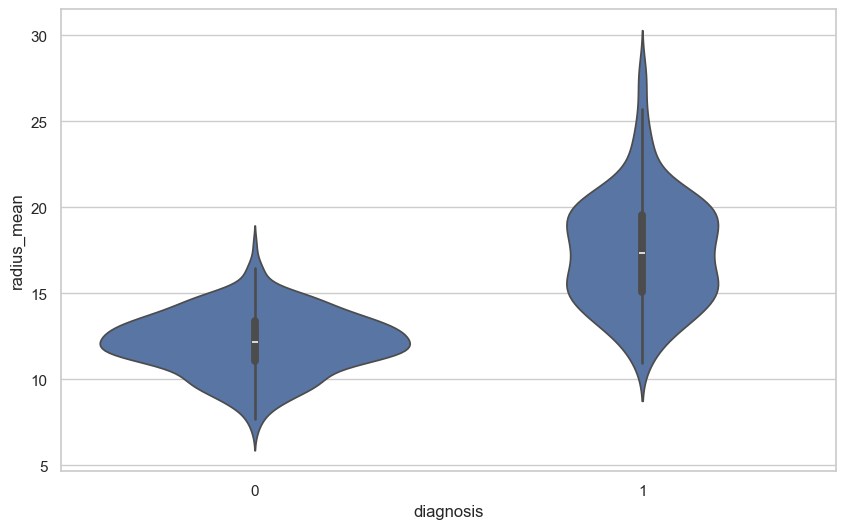

In [487]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='diagnosis', y='radius_mean', data=df)
df['diagnosis'] = df['diagnosis'].map({0: 'Benigno', 1: 'Maligno'})
plt.show()

La siguiente sección proporciona una visualización de la importancia de las características ,  lo que facilita la comparación y la identificación de las características más importantes.

In [284]:
def plot_permutation_importance(clf, X, y, ax):
    result = permutation_importance(clf, X, y, n_repeats=10, random_state=42, n_jobs=2)
    perm_sorted_idx = result.importances_mean.argsort()

    ax.boxplot(
        result.importances[perm_sorted_idx].T,
        vert=False,
        labels=X.columns[perm_sorted_idx],
    )
    ax.axvline(x=0, color="k", linestyle="--")
    return ax

Luego entrenamos a un usuario RandomForestClassifieren el conjunto de datos (diagnóstico) de Wisconsin sobre el cáncer de mama y evaluamos su precisión en un conjunto de pruebas:

In [285]:
X, y = load_breast_cancer(return_X_y=True, as_frame=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)
print(f"Baseline accuracy on test data: {clf.score(X_test, y_test):.2}")

Baseline accuracy on test data: 0.97


trazamos la importancia de las características basadas en árboles y la importancia de las permutaciones. La importancia de la permutación se calcula en el conjunto de entrenamiento para mostrar cuánto depende el modelo de cada característica durante el entrenamiento

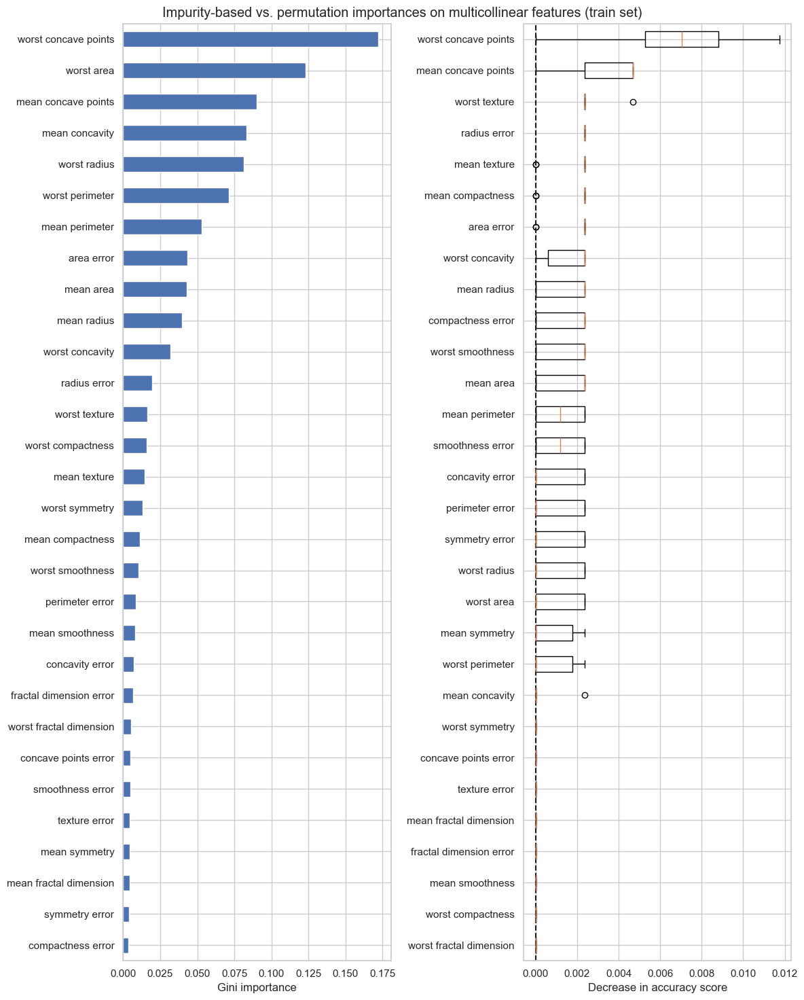

In [286]:
mdi_importances = pd.Series(clf.feature_importances_, index=X_train.columns)
tree_importance_sorted_idx = np.argsort(clf.feature_importances_)
tree_indices = np.arange(0, len(clf.feature_importances_)) + 0.5

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 15))
mdi_importances.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(clf, X_train, y_train, ax2)
ax2.set_xlabel("Decrease in accuracy score")
fig.suptitle(
    "Impurity-based vs. permutation importances on multicollinear features (train set)"
)
_ = fig.tight_layout()

El gráfico de la izquierda muestra la importancia de Gini del modelo. Como la implementación de scikit-learn RandomForestClassifierutiliza subconjuntos aleatorios de raiz de nfeatures 
características en cada división, es capaz de diluir el predominio de cualquier característica correlacionada única. Como resultado, la importancia de las características individuales puede distribuirse más uniformemente entre las características correlacionadas. Dado que las características tienen una gran cardinalidad y el clasificador no está sobreajustado, podemos confiar relativamente en esos valores.

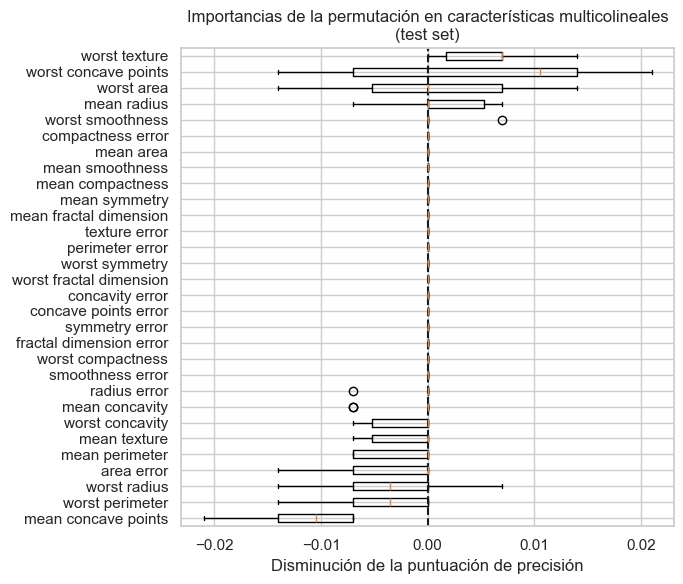

In [287]:
fig, ax = plt.subplots(figsize=(7, 6))
plot_permutation_importance(clf, X_test, y_test, ax)
ax.set_title("Importancias de la permutación en características multicolineales\n(test set)")
ax.set_xlabel("Disminución de la puntuación de precisión")
_ = ax.figure.tight_layout()

Este código ayuda a comprender la estructura de correlación entre las características del conjunto de datos mediante la agrupación jerárquica y proporciona visualizaciones, como el dendrograma y la matriz de correlación reorganizada, para facilitar la interpretación de patrones de correlación.

In [385]:
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform
from scipy.stats import spearmanr
from collections import defaultdict

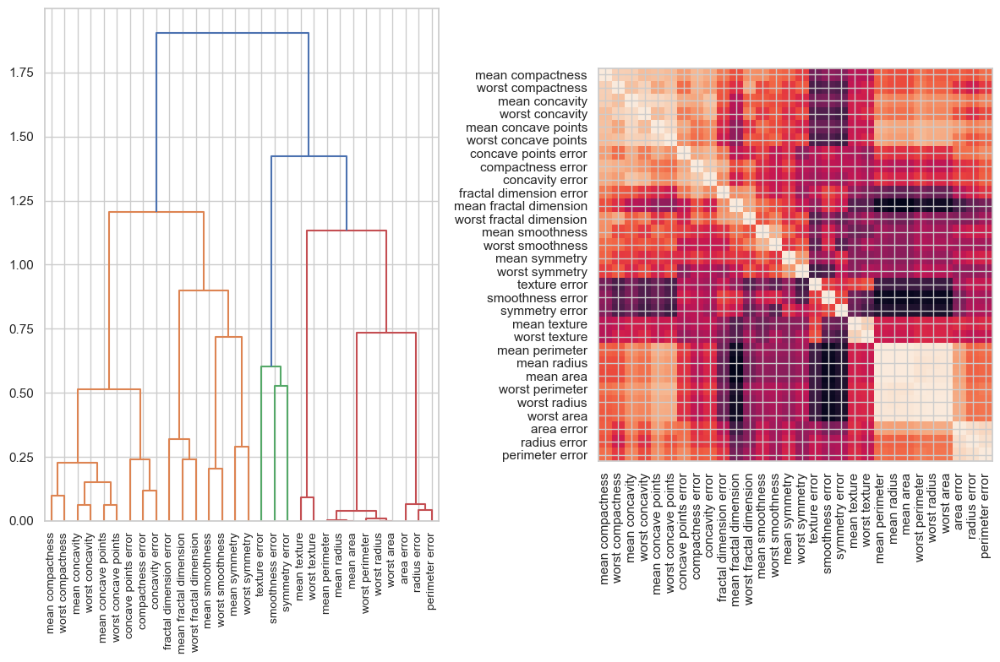

In [289]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
corr = spearmanr(X).correlation

# Ensure the correlation matrix is symmetric
corr = (corr + corr.T) / 2
np.fill_diagonal(corr, 1)

# We convert the correlation matrix to a distance matrix before performing
# hierarchical clustering using Ward's linkage.
distance_matrix = 1 - np.abs(corr)
dist_linkage = hierarchy.ward(squareform(distance_matrix))
dendro = hierarchy.dendrogram(
    dist_linkage, labels=X.columns.to_list(), ax=ax1, leaf_rotation=90
)
dendro_idx = np.arange(0, len(dendro["ivl"]))

ax2.imshow(corr[dendro["leaves"], :][:, dendro["leaves"]])
ax2.set_xticks(dendro_idx)
ax2.set_yticks(dendro_idx)
ax2.set_xticklabels(dendro["ivl"], rotation="vertical")
ax2.set_yticklabels(dendro["ivl"])
_ = fig.tight_layout()

A continuación, seleccionamos manualmente un umbral mediante inspección visual del dendrograma para agrupar nuestras características en grupos y elegimos una característica de cada grupo para conservar, seleccionamos esas características de nuestro conjunto de datos y entrenamos un nuevo bosque aleatorio. La precisión de la prueba del nuevo bosque aleatorio no cambió mucho en comparación con el bosque aleatorio entrenado en el conjunto de datos completo.

In [290]:
cluster_ids = hierarchy.fcluster(dist_linkage, 1, criterion="distance")
cluster_id_to_feature_ids = defaultdict(list)
for idx, cluster_id in enumerate(cluster_ids):
    cluster_id_to_feature_ids[cluster_id].append(idx)
selected_features = [v[0] for v in cluster_id_to_feature_ids.values()]
selected_features_names = X.columns[selected_features]

X_train_sel = X_train[selected_features_names]
X_test_sel = X_test[selected_features_names]

clf_sel = RandomForestClassifier(n_estimators=100, random_state=42)
clf_sel.fit(X_train_sel, y_train)
print(
    "Baseline accuracy on test data with features removed:"
    f" {clf_sel.score(X_test_sel, y_test):.2}"
)

Baseline accuracy on test data with features removed: 0.97


Con esto podemos explorar la importancia de la permutación del subconjunto de características seleccionado.

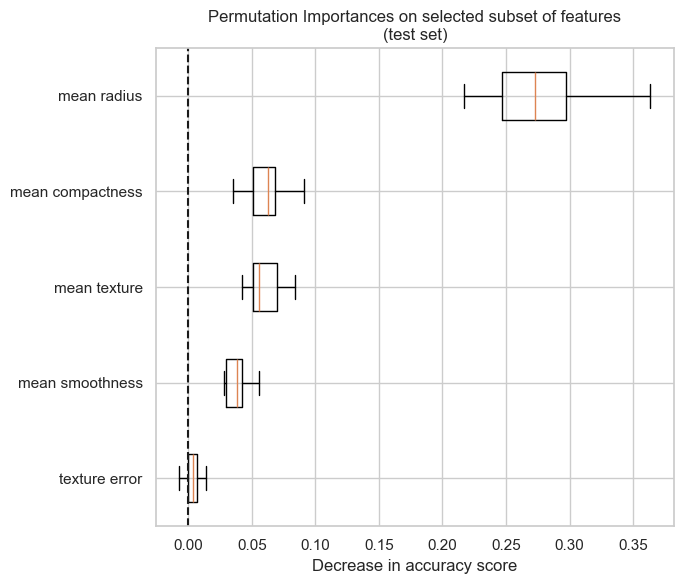

In [386]:
fig, ax = plt.subplots(figsize=(7, 6))
plot_permutation_importance(clf_sel, X_test_sel, y_test, ax)
ax.set_title("Permutation Importances on selected subset of features\n(test set)")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.show()

<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: plum;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Limpieza de datos 
    
</h2>
</div>

En este caso se desplegó rápidamente el número de valores atípicos en nuestros datos. Este codigo esta diseñado para generar un informe o realizar análisis relacionados con la calidad de datos.

In [291]:
dq_report(df, target=None, verbose=1)
df

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
diagnosis,object,0.000000,0,nan,nan,No issue
radius_mean,float64,0.000000,NA,6.981000,28.110000,has 14 outliers greater than upper bound (21.90) or lower than lower bound(5.58). Cap them or remove them.
texture_mean,float64,0.000000,NA,9.710000,39.280000,has 7 outliers greater than upper bound (30.24) or lower than lower bound(7.73). Cap them or remove them.
perimeter_mean,float64,0.000000,NA,43.790000,188.500000,"has 13 outliers greater than upper bound (147.49) or lower than lower bound(31.78). Cap them or remove them., has a high correlation with ['radius_mean']. Consider dropping one of them."
area_mean,float64,0.000000,NA,143.500000,2501.000000,"has 25 outliers greater than upper bound (1326.30) or lower than lower bound(-123.30). Cap them or remove them., has a high correlation with ['radius_mean', 'perimeter_mean']. Consider dropping one of them."
smoothness_mean,float64,0.000000,NA,0.052630,0.163400,has 6 outliers greater than upper bound (0.13) or lower than lower bound(0.06). Cap them or remove them.
compactness_mean,float64,0.000000,NA,0.019380,0.345400,has 16 outliers greater than upper bound (0.23) or lower than lower bound(-0.03). Cap them or remove them.
concavity_mean,float64,0.000000,NA,0.000000,0.426800,"has 18 outliers greater than upper bound (0.28) or lower than lower bound(-0.12). Cap them or remove them., has a high correlation with ['compactness_mean']. Consider dropping one of them."
concave points_mean,float64,0.000000,NA,0.000000,0.201200,"has 10 outliers greater than upper bound (0.15) or lower than lower bound(-0.06). Cap them or remove them., has a high correlation with ['radius_mean', 'perimeter_mean', 'area_mean', 'compactness_mean', 'concavity_mean']. Consider dropping one of them."
symmetry_mean,float64,0.000000,NA,0.106000,0.304000,has 15 outliers greater than upper bound (0.25) or lower than lower bound(0.11). Cap them or remove them.


,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,Maligno,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,Maligno,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,Maligno,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,Maligno,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,Maligno,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,Maligno,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,Maligno,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,Maligno,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,Maligno,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


Este código crea un nuevo DataFrame llamado df_clean al eliminar las filas que contienen valores faltantes (NaN) en al menos una de las columnas especificadas en subset_of_columns. 

In [292]:
subset_of_columns = [
    'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
    'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean',
    'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se',
    'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se',
    'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst',
    'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst',
    'compactness_worst', 'concavity_worst', 'concave points_worst',
    'symmetry_worst', 'fractal_dimension_worst'
]
df_clean = df.dropna(subset=subset_of_columns, how='any')
df_clean

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,Maligno,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,Maligno,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,Maligno,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,Maligno,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,Maligno,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,Maligno,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,Maligno,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,Maligno,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,Maligno,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [293]:
feature_columns = [
    'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
    'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean',
    'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se',
    'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se',
    'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst',
    'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst',
    'compactness_worst', 'concavity_worst', 'concave points_worst',
    'symmetry_worst', 'fractal_dimension_worst'
]

X = df_clean[feature_columns].values
y = df_clean['diagnosis'].values


In [28]:
import os

# Desactivar la paralelización de OpenBLAS
os.environ["OPENBLAS_NUM_THREADS"] = "1"

<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: plum;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Evaluación de modelo (obtenión de baseline)    
</h2>
</div>


In [29]:
pip install --upgrade scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [30]:
conda update --all

Channels:
 - defaults
 - conda-forge
Platform: osx-arm64

CondaHTTPError: HTTP 000 CONNECTION FAILED for url <https://conda.anaconda.org/conda-forge/noarch/repodata.json>
Elapsed: -

An HTTP error occurred when trying to retrieve this URL.
HTTP errors are often intermittent, and a simple retry will get you on your way.
'https//conda.anaconda.org/conda-forge/noarch'



Note: you may need to restart the kernel to use updated packages.


In [31]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification

In [32]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier, BaggingClassifier, RandomForestClassifier, HistGradientBoostingClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import VotingClassifier, StackingClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression


Resultados de GaussianNB
Matriz de Confusión:
[[70  1]
 [ 3 40]]
Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.96      0.99      0.97        71
           1       0.98      0.93      0.95        43

    accuracy                           0.96       114
   macro avg       0.97      0.96      0.96       114
weighted avg       0.97      0.96      0.96       114



Resultados de GradientBoostingClassifier
Matriz de Confusión:
[[69  2]
 [ 3 40]]
Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.96      0.97      0.97        71
           1       0.95      0.93      0.94        43

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114



Resultados de BaggingClassifier
Matriz de Confusión:
[[69  2]
 [ 3 40]]
Informe de Clasificación:
              precision    recall  f1-score   

/Users/roxanarachel/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Matriz de Confusión:
[[69  2]
 [ 2 41]]
Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        71
           1       0.95      0.95      0.95        43

    accuracy                           0.96       114
   macro avg       0.96      0.96      0.96       114
weighted avg       0.96      0.96      0.96       114



Resultados de LinearDiscriminantAnalysis
Matriz de Confusión:
[[70  1]
 [ 4 39]]
Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97        71
           1       0.97      0.91      0.94        43

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114



Resultados de QuadraticDiscriminantAnalysis
Matriz de Confusión:
[[68  3]
 [ 2 41]]
Informe de Clasificación:
              precision    recall  f1-score   support

    

/var/folders/pp/wmccm1s10r7fdx87b695vhqw0000gn/T/ipykernel_62574/3552019079.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(x='Accuracy', y='Model', data=results_df, palette='viridis')


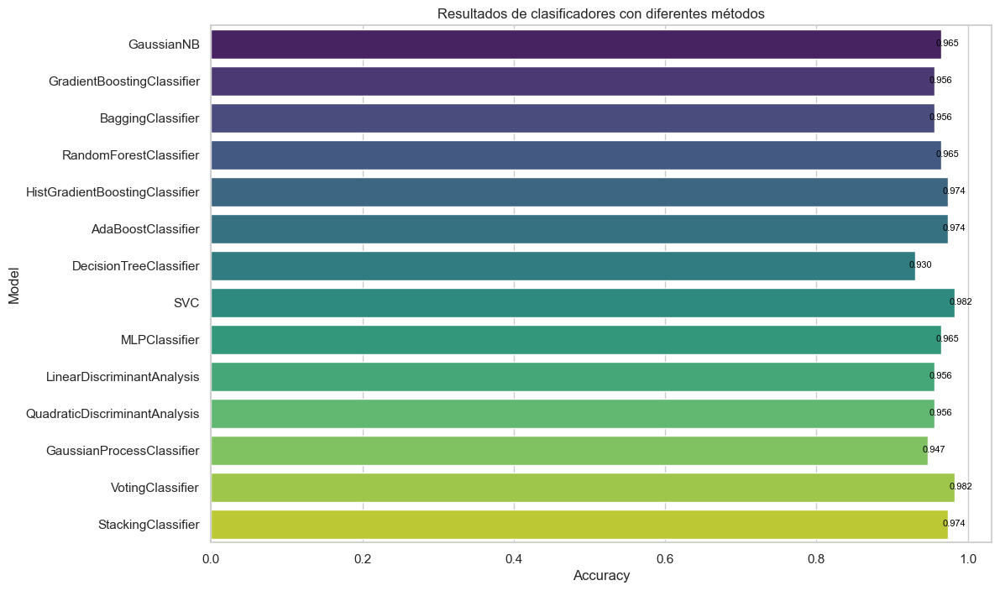

In [33]:

def evaluate_model(model, X_train, X_test, y_train, y_test, model_name):
    print(f"Resultados de {model_name}")

    # Entrenar el modelo y realizar predicciones
    model.fit(X_train, y_train)
    predicted = model.predict(X_test)

    # Calcular la matriz de confusión
    conf_matrix = confusion_matrix(y_test, predicted)
    print("Matriz de Confusión:")
    print(conf_matrix)

    # Imprimir un informe de clasificación detallado
    print("Informe de Clasificación:")
    print(classification_report(y_test, predicted))
    print("\n" + "="*50 + "\n")

    # Devolver el accuracy
    accuracy = accuracy_score(y_test, predicted)
    return accuracy

# Cargar el conjunto de datos
data = pd.read_csv("breast-cancer-clean.csv")

# Convertir etiquetas categóricas a valores numéricos
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Escalar características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Lista de clasificadores
classifiers = [
    GaussianNB(),
    GradientBoostingClassifier(),
    BaggingClassifier(),
    RandomForestClassifier(),
    HistGradientBoostingClassifier(),
    AdaBoostClassifier(),
    DecisionTreeClassifier(),
    SVC(),
    MLPClassifier(),
    LinearDiscriminantAnalysis(),
    QuadraticDiscriminantAnalysis(),
    GaussianProcessClassifier(),
    VotingClassifier(estimators=[('svc', SVC()), ('rf', RandomForestClassifier()), ('lr', LogisticRegression())]),
    StackingClassifier(estimators=[('svc', SVC()), ('rf', RandomForestClassifier()), ('lr', LogisticRegression())]),
]

# Almacenar resultados de accuracy
results = []

# Evaluación de cada clasificador
for model in classifiers:
    model_name = model.__class__.__name__
    accuracy = evaluate_model(model, X_train_scaled, X_test_scaled, y_train, y_test, model_name)
    results.append({'Model': model_name, 'Accuracy': accuracy})

# Crear DataFrame de resultados
results_df = pd.DataFrame(results)

# Crear gráfico de barras con Seaborn
plt.figure(figsize=(12, 8))
barplot = sns.barplot(x='Accuracy', y='Model', data=results_df, palette='viridis')

# Añadir etiquetas
plt.xlabel('Accuracy')
plt.ylabel('Model')
plt.title('Resultados de clasificadores con diferentes métodos')

# Agregar etiquetas de los valores de Accuracy en cada barra
for p in barplot.patches:
    barplot.annotate(f'{p.get_width():.3f}', (p.get_width(), p.get_y() + p.get_height() / 2),
                     ha='center', va='center', fontsize=8, color='black', xytext=(5, 0), textcoords='offset points')

# Mostrar la gráfica
plt.show()

## 

<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: thistle;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Método Filter
    
</h2>
</div>

In [34]:
from sklearn.datasets import load_breast_cancer
from IPython.display import display
import plotly.express as px

from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import SelectFpr
from sklearn.feature_selection import SelectFdr
from sklearn.feature_selection import SelectFwe
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.feature_selection import SelectFromModel

In [35]:
from sklearn.feature_selection import GenericUnivariateSelect, chi2

`feature_columns` es una lista de nombres de columnas utilizadas como características, X es un DataFrame que contiene estas características, y y es una Serie que contiene la variable objetivo ('diagnosis'). El código imprime la forma original de X para mostrar la cantidad de filas y columnas en este conjunto de datos de características.

In [36]:
feature_columns = [
    'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
    'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean',
    'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se',
    'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se',
    'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst',
    'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst',
    'compactness_worst', 'concavity_worst', 'concave points_worst',
    'symmetry_worst', 'fractal_dimension_worst'
]

X = df[feature_columns]
y = df['diagnosis']
print("Forma original de X:", X.shape)

Forma original de X: (569, 30)


<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: lavender;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">GenericUnivariateSelect
    
</h2>
</div>

Características Seleccionadas Chi2:


,Feature,Importance
23,area_worst,112598.431564
3,area_mean,53991.655924
13,area_se,8758.504705
22,perimeter_worst,3665.035416
2,perimeter_mean,2011.102864
20,radius_worst,491.689157
0,radius_mean,266.104917
12,perimeter_se,250.571896
21,texture_worst,174.449400
1,texture_mean,93.897508


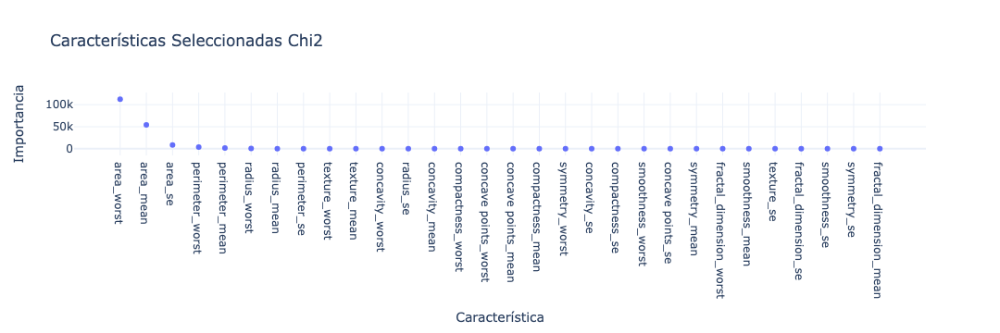

Características Seleccionadas ANOVA:


,Feature,Importance
27,concave points_worst,964.385393
22,perimeter_worst,897.944219
7,concave points_mean,861.676020
20,radius_worst,860.781707
2,perimeter_mean,697.235272
23,area_worst,661.600206
0,radius_mean,646.981021
3,area_mean,573.060747
6,concavity_mean,533.793126
26,concavity_worst,436.691939


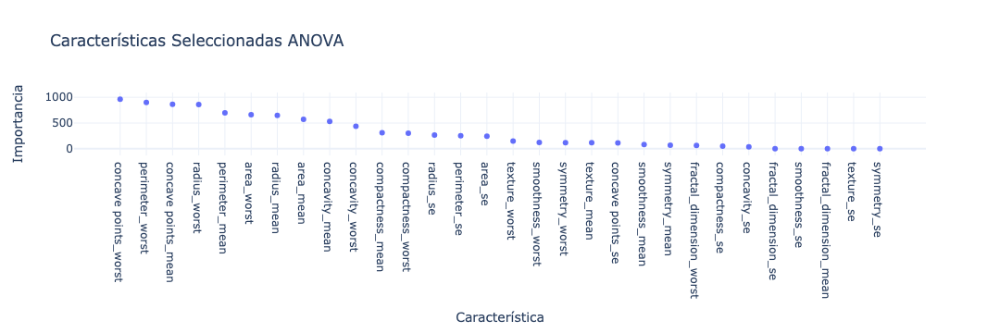

Características Seleccionadas Mutual info:


,Feature,Importance
22,perimeter_worst,0.472745
23,area_worst,0.464847
20,radius_worst,0.453175
7,concave points_mean,0.439508
27,concave points_worst,0.437852
2,perimeter_mean,0.401142
6,concavity_mean,0.371964
0,radius_mean,0.368847
3,area_mean,0.358419
13,area_se,0.338971


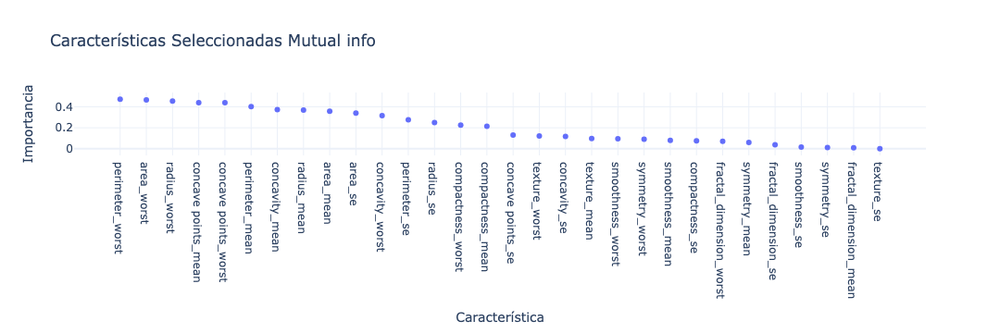

In [37]:


# Primer bloque de código
transformer1 = GenericUnivariateSelect(chi2, mode='k_best', param=20)
X_new1 = transformer1.fit_transform(X, y)

selected_features_df1 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer1.scores_
})
selected_features_df1 = selected_features_df1.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas Chi2:")
display(selected_features_df1)

fig1 = px.scatter(
    selected_features_df1,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Chi2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig1.show()

# Segundo bloque de código
transformer2 = GenericUnivariateSelect(f_classif, mode='k_best', param=20)
X_new2 = transformer2.fit_transform(X, y)

selected_features_df2 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer2.scores_
})
selected_features_df2 = selected_features_df2.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas ANOVA:")
display(selected_features_df2)

fig2 = px.scatter(
    selected_features_df2,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas ANOVA',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()

# Tercer bloque de código
transformer3 = GenericUnivariateSelect(mutual_info_classif, mode='k_best', param=20)
X_new3 = transformer3.fit_transform(X, y)

selected_features_df3 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer3.scores_
})
selected_features_df3 = selected_features_df3.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas Mutual info:")
display(selected_features_df3)

fig3 = px.scatter(
    selected_features_df3,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Mutual info',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig3.show()



## Selección de atributos ##

Características Seleccionadas Chi2:


,Feature,Importance
23,area_worst,112598.431564
3,area_mean,53991.655924
13,area_se,8758.504705
22,perimeter_worst,3665.035416
2,perimeter_mean,2011.102864
20,radius_worst,491.689157
0,radius_mean,266.104917
12,perimeter_se,250.571896
21,texture_worst,174.449400
1,texture_mean,93.897508


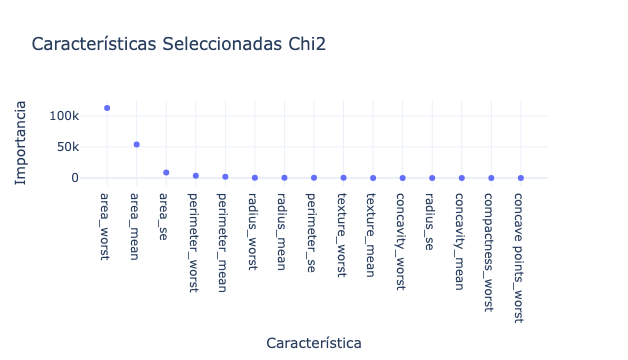

Características Seleccionadas ANOVA:


,Feature,Importance
27,concave points_worst,964.385393
22,perimeter_worst,897.944219
7,concave points_mean,861.676020
20,radius_worst,860.781707
2,perimeter_mean,697.235272
23,area_worst,661.600206
0,radius_mean,646.981021
3,area_mean,573.060747
6,concavity_mean,533.793126
26,concavity_worst,436.691939


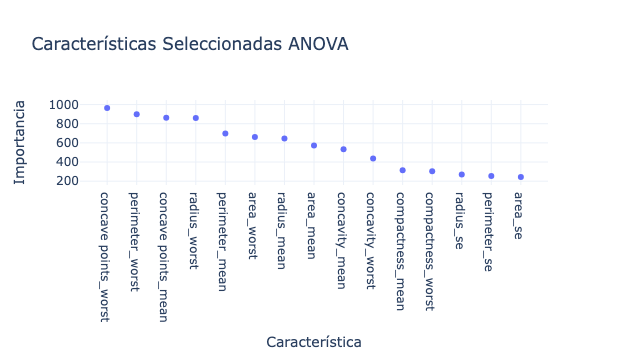

Características Seleccionadas Mutual info:


,Feature,Importance
22,perimeter_worst,0.476503
23,area_worst,0.462819
20,radius_worst,0.454483
7,concave points_mean,0.442546
27,concave points_worst,0.435752
2,perimeter_mean,0.405006
6,concavity_mean,0.374540
0,radius_mean,0.370216
3,area_mean,0.360665
13,area_se,0.339702


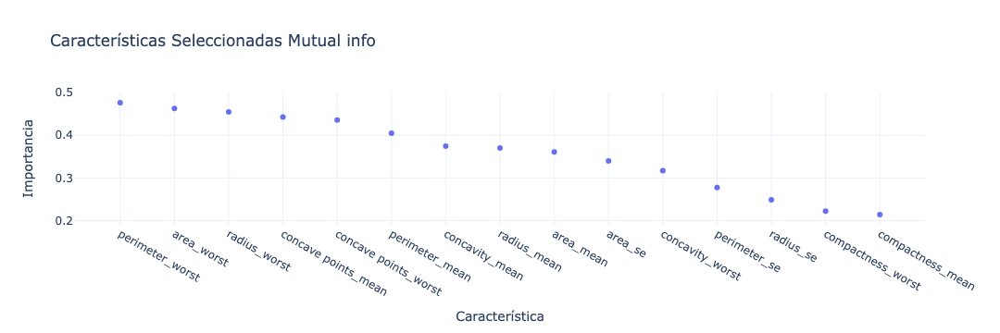

In [38]:
# Primer bloque de código
transformer1 = GenericUnivariateSelect(chi2, mode='k_best', param=20)
X_new1 = transformer1.fit_transform(X, y)

selected_features_df1 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer1.scores_
})
selected_features_df1 = selected_features_df1.sort_values(by='Importance', ascending=False)

# Seleccionar solo los primeros 15 atributos
selected_features1 = selected_features_df1['Feature'].head(15).tolist()

# Crear DataFrame GenericUnivariateSelectTrans1
GenericUnivariateSelectTrans1 = pd.DataFrame(X[selected_features1])

print("Características Seleccionadas Chi2:")
display(selected_features_df1.head(15))

fig1 = px.scatter(
    selected_features_df1.head(15),
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Chi2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig1.show()

# Segundo bloque de código
transformer2 = GenericUnivariateSelect(f_classif, mode='k_best', param=20)
X_new2 = transformer2.fit_transform(X, y)

selected_features_df2 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer2.scores_
})
selected_features_df2 = selected_features_df2.sort_values(by='Importance', ascending=False)

# Seleccionar solo los primeros 15 atributos
selected_features2 = selected_features_df2['Feature'].head(15).tolist()

# Crear DataFrame GenericUnivariateSelectTrans2
GenericUnivariateSelectTrans2 = pd.DataFrame(X[selected_features2])

print("Características Seleccionadas ANOVA:")
display(selected_features_df2.head(15))

fig2 = px.scatter(
    selected_features_df2.head(15),
    x='Feature',
    y='Importance',
    title='Características Seleccionadas ANOVA',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()

# Tercer bloque de código
transformer3 = GenericUnivariateSelect(mutual_info_classif, mode='k_best', param=20)
X_new3 = transformer3.fit_transform(X, y)

selected_features_df3 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer3.scores_
})
selected_features_df3 = selected_features_df3.sort_values(by='Importance', ascending=False)

# Seleccionar solo los primeros 15 atributos
selected_features3 = selected_features_df3['Feature'].head(15).tolist()

# Crear DataFrame GenericUnivariateSelectTrans3
GenericUnivariateSelectTrans3 = pd.DataFrame(X[selected_features3])

print("Características Seleccionadas Mutual info:")
display(selected_features_df3.head(15))

fig3 = px.scatter(
    selected_features_df3.head(15),
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Mutual info',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig3.show()



<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: lavender;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">SelectKBest
    
</h2>
</div>

Características Seleccionadas Chi2:


,Feature,Importance
15,area_worst,112598.431564
3,area_mean,53991.655924
9,area_se,8758.504705
14,perimeter_worst,3665.035416
2,perimeter_mean,2011.102864
12,radius_worst,491.689157
0,radius_mean,266.104917
8,perimeter_se,250.571896
13,texture_worst,174.449400
1,texture_mean,93.897508


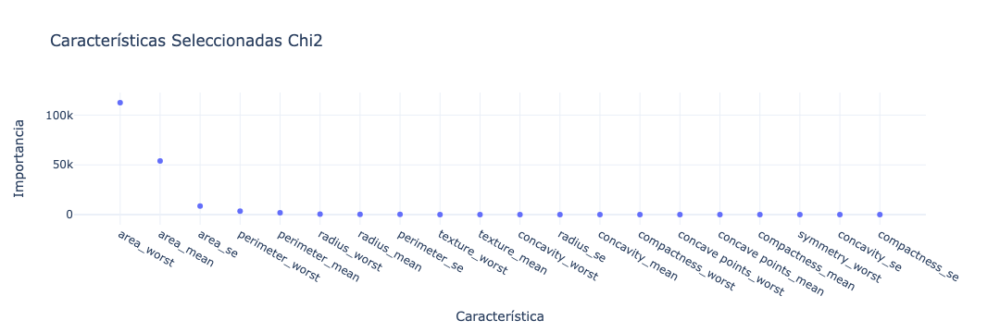

Características Seleccionadas ANOVA:


,Feature,Importance
18,concave points_worst,964.385393
13,perimeter_worst,897.944219
6,concave points_mean,861.676020
11,radius_worst,860.781707
2,perimeter_mean,697.235272
14,area_worst,661.600206
0,radius_mean,646.981021
3,area_mean,573.060747
5,concavity_mean,533.793126
17,concavity_worst,436.691939


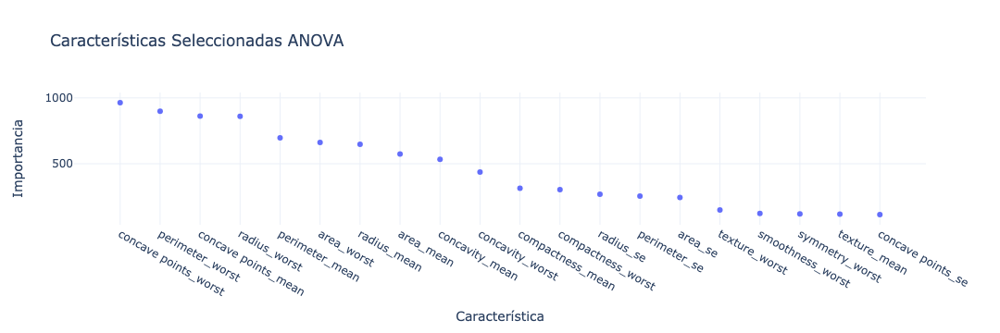

Características Seleccionadas Mutual info:


,Feature,Importance
14,perimeter_worst,0.471315
15,area_worst,0.465511
12,radius_worst,0.453867
6,concave points_mean,0.440300
19,concave points_worst,0.435186
2,perimeter_mean,0.403741
5,concavity_mean,0.374641
0,radius_mean,0.367389
3,area_mean,0.360078
9,area_se,0.339707


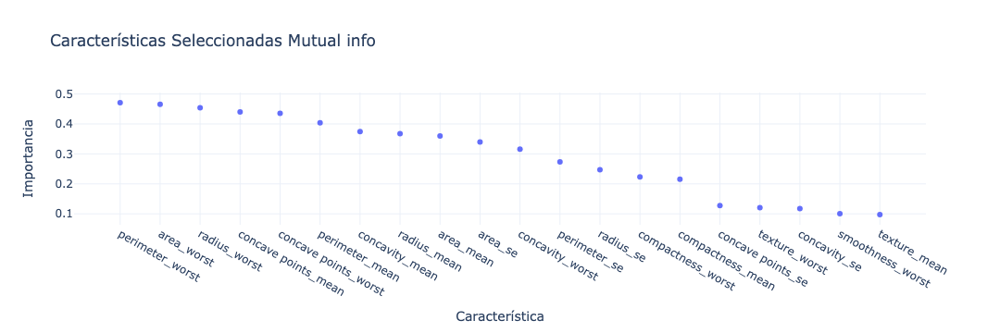

In [39]:
# Primer bloque de código
k_best_features1 = 20
selector1 = SelectKBest(chi2, k=k_best_features1)
X_new1 = selector1.fit_transform(X, y)

selected_features1 = selector1.get_support(indices=True)
selected_feature_names1 = [feature_columns[i] for i in selected_features1]

selected_features_df1 = pd.DataFrame({
    'Feature': selected_feature_names1,
    'Importance': selector1.scores_[selected_features1]
})
selected_features_df1 = selected_features_df1.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas Chi2:")
display(selected_features_df1)

fig1 = px.scatter(
    selected_features_df1,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Chi2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig1.show()

# Segundo bloque de código
k_best_features2 = 20
selector2 = SelectKBest(f_classif, k=k_best_features2)
X_new2 = selector2.fit_transform(X, y)

selected_features2 = selector2.get_support(indices=True)
selected_feature_names2 = [feature_columns[i] for i in selected_features2]

selected_features_df2 = pd.DataFrame({
    'Feature': selected_feature_names2,
    'Importance': selector2.scores_[selected_features2]
})
selected_features_df2 = selected_features_df2.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas ANOVA:")
display(selected_features_df2)

fig2 = px.scatter(
    selected_features_df2,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas ANOVA',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()

# Tercer bloque de código
k_best_features3 = 20
selector3 = SelectKBest(mutual_info_classif, k=k_best_features3)
X_new3 = selector3.fit_transform(X, y)

selected_features3 = selector3.get_support(indices=True)
selected_feature_names3 = [feature_columns[i] for i in selected_features3]

selected_features_df3 = pd.DataFrame({
    'Feature': selected_feature_names3,
    'Importance': selector3.scores_[selected_features3]
})
selected_features_df3 = selected_features_df3.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas Mutual info:")
display(selected_features_df3)

fig3 = px.scatter(
    selected_features_df3,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Mutual info',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig3.show()

## Selección de atributos ##

Características Seleccionadas Chi2:


,Feature,Importance
11,area_worst,112598.431564
3,area_mean,53991.655924
7,area_se,8758.504705
10,perimeter_worst,3665.035416
2,perimeter_mean,2011.102864
8,radius_worst,491.689157
0,radius_mean,266.104917
6,perimeter_se,250.571896
9,texture_worst,174.449400
1,texture_mean,93.897508


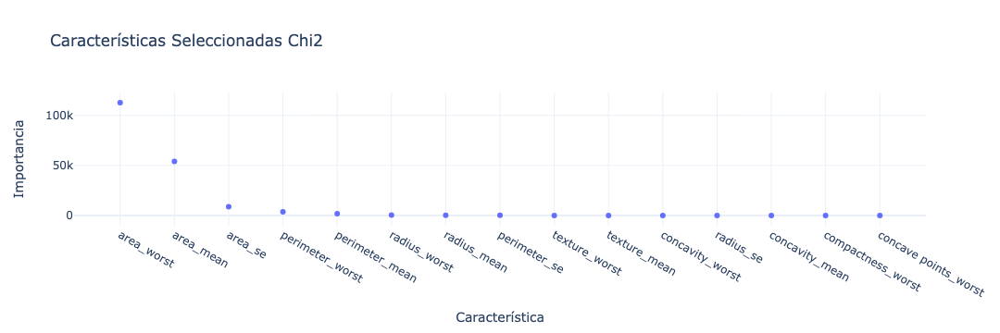

Características Seleccionadas ANOVA:


,Feature,Importance
14,concave points_worst,964.385393
10,perimeter_worst,897.944219
5,concave points_mean,861.676020
9,radius_worst,860.781707
1,perimeter_mean,697.235272
11,area_worst,661.600206
0,radius_mean,646.981021
2,area_mean,573.060747
4,concavity_mean,533.793126
13,concavity_worst,436.691939


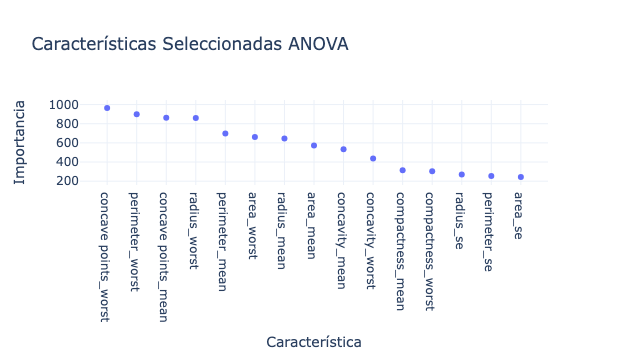

Características Seleccionadas Mutual info:


,Feature,Importance
10,perimeter_worst,0.476690
11,area_worst,0.462819
9,radius_worst,0.457105
14,concave points_worst,0.439567
5,concave points_mean,0.439054
1,perimeter_mean,0.402661
4,concavity_mean,0.374657
0,radius_mean,0.361039
2,area_mean,0.359517
8,area_se,0.339121


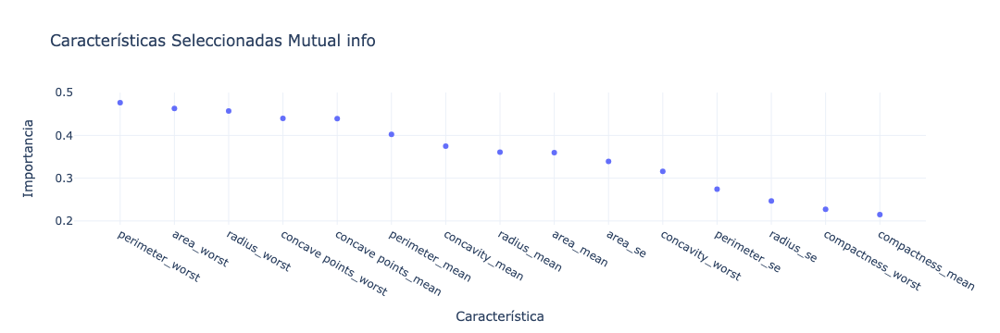

In [40]:
# Primer bloque de código
k_best_features1 = 15
selector1 = SelectKBest(chi2, k=k_best_features1)
X_new1 = selector1.fit_transform(X, y)

selected_features1 = selector1.get_support(indices=True)
selected_feature_names1 = [feature_columns[i] for i in selected_features1]

selected_features_df1 = pd.DataFrame({
    'Feature': selected_feature_names1,
    'Importance': selector1.scores_[selected_features1]
})
selected_features_df1 = selected_features_df1.sort_values(by='Importance', ascending=False).head(15)

print("Características Seleccionadas Chi2:")
display(selected_features_df1)

# Crear DataFrame Select1
SelectKBest1 = pd.DataFrame(X[selected_features_df1['Feature'].tolist()])

fig1 = px.scatter(
    selected_features_df1,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Chi2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig1.show()

# Segundo bloque de código
k_best_features2 = 15
selector2 = SelectKBest(f_classif, k=k_best_features2)
X_new2 = selector2.fit_transform(X, y)

selected_features2 = selector2.get_support(indices=True)
selected_feature_names2 = [feature_columns[i] for i in selected_features2]

selected_features_df2 = pd.DataFrame({
    'Feature': selected_feature_names2,
    'Importance': selector2.scores_[selected_features2]
})
selected_features_df2 = selected_features_df2.sort_values(by='Importance', ascending=False).head(15)

print("Características Seleccionadas ANOVA:")
display(selected_features_df2)

# Crear DataFrame Select2
SelectKBest2 = pd.DataFrame(X[selected_features_df2['Feature'].tolist()])

fig2 = px.scatter(
    selected_features_df2,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas ANOVA',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()

# Tercer bloque de código
k_best_features3 = 15
selector3 = SelectKBest(mutual_info_classif, k=k_best_features3)
X_new3 = selector3.fit_transform(X, y)

selected_features3 = selector3.get_support(indices=True)
selected_feature_names3 = [feature_columns[i] for i in selected_features3]

selected_features_df3 = pd.DataFrame({
    'Feature': selected_feature_names3,
    'Importance': selector3.scores_[selected_features3]
})
selected_features_df3 = selected_features_df3.sort_values(by='Importance', ascending=False).head(15)

print("Características Seleccionadas Mutual info:")
display(selected_features_df3)

# Crear DataFrame Select3
SelectKBest3 = pd.DataFrame(X[selected_features_df3['Feature'].tolist()])

fig3 = px.scatter(
    selected_features_df3,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Mutual info',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig3.show()



<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: lavender;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">SelectPercentile
    
</h2>
</div>

Características Seleccionadas Chi2:


,Feature,Importance
23,area_worst,112598.431564
3,area_mean,53991.655924
13,area_se,8758.504705
22,perimeter_worst,3665.035416
2,perimeter_mean,2011.102864
20,radius_worst,491.689157
0,radius_mean,266.104917
12,perimeter_se,250.571896
21,texture_worst,174.449400
1,texture_mean,93.897508


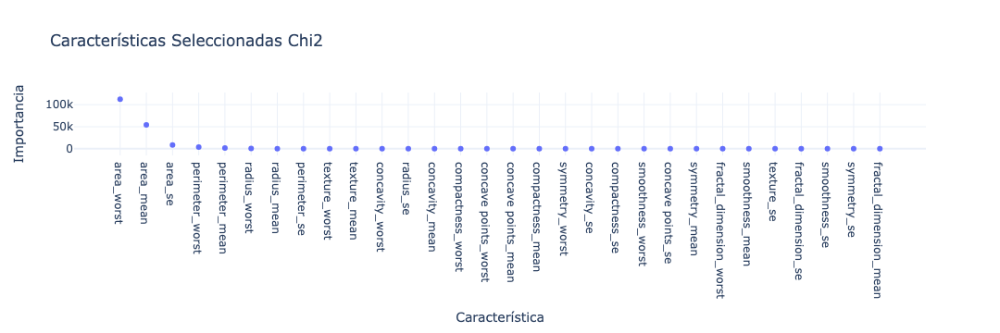

Características Seleccionadas ANOVA:


,Feature,Importance
14,concave points_worst,964.385393
10,perimeter_worst,897.944219
5,concave points_mean,861.676020
9,radius_worst,860.781707
1,perimeter_mean,697.235272
11,area_worst,661.600206
0,radius_mean,646.981021
2,area_mean,573.060747
4,concavity_mean,533.793126
13,concavity_worst,436.691939


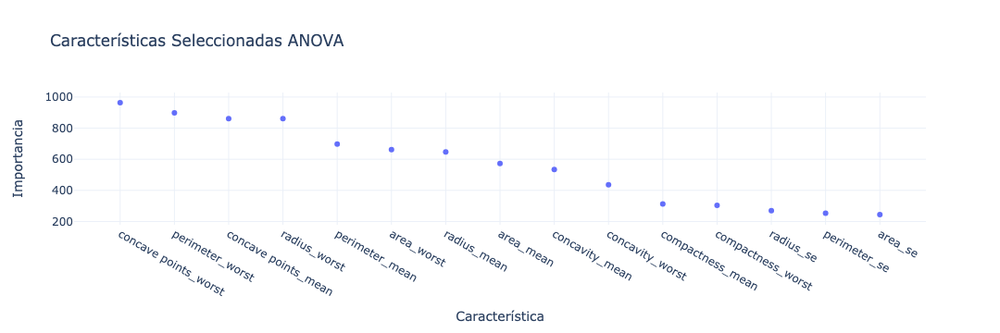

Características Seleccionadas Mutual info:


,Feature,Importance
10,perimeter_worst,0.476690
11,area_worst,0.462819
9,radius_worst,0.457105
14,concave points_worst,0.439567
5,concave points_mean,0.439054
1,perimeter_mean,0.402661
4,concavity_mean,0.374657
0,radius_mean,0.361039
2,area_mean,0.359517
8,area_se,0.339121


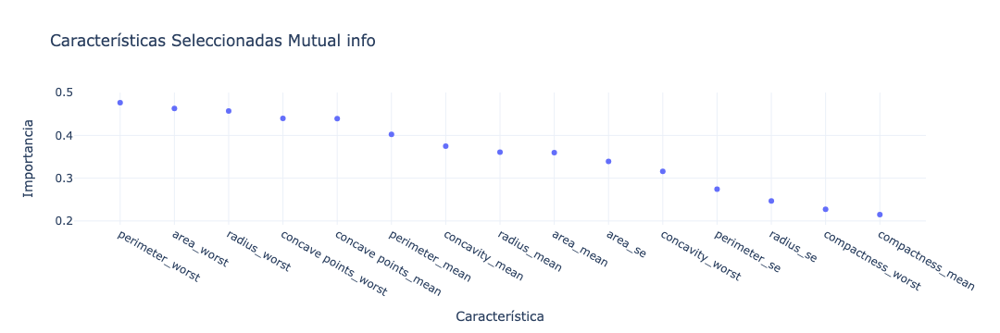

In [41]:
# Primer bloque de código
transformer1 = SelectPercentile(chi2, percentile=10).fit(X, y)
X_new1 = transformer1.transform(X)

selected_features_df1 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer1.scores_
})
selected_features_df1 = selected_features_df1.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas Chi2:")
display(selected_features_df1)

fig1 = px.scatter(
    selected_features_df1,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Chi2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig1.show()


transformer2 = SelectPercentile(f_classif, percentile=10).fit(X, y)
X_new2 = transformer2.transform(X)

selected_features_d2 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer2.scores_
})
selected_features_d2 = selected_features_df2.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas ANOVA:")
display(selected_features_df2)

fig2 = px.scatter(
    selected_features_df2,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas ANOVA',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()

transformer3 = SelectPercentile(mutual_info_classif, percentile=10).fit(X, y)
X_new3 = transformer3.transform(X)

selected_features_d3 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer3.scores_
})
selected_features_d3 = selected_features_df3.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas Mutual info:")
display(selected_features_df3)

fig3 = px.scatter(
    selected_features_df3,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Mutual info',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig3.show()

## Selección de atributos ##

Características Seleccionadas Chi2:


,Feature,Importance
23,area_worst,112598.431564
3,area_mean,53991.655924
13,area_se,8758.504705
22,perimeter_worst,3665.035416
2,perimeter_mean,2011.102864
20,radius_worst,491.689157
0,radius_mean,266.104917
12,perimeter_se,250.571896
21,texture_worst,174.449400
1,texture_mean,93.897508


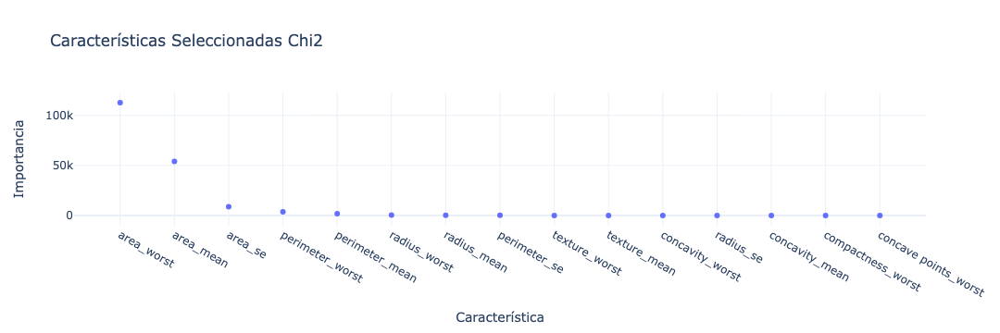

Características Seleccionadas ANOVA:


,Feature,Importance
27,concave points_worst,964.385393
22,perimeter_worst,897.944219
7,concave points_mean,861.676020
20,radius_worst,860.781707
2,perimeter_mean,697.235272
23,area_worst,661.600206
0,radius_mean,646.981021
3,area_mean,573.060747
6,concavity_mean,533.793126
26,concavity_worst,436.691939


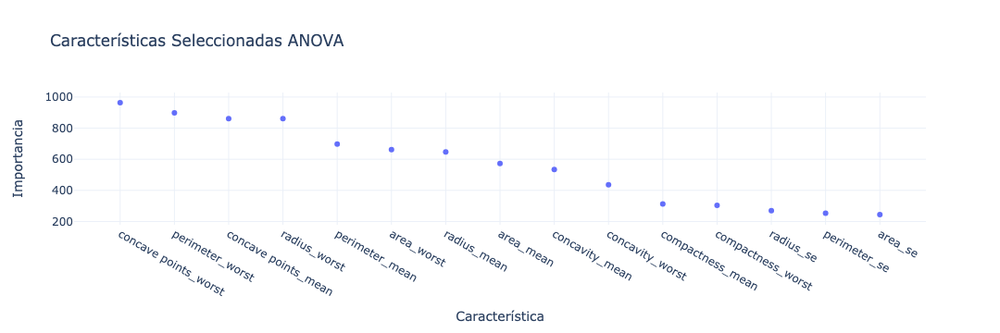

Características Seleccionadas Mutual info:


,Feature,Importance
22,perimeter_worst,0.478538
23,area_worst,0.464017
20,radius_worst,0.452044
7,concave points_mean,0.440300
27,concave points_worst,0.437170
2,perimeter_mean,0.406131
6,concavity_mean,0.374350
0,radius_mean,0.367703
3,area_mean,0.359131
13,area_se,0.340443


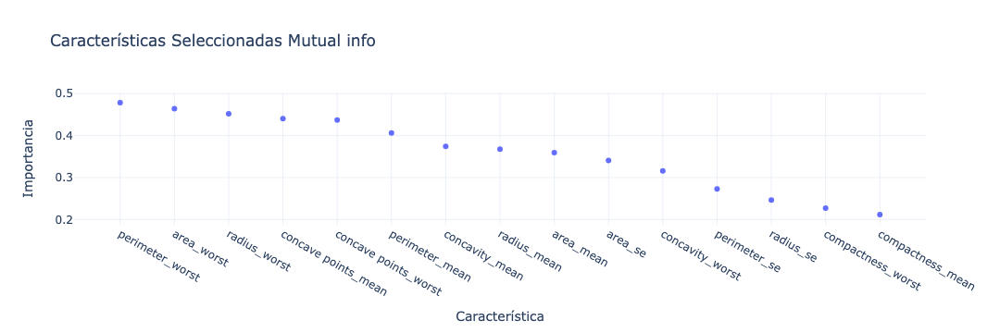

In [42]:
from sklearn.feature_selection import SelectPercentile, chi2, f_classif, mutual_info_classif

# Primer bloque de código
transformer1 = SelectPercentile(chi2, percentile=10).fit(X, y)
X_new1 = transformer1.transform(X)

selected_features_df1 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer1.scores_
})
selected_features_df1 = selected_features_df1.sort_values(by='Importance', ascending=False)

# Seleccionar solo los primeros 15 atributos
selected_features1 = selected_features_df1['Feature'].head(15).tolist()

# Crear DataFrame SelectPercentileTrans1
SelectPercentileTrans1 = pd.DataFrame(X[selected_features1])

print("Características Seleccionadas Chi2:")
display(selected_features_df1.head(15))

fig1 = px.scatter(
    selected_features_df1.head(15),
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Chi2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig1.show()

# Segundo bloque de código
transformer2 = SelectPercentile(f_classif, percentile=10).fit(X, y)
X_new2 = transformer2.transform(X)

selected_features_df2 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer2.scores_
})
selected_features_df2 = selected_features_df2.sort_values(by='Importance', ascending=False)

# Seleccionar solo los primeros 15 atributos
selected_features2 = selected_features_df2['Feature'].head(15).tolist()

# Crear DataFrame SelectPercentileTrans2
SelectPercentileTrans2 = pd.DataFrame(X[selected_features2])

print("Características Seleccionadas ANOVA:")
display(selected_features_df2.head(15))

fig2 = px.scatter(
    selected_features_df2.head(15),
    x='Feature',
    y='Importance',
    title='Características Seleccionadas ANOVA',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()

# Tercer bloque de código
transformer3 = SelectPercentile(mutual_info_classif, percentile=10).fit(X, y)
X_new3 = transformer3.transform(X)

selected_features_df3 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer3.scores_
})
selected_features_df3 = selected_features_df3.sort_values(by='Importance', ascending=False)

# Seleccionar solo los primeros 15 atributos
selected_features3 = selected_features_df3['Feature'].head(15).tolist()

# Crear DataFrame SelectPercentileTrans3
SelectPercentileTrans3 = pd.DataFrame(X[selected_features3])

print("Características Seleccionadas Mutual info:")
display(selected_features_df3.head(15))

fig3 = px.scatter(
    selected_features_df3.head(15),
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Mutual info',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig3.show()





<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: lavender;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">SelectFpr
</h2>
</div>

Características Seleccionadas Chi2:


,Feature,Importance
23,area_worst,112598.431564
3,area_mean,53991.655924
13,area_se,8758.504705
22,perimeter_worst,3665.035416
2,perimeter_mean,2011.102864
20,radius_worst,491.689157
0,radius_mean,266.104917
12,perimeter_se,250.571896
21,texture_worst,174.449400
1,texture_mean,93.897508


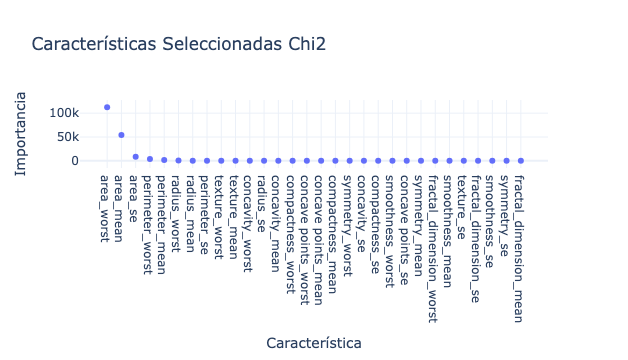

Características Seleccionadas ANOVA:


,Feature,Importance
27,concave points_worst,964.385393
22,perimeter_worst,897.944219
7,concave points_mean,861.676020
20,radius_worst,860.781707
2,perimeter_mean,697.235272
23,area_worst,661.600206
0,radius_mean,646.981021
3,area_mean,573.060747
6,concavity_mean,533.793126
26,concavity_worst,436.691939


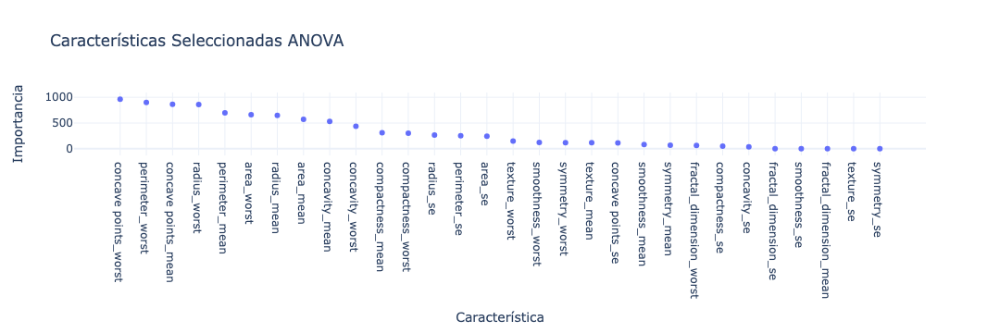

In [43]:
#Primer bloque de código
transformer1 = SelectFpr(chi2, alpha=0.01).fit(X, y)
X_new1 = transformer1.transform(X)

selected_features_df1 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer1.scores_
})
selected_features_df1 = selected_features_df1.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas Chi2:")
display(selected_features_df1)

fig1 = px.scatter(
    selected_features_df1,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Chi2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig1.show()

# Primer bloque de código
transformer2 = SelectFpr(f_classif, alpha=0.01).fit(X, y)
X_new2 = transformer2.transform(X)

selected_features_df2 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer2.scores_
})
selected_features_df2 = selected_features_df2.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas ANOVA:")
display(selected_features_df2)

fig2 = px.scatter(
    selected_features_df2,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas ANOVA',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()

## Selección de atributos ##

Características Seleccionadas Chi2:


,Feature,Importance
23,area_worst,112598.431564
3,area_mean,53991.655924
13,area_se,8758.504705
22,perimeter_worst,3665.035416
2,perimeter_mean,2011.102864
20,radius_worst,491.689157
0,radius_mean,266.104917
12,perimeter_se,250.571896
21,texture_worst,174.449400
1,texture_mean,93.897508


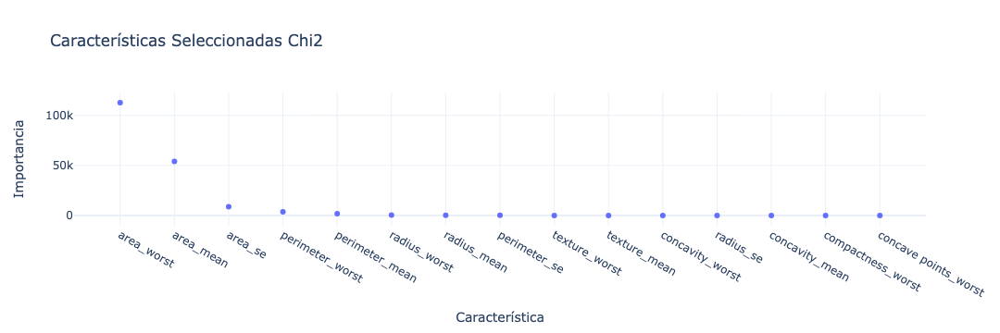

Características Seleccionadas ANOVA:


,Feature,Importance
27,concave points_worst,964.385393
22,perimeter_worst,897.944219
7,concave points_mean,861.676020
20,radius_worst,860.781707
2,perimeter_mean,697.235272
23,area_worst,661.600206
0,radius_mean,646.981021
3,area_mean,573.060747
6,concavity_mean,533.793126
26,concavity_worst,436.691939


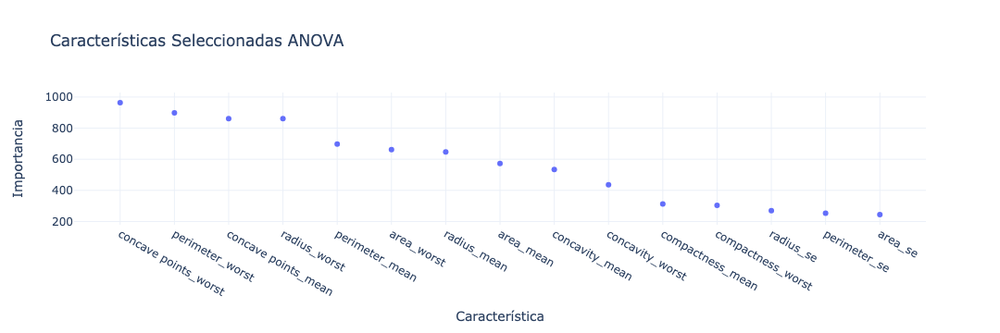

In [44]:
# Primer bloque de código
transformer1 = SelectFpr(chi2, alpha=0.01).fit(X, y)
X_new1 = transformer1.transform(X)

selected_features_df1 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer1.scores_
})
selected_features_df1 = selected_features_df1.sort_values(by='Importance', ascending=False)

# Seleccionar solo los primeros 15 atributos
selected_features1 = selected_features_df1['Feature'].head(15).tolist()

# Crear DataFrame SelectFprTrans1
SelectFprTrans1 = pd.DataFrame(X[selected_features1])

print("Características Seleccionadas Chi2:")
display(selected_features_df1.head(15))

fig1 = px.scatter(
    selected_features_df1.head(15),
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Chi2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig1.show()

# Segundo bloque de código
transformer2 = SelectFpr(f_classif, alpha=0.01).fit(X, y)
X_new2 = transformer2.transform(X)

selected_features_df2 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer2.scores_
})
selected_features_df2 = selected_features_df2.sort_values(by='Importance', ascending=False)

# Seleccionar solo los primeros 15 atributos
selected_features2 = selected_features_df2['Feature'].head(15).tolist()

# Crear DataFrame SelectFprTrans2
SelectFprTrans2 = pd.DataFrame(X[selected_features2])

print("Características Seleccionadas ANOVA:")
display(selected_features_df2.head(15))

fig2 = px.scatter(
    selected_features_df2.head(15),
    x='Feature',
    y='Importance',
    title='Características Seleccionadas ANOVA',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()


<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: lavender;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">SelectFdr
</h2>
</div>

Características Seleccionadas Chi2:


,Feature,Importance
23,area_worst,112598.431564
3,area_mean,53991.655924
13,area_se,8758.504705
22,perimeter_worst,3665.035416
2,perimeter_mean,2011.102864
20,radius_worst,491.689157
0,radius_mean,266.104917
12,perimeter_se,250.571896
21,texture_worst,174.449400
1,texture_mean,93.897508


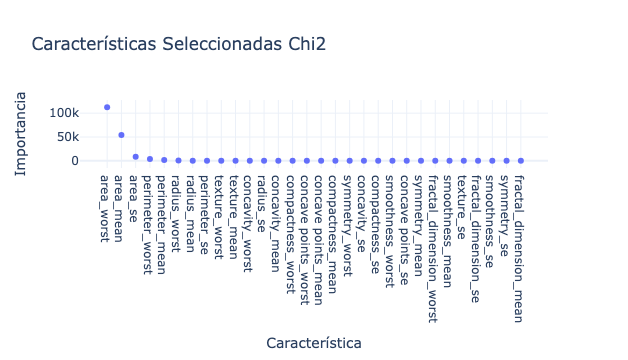

Características Seleccionadas ANOVA:


,Feature,Importance
27,concave points_worst,964.385393
22,perimeter_worst,897.944219
7,concave points_mean,861.676020
20,radius_worst,860.781707
2,perimeter_mean,697.235272
23,area_worst,661.600206
0,radius_mean,646.981021
3,area_mean,573.060747
6,concavity_mean,533.793126
26,concavity_worst,436.691939


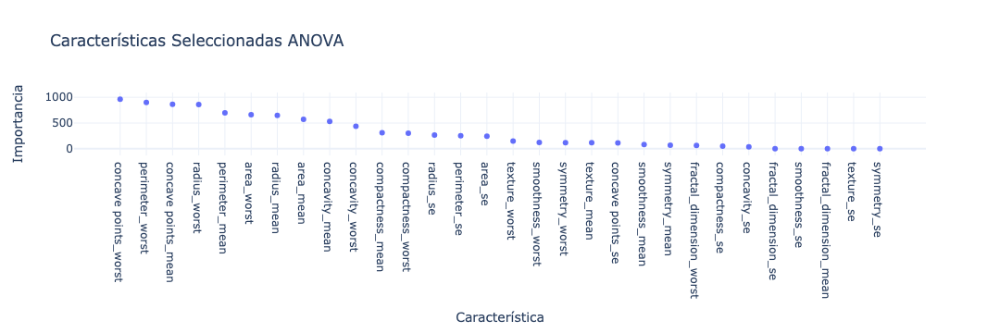

In [45]:
# Primer bloque de código
transformer1 = SelectFdr(chi2, alpha=0.01).fit(X, y)
X_new1 = transformer1.transform(X)

selected_features_df1 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer1.scores_
})
selected_features_df1 = selected_features_df1.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas Chi2:")
display(selected_features_df1)

fig1 = px.scatter(
    selected_features_df1,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Chi2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig1.show()

# Segundo bloque de código
transformer2 = SelectFdr(f_classif, alpha=0.01).fit(X, y)
X_new2 = transformer2.transform(X)

selected_features_df2 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer2.scores_
})
selected_features_df2 = selected_features_df2.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas ANOVA:")
display(selected_features_df2)

fig2 = px.scatter(
    selected_features_df2,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas ANOVA',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()


## Selección de atributos ##

Características Seleccionadas Chi2:


,Feature,Importance
23,area_worst,112598.431564
3,area_mean,53991.655924
13,area_se,8758.504705
22,perimeter_worst,3665.035416
2,perimeter_mean,2011.102864
20,radius_worst,491.689157
0,radius_mean,266.104917
12,perimeter_se,250.571896
21,texture_worst,174.449400
1,texture_mean,93.897508


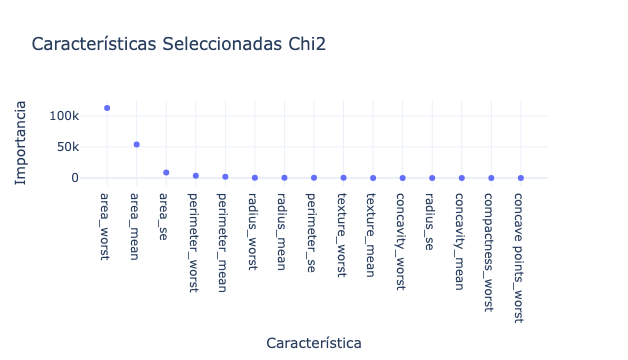

Características Seleccionadas ANOVA:


,Feature,Importance
27,concave points_worst,964.385393
22,perimeter_worst,897.944219
7,concave points_mean,861.676020
20,radius_worst,860.781707
2,perimeter_mean,697.235272
23,area_worst,661.600206
0,radius_mean,646.981021
3,area_mean,573.060747
6,concavity_mean,533.793126
26,concavity_worst,436.691939


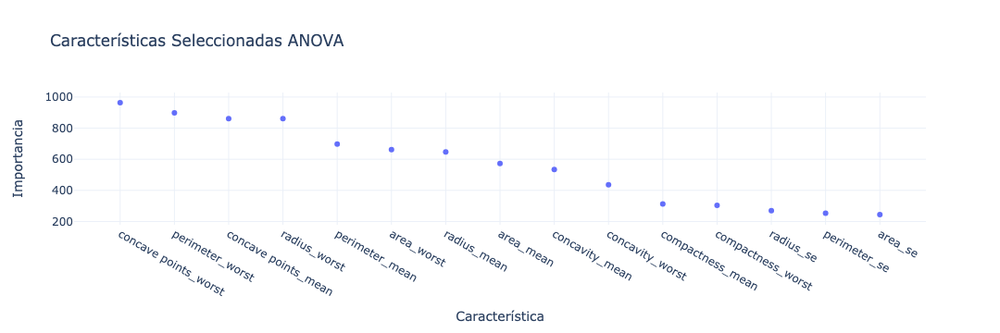

In [46]:
# Primer bloque de código
transformer1 = SelectFdr(chi2, alpha=0.01).fit(X, y)
X_new1 = transformer1.transform(X)

selected_features_df1 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer1.scores_
})
selected_features_df1 = selected_features_df1.sort_values(by='Importance', ascending=False)

# Seleccionar solo los primeros 15 atributos
selected_features1 = selected_features_df1['Feature'].head(15).tolist()

# Crear DataFrame SelectFdrTrans1
SelectFdrTrans1 = pd.DataFrame(X[selected_features1])

print("Características Seleccionadas Chi2:")
display(selected_features_df1.head(15))

fig1 = px.scatter(
    selected_features_df1.head(15),
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Chi2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig1.show()

# Segundo bloque de código
transformer2 = SelectFdr(f_classif, alpha=0.01).fit(X, y)
X_new2 = transformer2.transform(X)

selected_features_df2 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer2.scores_
})
selected_features_df2 = selected_features_df2.sort_values(by='Importance', ascending=False)

# Seleccionar solo los primeros 15 atributos
selected_features2 = selected_features_df2['Feature'].head(15).tolist()

# Crear DataFrame SelectFdrTrans2
SelectFdrTrans2 = pd.DataFrame(X[selected_features2])

print("Características Seleccionadas ANOVA:")
display(selected_features_df2.head(15))

fig2 = px.scatter(
    selected_features_df2.head(15),
    x='Feature',
    y='Importance',
    title='Características Seleccionadas ANOVA',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()


<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: lavender;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">SelectFwe
    
</h2>
</div>

Características Seleccionadas Chi2:


,Feature,Importance
23,area_worst,112598.431564
3,area_mean,53991.655924
13,area_se,8758.504705
22,perimeter_worst,3665.035416
2,perimeter_mean,2011.102864
20,radius_worst,491.689157
0,radius_mean,266.104917
12,perimeter_se,250.571896
21,texture_worst,174.449400
1,texture_mean,93.897508


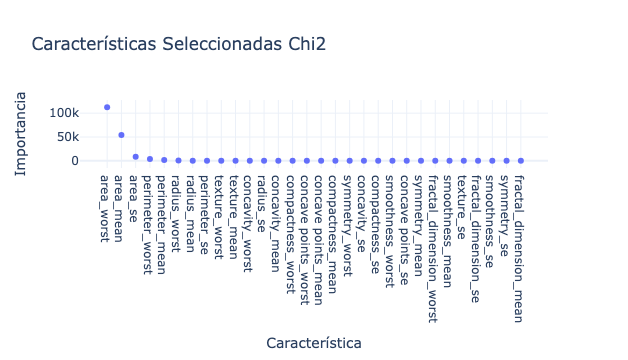

Características Seleccionadas ANOVA:


,Feature,Importance
27,concave points_worst,964.385393
22,perimeter_worst,897.944219
7,concave points_mean,861.676020
20,radius_worst,860.781707
2,perimeter_mean,697.235272
23,area_worst,661.600206
0,radius_mean,646.981021
3,area_mean,573.060747
6,concavity_mean,533.793126
26,concavity_worst,436.691939


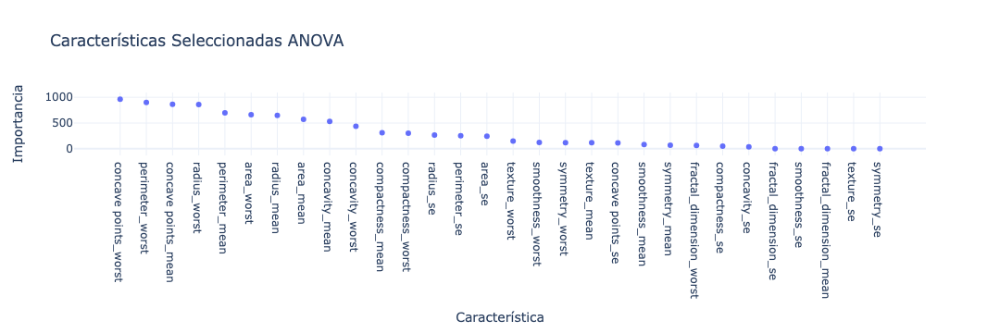

In [47]:
# Primer bloque de código
transformer1 = SelectFwe(chi2, alpha=0.01).fit(X, y)
X_new1 = transformer1.transform(X)

selected_features_df1 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer1.scores_
})
selected_features_df1 = selected_features_df1.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas Chi2:")
display(selected_features_df1)

fig1 = px.scatter(
    selected_features_df1,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas Chi2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig1.show()

# Segundo bloque de código
transformer2 = SelectFwe(f_classif, alpha=0.01).fit(X, y)
X_new2 = transformer2.transform(X)

selected_features_df2 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer2.scores_
})
selected_features_df2 = selected_features_df2.sort_values(by='Importance', ascending=False)

print("Características Seleccionadas ANOVA:")
display(selected_features_df2)

fig2 = px.scatter(
    selected_features_df2,
    x='Feature',
    y='Importance',
    title='Características Seleccionadas ANOVA',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()


## Selección de atributos ##

Características Seleccionadas Chi2:


,Feature,Importance,Selected
23,area_worst,112598.431564,True
3,area_mean,53991.655924,True
13,area_se,8758.504705,True
22,perimeter_worst,3665.035416,True
2,perimeter_mean,2011.102864,True
20,radius_worst,491.689157,True
0,radius_mean,266.104917,True
12,perimeter_se,250.571896,True
21,texture_worst,174.449400,True
1,texture_mean,93.897508,True


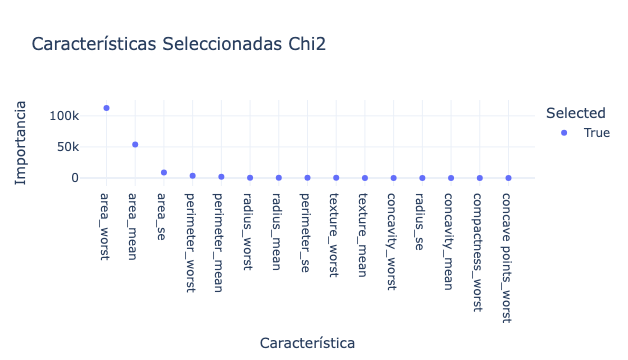

Características Seleccionadas ANOVA:


,Feature,Importance,Selected
27,concave points_worst,964.385393,True
22,perimeter_worst,897.944219,True
7,concave points_mean,861.676020,True
20,radius_worst,860.781707,True
2,perimeter_mean,697.235272,True
23,area_worst,661.600206,True
0,radius_mean,646.981021,True
3,area_mean,573.060747,True
6,concavity_mean,533.793126,True
26,concavity_worst,436.691939,True


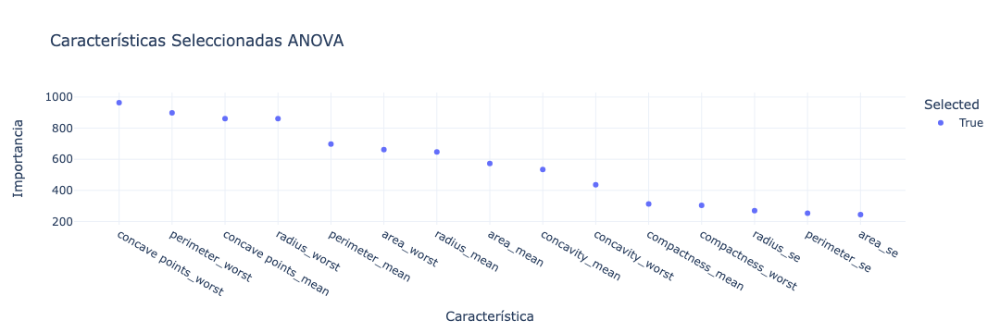

In [48]:
from sklearn.feature_selection import SelectFwe
import pandas as pd
import plotly.express as px

# Primer bloque de código
transformer1 = SelectFwe(chi2, alpha=0.01).fit(X, y)
X_new1 = transformer1.transform(X)

selected_features_df1 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer1.scores_,
    'Selected': transformer1.get_support()
})
selected_features_df1 = selected_features_df1.sort_values(by='Importance', ascending=False)

# Seleccionar solo los primeros 15 atributos
selected_features1 = selected_features_df1['Feature'].head(15).tolist()

# Crear DataFrame SelectFweTrans1
SelectFweTrans1 = pd.DataFrame(X[selected_features1])

print("Características Seleccionadas Chi2:")
display(selected_features_df1.head(15))

fig1 = px.scatter(
    selected_features_df1.head(15),
    x='Feature',
    y='Importance',
    color='Selected',
    title='Características Seleccionadas Chi2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig1.show()

# Segundo bloque de código
transformer2 = SelectFwe(f_classif, alpha=0.01).fit(X, y)
X_new2 = transformer2.transform(X)

selected_features_df2 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': transformer2.scores_,
    'Selected': transformer2.get_support()
})
selected_features_df2 = selected_features_df2.sort_values(by='Importance', ascending=False)

# Seleccionar solo los primeros 15 atributos
selected_features2 = selected_features_df2['Feature'].head(15).tolist()

# Crear DataFrame SelectFweTrans2
SelectFweTrans2 = pd.DataFrame(X[selected_features2])

print("Características Seleccionadas ANOVA:")
display(selected_features_df2.head(15))

fig2 = px.scatter(
    selected_features_df2.head(15),
    x='Feature',
    y='Importance',
    color='Selected',
    title='Características Seleccionadas ANOVA',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()



In [49]:
from sklearn.feature_selection import SelectFromModel
import plotly.express as px
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
import plotly.io as pio


<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: lavender;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">Árboles de Decisión y Bosques Aleatorios
</h2>
</div>

Características Seleccionadas:
['perimeter_mean', 'area_mean', 'concavity_mean', 'concave points_mean', 'area_se', 'radius_worst', 'perimeter_worst', 'area_worst', 'concave points_worst']
Número de Características Seleccionadas: 9
Umbral de Selección: 0.03333333333333333
Importancia de Características:


,Feature,Importance
23,area_worst,0.167854
22,perimeter_worst,0.145906
27,concave points_worst,0.137080
20,radius_worst,0.096304
3,area_mean,0.064836
7,concave points_mean,0.061732
6,concavity_mean,0.040175
0,radius_mean,0.035758
2,perimeter_mean,0.034816
26,concavity_worst,0.023177


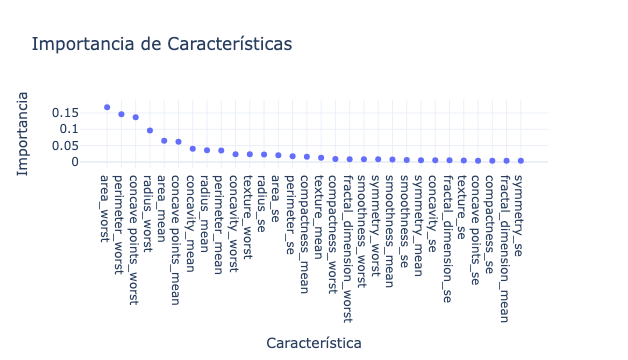

Características Seleccionadas para el modelo2:
['radius_mean', 'perimeter_mean', 'area_mean', 'concavity_mean', 'concave points_mean', 'area_se', 'radius_worst', 'perimeter_worst', 'area_worst', 'concave points_worst']
Número de Características Seleccionadas para el modelo2: 10
Umbral de Selección para el modelo2: 0.03333333333333333
Importancia de Características para el modelo2:


,Feature,Importance
7,concave points_mean,0.142556
23,area_worst,0.133519
22,perimeter_worst,0.129157
27,concave points_worst,0.095201
20,radius_worst,0.090165
3,area_mean,0.056552
0,radius_mean,0.044295
13,area_se,0.041988
6,concavity_mean,0.038444
2,perimeter_mean,0.033881


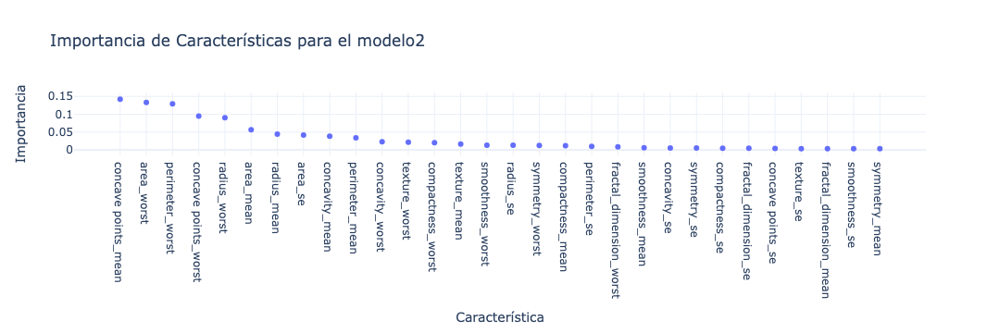

In [50]:
# Entrenar un modelo (Random Forest en este ejemplo)
model1 = RandomForestClassifier()
model1.fit(X, y)

# Utilizar SelectFromModel
sfm = SelectFromModel(model1, threshold='mean')  # Puedes ajustar el umbral según tus necesidades
sfm.fit(X, y)

# Transformar los datos
X_new = sfm.transform(X)

# Obtener las características seleccionadas
selected_features = [feature_columns[i] for i in range(len(feature_columns)) if sfm.get_support()[i]]

# Imprimir las características seleccionadas
print("Características Seleccionadas:")
print(selected_features)

# Imprimir el número de características seleccionadas
print("Número de Características Seleccionadas:", len(selected_features))

# Imprimir el umbral de selección
print("Umbral de Selección:", sfm.threshold_)

# Visualizar la importancia de las características
feature_importances = model1.feature_importances_
selected_features_df = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': feature_importances
})
selected_features_df = selected_features_df.sort_values(by='Importance', ascending=False)

print("Importancia de Características:")
display(selected_features_df)

# Visualizar la importancia de las características con Plotly
fig = px.scatter(
    selected_features_df,
    x='Feature',
    y='Importance',
    title='Importancia de Características',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig.show()

# Entrenar el modelo2 (Random Forest para clasificación)
model2 = RandomForestClassifier()
model2.fit(X, y)  # Asegúrate de que 'y' sea un vector de etiquetas de clase para un problema de clasificación

# Utilizar SelectFromModel para el modelo2
sfm2 = SelectFromModel(model2, threshold='mean')  # Puedes ajustar el umbral según tus necesidades
sfm2.fit(X, y)
X_new2 = sfm2.transform(X)

# Obtener las características seleccionadas para el modelo2
selected_features2 = [feature_columns[i] for i in range(len(feature_columns)) if sfm2.get_support()[i]]

# Imprimir las características seleccionadas para el modelo2
print("Características Seleccionadas para el modelo2:")
print(selected_features2)

# Imprimir el número de características seleccionadas para el modelo2
print("Número de Características Seleccionadas para el modelo2:", len(selected_features2))

# Imprimir el umbral de selección para el modelo2
print("Umbral de Selección para el modelo2:", sfm2.threshold_)

# Visualizar la importancia de las características para el modelo2
feature_importances2 = model2.feature_importances_
selected_features_df2 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': feature_importances2
})
selected_features_df2 = selected_features_df2.sort_values(by='Importance', ascending=False)

print("Importancia de Características para el modelo2:")
display(selected_features_df2)

# Visualizar la importancia de las características con Plotly para el modelo2
fig2 = px.scatter(
    selected_features_df2,
    x='Feature',
    y='Importance',
    title='Importancia de Características para el modelo2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()


Características Seleccionadas para el model3:
['radius_worst', 'texture_worst', 'concave points_worst']
Número de Características Seleccionadas para el model3: 3
Umbral de Selección para el model3: 0.03333333333333334
Importancia de Características para el model3:


,Feature,Importance
20,radius_worst,0.695594
27,concave points_worst,0.119372
21,texture_worst,0.057354
15,compactness_se,0.031841
1,texture_mean,0.031208
24,smoothness_worst,0.013027
23,area_worst,0.011086
6,concavity_mean,0.008771
29,fractal_dimension_worst,0.007316
4,smoothness_mean,0.007017


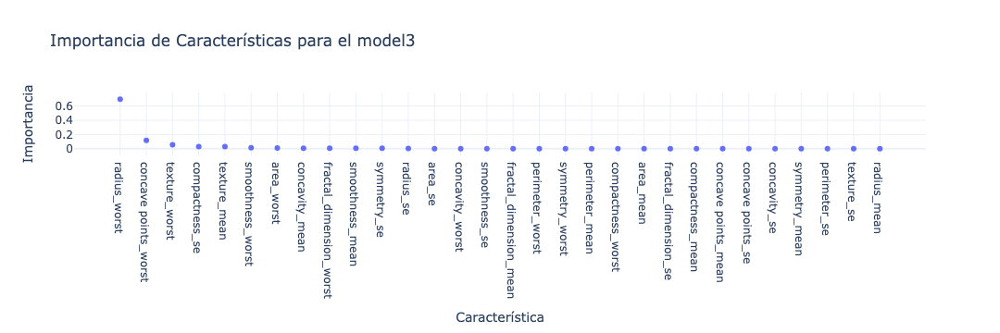

In [51]:
# Entrenar el model3 (Decision Tree para clasificación)
model3 = DecisionTreeClassifier()
model3.fit(X, y)

# Utilizar SelectFromModel para el model3
sfm3 = SelectFromModel(model3, threshold='mean')  # Puedes ajustar el umbral según tus necesidades
sfm3.fit(X, y)
X_new3 = sfm3.transform(X)

# Obtener las características seleccionadas para el model3
selected_features3 = [feature_columns[i] for i in range(len(feature_columns)) if sfm3.get_support()[i]]

# Imprimir las características seleccionadas para el model3
print("Características Seleccionadas para el model3:")
print(selected_features3)

# Imprimir el número de características seleccionadas para el model3
print("Número de Características Seleccionadas para el model3:", len(selected_features3))

# Imprimir el umbral de selección para el model3
print("Umbral de Selección para el model3:", sfm3.threshold_)

# Visualizar la importancia de las características para el model3
feature_importances3 = model3.feature_importances_
selected_features_df3 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': feature_importances3
})
selected_features_df3 = selected_features_df3.sort_values(by='Importance', ascending=False)

print("Importancia de Características para el model3:")
display(selected_features_df3)

# Visualizar la importancia de las características con Plotly para el model3
fig3 = px.scatter(
    selected_features_df3,
    x='Feature',
    y='Importance',
    title='Importancia de Características para el model3',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig3.show()


## Selección de atributos ##

Características Seleccionadas para el modelo 1:
['radius_mean', 'perimeter_mean', 'area_mean', 'concave points_mean', 'area_se', 'radius_worst', 'perimeter_worst', 'area_worst', 'concave points_worst']
Número de Características Seleccionadas para el modelo 1: 9
Umbral de Selección para el modelo 1: 0.03333333333333333
Importancia de Características para el modelo 1:


,Feature,Importance
27,concave points_worst,0.136686
7,concave points_mean,0.125700
22,perimeter_worst,0.124280
20,radius_worst,0.097026
23,area_worst,0.095131
2,perimeter_mean,0.055153
13,area_se,0.050213
26,concavity_worst,0.047097
6,concavity_mean,0.045749
0,radius_mean,0.040983


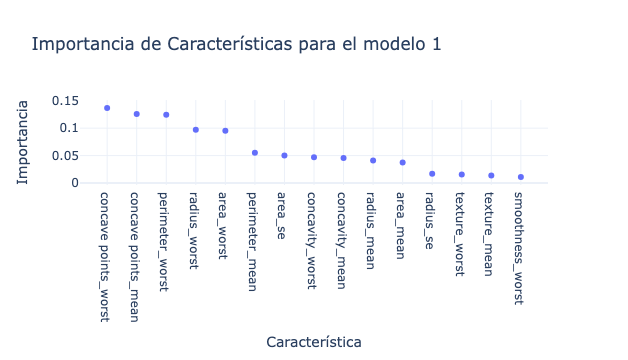

Características Seleccionadas para el modelo 2:
['radius_mean', 'area_mean', 'concavity_mean', 'concave points_mean', 'radius_worst', 'perimeter_worst', 'area_worst', 'concave points_worst']
Número de Características Seleccionadas para el modelo 2: 8
Umbral de Selección para el modelo 2: 0.03333333333333333
Importancia de Características para el modelo 2:


,Feature,Importance
20,radius_worst,0.141471
22,perimeter_worst,0.125526
23,area_worst,0.118808
7,concave points_mean,0.113443
27,concave points_worst,0.105568
6,concavity_mean,0.063661
3,area_mean,0.052800
13,area_se,0.039070
2,perimeter_mean,0.034185
0,radius_mean,0.026730


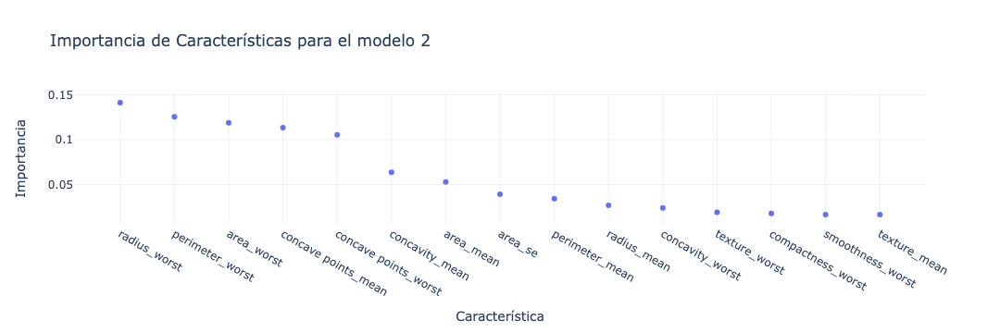

In [52]:
# Modelo 1 - Random Forest
model1 = RandomForestClassifier()
model1.fit(X, y)

# Utilizar SelectFromModel
sfm1 = SelectFromModel(model1, threshold='mean')
sfm1.fit(X, y)

# Obtener las características seleccionadas para el modelo 1
selected_features1 = [feature_columns[i] for i in range(len(feature_columns)) if sfm1.get_support()[i]][:15]

# Crear DataFrame RandomSelectFmodel1
RandomSelectFmodel1 = pd.DataFrame(X[selected_features1])

# Imprimir las características seleccionadas
print("Características Seleccionadas para el modelo 1:")
print(selected_features1)

# Imprimir el número de características seleccionadas
print("Número de Características Seleccionadas para el modelo 1:", len(selected_features1))

# Imprimir el umbral de selección
print("Umbral de Selección para el modelo 1:", sfm1.threshold_)

# Visualizar la importancia de las características
feature_importances1 = model1.feature_importances_
selected_features_df1 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': feature_importances1
})
selected_features_df1 = selected_features_df1.sort_values(by='Importance', ascending=False)

print("Importancia de Características para el modelo 1:")
display(selected_features_df1.head(15))

# Visualizar la importancia de las características con Plotly
fig1 = px.scatter(
    selected_features_df1.head(15),
    x='Feature',
    y='Importance',
    title='Importancia de Características para el modelo 1',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig1.show()

# Modelo 2 - Random Forest
model2 = RandomForestClassifier()
model2.fit(X, y)

# Utilizar SelectFromModel para el modelo 2
sfm2 = SelectFromModel(model2, threshold='mean')
sfm2.fit(X, y)

# Obtener las características seleccionadas para el modelo 2
selected_features2 = [feature_columns[i] for i in range(len(feature_columns)) if sfm2.get_support()[i]][:15]

# Crear DataFrame RandomSelectFmodel2
RandomSelectFmodel2 = pd.DataFrame(X[selected_features2])

# Imprimir las características seleccionadas para el modelo 2
print("Características Seleccionadas para el modelo 2:")
print(selected_features2)

# Imprimir el número de características seleccionadas para el modelo 2
print("Número de Características Seleccionadas para el modelo 2:", len(selected_features2))

# Imprimir el umbral de selección para el modelo 2
print("Umbral de Selección para el modelo 2:", sfm2.threshold_)

# Visualizar la importancia de las características para el modelo 2
feature_importances2 = model2.feature_importances_
selected_features_df2 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': feature_importances2
})
selected_features_df2 = selected_features_df2.sort_values(by='Importance', ascending=False)

print("Importancia de Características para el modelo 2:")
display(selected_features_df2.head(15))

# Visualizar la importancia de las características con Plotly para el modelo 2
fig2 = px.scatter(
    selected_features_df2.head(15),
    x='Feature',
    y='Importance',
    title='Importancia de Características para el modelo 2',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig2.show()




Características Seleccionadas para el model3:
['texture_mean', 'radius_worst', 'texture_worst', 'concave points_worst']
Número de Características Seleccionadas para el model3: 4
Umbral de Selección para el model3: 0.03333333333333333
Importancia de Características para el model3:


,Feature,Importance
20,radius_worst,0.695594
27,concave points_worst,0.113988
21,texture_worst,0.057354
7,concave points_mean,0.031841
1,texture_mean,0.031208
4,smoothness_mean,0.012655
23,area_worst,0.011086
13,area_se,0.009361
6,concavity_mean,0.008771
14,smoothness_se,0.007448


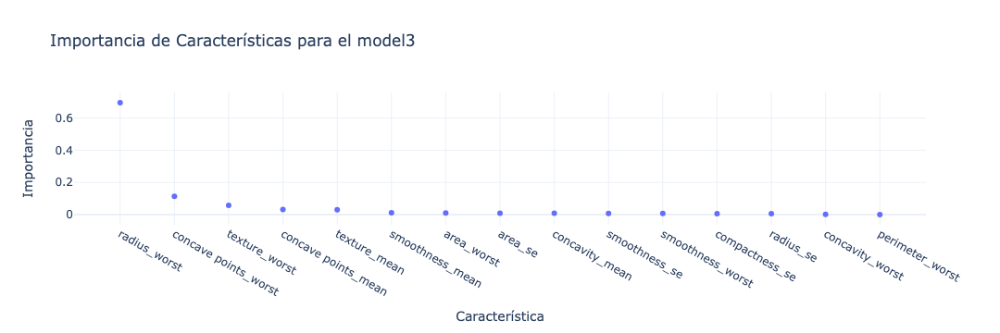

In [53]:
# Entrenar el model3 (Decision Tree para clasificación)
model3 = DecisionTreeClassifier()
model3.fit(X, y)

# Utilizar SelectFromModel para el model3
sfm3 = SelectFromModel(model3, threshold='mean')  # Puedes ajustar el umbral según tus necesidades
sfm3.fit(X, y)

# Obtener las características seleccionadas para el model3
selected_features3 = [feature_columns[i] for i in range(len(feature_columns)) if sfm3.get_support()[i]][:15]

# Crear DataFrame DecisionTreeSelectFmodel3
DecisionTreeSelectFmodel3 = pd.DataFrame(X[selected_features3])

# Imprimir las características seleccionadas para el model3
print("Características Seleccionadas para el model3:")
print(selected_features3)

# Imprimir el número de características seleccionadas para el model3
print("Número de Características Seleccionadas para el model3:", len(selected_features3))

# Imprimir el umbral de selección para el model3
print("Umbral de Selección para el model3:", sfm3.threshold_)

# Visualizar la importancia de las características para el model3
feature_importances3 = model3.feature_importances_
selected_features_df3 = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': feature_importances3
})
selected_features_df3 = selected_features_df3.sort_values(by='Importance', ascending=False)

print("Importancia de Características para el model3:")
display(selected_features_df3.head(15))

# Visualizar la importancia de las características con Plotly para el model3
fig3 = px.scatter(
    selected_features_df3.head(15),
    x='Feature',
    y='Importance',
    title='Importancia de Características para el model3',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig3.show()



<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: lavender;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">Modelos Lineales con Regularización:
    
</h2>
</div>


In [54]:
from sklearn.linear_model import Lasso, Ridge
from sklearn.preprocessing import LabelEncoder


Características Seleccionadas para el model5:
['perimeter_worst', 'area_worst']
Número de Características Seleccionadas para el model5: 2
Umbral de Selección para el model5: 9.727194783674809e-05
Coeficientes de Características para el model5:


,Feature,Coefficient
22,perimeter_worst,0.002438
23,area_worst,0.000480
0,radius_mean,0.000000
1,texture_mean,0.000000
28,symmetry_worst,0.000000
27,concave points_worst,0.000000
26,concavity_worst,0.000000
25,compactness_worst,0.000000
24,smoothness_worst,0.000000
21,texture_worst,0.000000


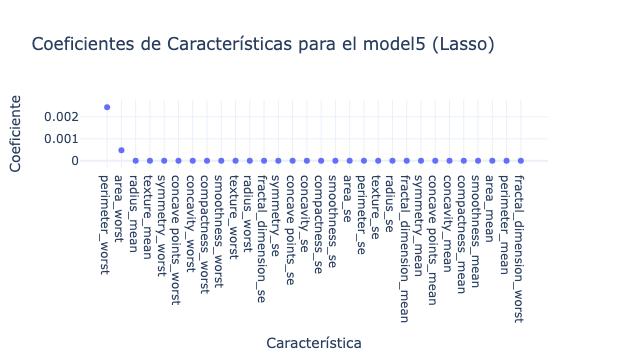

Características Seleccionadas para el model6:
['radius_mean', 'smoothness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'radius_se', 'concavity_se', 'radius_worst', 'smoothness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst']
Número de Características Seleccionadas para el model6: 12
Umbral de Selección para el model6: 0.126924126759204
Coeficientes de Características para el model6:


,Feature,Coefficient
27,concave points_worst,0.489583
24,smoothness_worst,0.379884
28,symmetry_worst,0.362810
26,concavity_worst,0.319381
7,concave points_mean,0.293810
20,radius_worst,0.265159
16,concavity_se,-0.259569
10,radius_se,0.250499
6,concavity_mean,0.222263
0,radius_mean,-0.176342


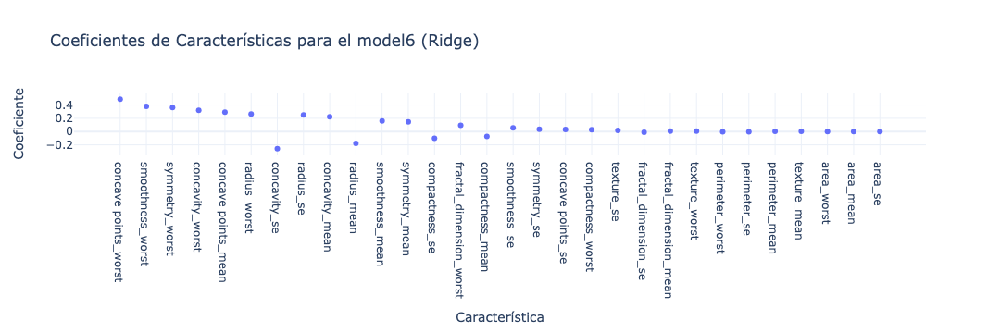

In [55]:
# Convertir etiquetas de destino a valores numéricos
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)


# Entrenar el model5 (Lasso)
model5 = Lasso()
model5.fit(X, y_encoded) # Asegúrate de que 'y' sea un vector de valores numéricos

# Utilizar SelectFromModel para el model5
sfm5 = SelectFromModel(model5, threshold='mean')  # Puedes ajustar el umbral según tus necesidades
sfm5.fit(X, y_encoded)
X_new5 = sfm5.transform(X)

selected_features5 = [feature_columns[i] for i in range(len(feature_columns)) if sfm5.get_support()[i]]

# Imprimir las características seleccionadas para el model5
print("Características Seleccionadas para el model5:")
print(selected_features5)

# Imprimir el número de características seleccionadas para el model5
print("Número de Características Seleccionadas para el model5:", len(selected_features5))

# Imprimir el umbral de selección para el model5
print("Umbral de Selección para el model5:", sfm5.threshold_)

# Visualizar la importancia de las características para el model5
coefficients5 = model5.coef_
selected_features_df5 = pd.DataFrame({
    'Feature': feature_columns,
    'Coefficient': coefficients5
})
selected_features_df5 = selected_features_df5.sort_values(by='Coefficient', key=abs, ascending=False)

print("Coeficientes de Características para el model5:")
display(selected_features_df5)

fig5 = px.scatter(
    selected_features_df5,
    x='Feature',
    y='Coefficient',
    title='Coeficientes de Características para el model5 (Lasso)',
    labels={'Coefficient': 'Coeficiente', 'Feature': 'Característica'},
    template='plotly_white'
)
fig5.show()

# Entrenar el model6 (Ridge)
model6 = Ridge()
model6.fit(X, y_encoded)   # Asegúrate de que 'y' sea un vector de valores numéricos

# Utilizar SelectFromModel para el model6
sfm6 = SelectFromModel(model6, threshold='mean')  # Puedes ajustar el umbral según tus necesidades
sfm6.fit(X, y_encoded)
X_new6 = sfm6.transform(X)

# Obtener las características seleccionadas para el model6
selected_features6 = [feature_columns[i] for i in range(len(feature_columns)) if sfm6.get_support()[i]]


# Imprimir las características seleccionadas para el model6
print("Características Seleccionadas para el model6:")
print(selected_features6)

# Imprimir el número de características seleccionadas para el model6
print("Número de Características Seleccionadas para el model6:", len(selected_features6))

# Imprimir el umbral de selección para el model6
print("Umbral de Selección para el model6:", sfm6.threshold_)

# Visualizar la importancia de las características para el model6
coefficients6 = model6.coef_
selected_features_df6 = pd.DataFrame({
    'Feature': feature_columns,
    'Coefficient': coefficients6
})
selected_features_df6 = selected_features_df6.sort_values(by='Coefficient', key=abs, ascending=False)

print("Coeficientes de Características para el model6:")
display(selected_features_df6)

# Visualizar la importancia de las características con Plotly para el model6
fig6 = px.scatter(
    selected_features_df6,
    x='Feature',
    y='Coefficient',
    title='Coeficientes de Características para el model6 (Ridge)',
    labels={'Coefficient': 'Coeficiente', 'Feature': 'Característica'},
    template='plotly_white'
)
fig6.show()

## Selección de atributos ##

Características Seleccionadas para el modelo Lasso (model5):
['perimeter_worst', 'area_worst']
Número de Características Seleccionadas para el modelo Lasso (model5): 2
Umbral de Selección para el modelo Lasso (model5): 9.727194783674809e-05
Coeficientes de Características para el modelo Lasso (model5):


,Feature,Coefficient
22,perimeter_worst,0.002438
23,area_worst,0.000480
0,radius_mean,0.000000
1,texture_mean,0.000000
28,symmetry_worst,0.000000
27,concave points_worst,0.000000
26,concavity_worst,0.000000
25,compactness_worst,0.000000
24,smoothness_worst,0.000000
21,texture_worst,0.000000


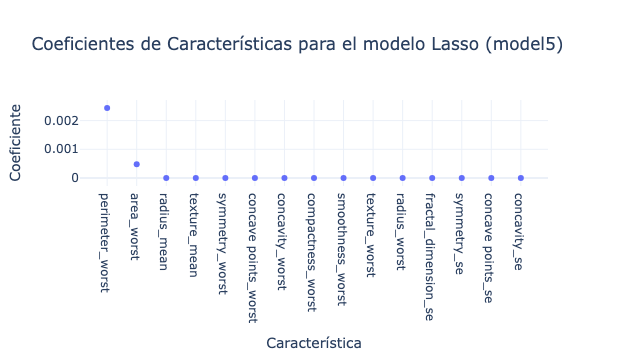

Características Seleccionadas para el modelo Ridge (model6):
['radius_mean', 'smoothness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'radius_se', 'concavity_se', 'radius_worst', 'smoothness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst']
Número de Características Seleccionadas para el modelo Ridge (model6): 12
Umbral de Selección para el modelo Ridge (model6): 0.126924126759204
Coeficientes de Características para el modelo Ridge (model6):


,Feature,Coefficient
27,concave points_worst,0.489583
24,smoothness_worst,0.379884
28,symmetry_worst,0.362810
26,concavity_worst,0.319381
7,concave points_mean,0.293810
20,radius_worst,0.265159
16,concavity_se,-0.259569
10,radius_se,0.250499
6,concavity_mean,0.222263
0,radius_mean,-0.176342


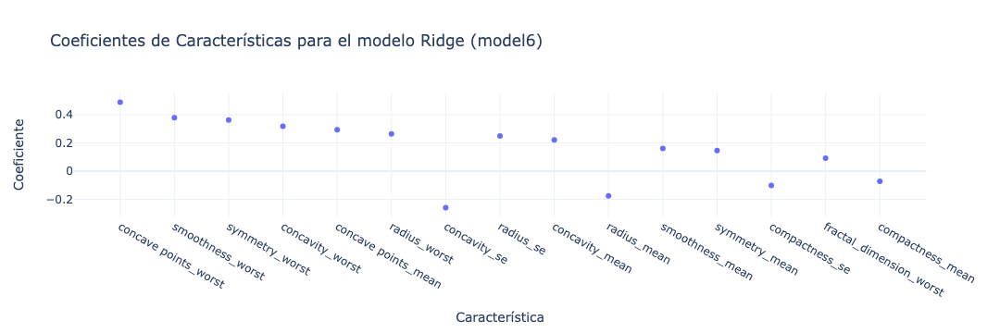

In [56]:
# Co# Convertir etiquetas de destino a valores numéricos
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Entrenar el modelo Lasso (model5)
model5 = Lasso()
model5.fit(X, y_encoded)

# Utilizar SelectFromModel para el modelo Lasso (model5)
sfm5 = SelectFromModel(model5, threshold='mean')
sfm5.fit(X, y_encoded)
X_new5 = sfm5.transform(X)

# Obtener las características seleccionadas para el modelo Lasso (model5)
selected_features5 = [feature_columns[i] for i in range(len(feature_columns)) if sfm5.get_support()[i]][:15]

# Crear DataFrame SelectFromModelLasso (model5)
SelectFromModelLasso = pd.DataFrame(X[selected_features5])

# Imprimir información sobre el modelo Lasso (model5)
print("Características Seleccionadas para el modelo Lasso (model5):")
print(selected_features5)
print("Número de Características Seleccionadas para el modelo Lasso (model5):", len(selected_features5))
print("Umbral de Selección para el modelo Lasso (model5):", sfm5.threshold_)

# Visualizar la importancia de las características para el modelo Lasso (model5)
coefficients5 = model5.coef_
selected_features_df5 = pd.DataFrame({'Feature': feature_columns, 'Coefficient': coefficients5})
selected_features_df5 = selected_features_df5.sort_values(by='Coefficient', key=abs, ascending=False)

print("Coeficientes de Características para el modelo Lasso (model5):")
display(selected_features_df5.head(15))

# Visualizar la importancia de las características con Plotly para el modelo Lasso (model5)
fig5 = px.scatter(
    selected_features_df5.head(15),
    x='Feature',
    y='Coefficient',
    title='Coeficientes de Características para el modelo Lasso (model5)',
    labels={'Coefficient': 'Coeficiente', 'Feature': 'Característica'},
    template='plotly_white'
)
fig5.show()

# Entrenar el modelo Ridge (model6)
model6 = Ridge()
model6.fit(X, y_encoded)  # Asegúrate de que 'y' sea un vector de valores numéricos

# Utilizar SelectFromModel para el modelo Ridge (model6)
sfm6 = SelectFromModel(model6, threshold='mean')  # Puedes ajustar el umbral según tus necesidades
sfm6.fit(X, y_encoded)
X_new6 = sfm6.transform(X)

# Obtener las características seleccionadas para el modelo Ridge (model6)
selected_features6 = [feature_columns[i] for i in range(len(feature_columns)) if sfm6.get_support()[i]][:15]

# Crear DataFrame SelectFromModelRidge (model6)
SelectFromModelRidge = pd.DataFrame(X[selected_features6])

# Imprimir las características seleccionadas para el modelo Ridge (model6)
print("Características Seleccionadas para el modelo Ridge (model6):")
print(selected_features6)

# Imprimir el número de características seleccionadas para el modelo Ridge (model6)
print("Número de Características Seleccionadas para el modelo Ridge (model6):", len(selected_features6))

# Imprimir el umbral de selección para el modelo Ridge (model6)
print("Umbral de Selección para el modelo Ridge (model6):", sfm6.threshold_)

# Visualizar la importancia de las características para el modelo Ridge (model6)
coefficients6 = model6.coef_
selected_features_df6 = pd.DataFrame({
    'Feature': feature_columns,
    'Coefficient': coefficients6
})
selected_features_df6 = selected_features_df6.sort_values(by='Coefficient', key=abs, ascending=False)

print("Coeficientes de Características para el modelo Ridge (model6):")
display(selected_features_df6.head(15))

# Visualizar la importancia de las características con Plotly para el modelo Ridge (model6)
fig6 = px.scatter(
    selected_features_df6.head(15),
    x='Feature',
    y='Coefficient',
    title='Coeficientes de Características para el modelo Ridge (model6)',
    labels={'Coefficient': 'Coeficiente', 'Feature': 'Característica'},
    template='plotly_white'
)
fig6.show()


<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: lavender;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">GradientBoostingClassifier
    
</h2>
</div>

Características Seleccionadas para GradientBoostingClassifier:
['concave points_mean', 'radius_worst', 'texture_worst', 'perimeter_worst', 'concave points_worst']
Número de Características Seleccionadas para GradientBoostingClassifier: 5
Umbral de Selección para GradientBoostingClassifier: 0.03333333333333333
Importancia de Características para GradientBoostingClassifier:


,Feature,Importance
20,radius_worst,0.439207
22,perimeter_worst,0.151282
7,concave points_mean,0.129821
27,concave points_worst,0.120968
21,texture_worst,0.037820
23,area_worst,0.031333
1,texture_mean,0.024500
26,concavity_worst,0.011552
16,concavity_se,0.008457
13,area_se,0.008288


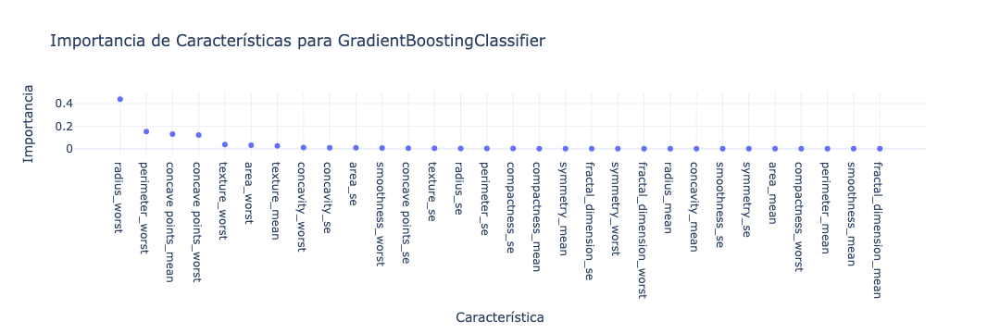

In [57]:


# Convertir etiquetas de destino a valores numéricos
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Entrenar el modelo GradientBoostingClassifier
model_gb_clf = GradientBoostingClassifier()
model_gb_clf.fit(X, y_encoded)

# Utilizar SelectFromModel para el GradientBoostingClassifier
sfm_gb_clf = SelectFromModel(model_gb_clf, threshold='mean')
sfm_gb_clf.fit(X, y_encoded)
X_new_gb_clf = sfm_gb_clf.transform(X)

# Obtener las características seleccionadas para el GradientBoostingClassifier
selected_features_gb_clf = [feature_columns[i] for i in range(len(feature_columns)) if sfm_gb_clf.get_support()[i]]

# Imprimir las características seleccionadas para el GradientBoostingClassifier
print("Características Seleccionadas para GradientBoostingClassifier:")
print(selected_features_gb_clf)

# Imprimir el número de características seleccionadas para GradientBoostingClassifier
num_selected_features_gb_clf = len(selected_features_gb_clf)
print("Número de Características Seleccionadas para GradientBoostingClassifier:", num_selected_features_gb_clf)

# Imprimir el umbral de selección para GradientBoostingClassifier
print("Umbral de Selección para GradientBoostingClassifier:", sfm_gb_clf.threshold_)

# Visualizar la importancia de las características para GradientBoostingClassifier
feature_importances_gb_clf = model_gb_clf.feature_importances_
selected_features_df_gb_clf = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': feature_importances_gb_clf
})
selected_features_df_gb_clf = selected_features_df_gb_clf.sort_values(by='Importance', ascending=False)

print("Importancia de Características para GradientBoostingClassifier:")
display(selected_features_df_gb_clf)

# Visualizar la importancia de las características con Plotly para GradientBoostingClassifier
fig_gb_clf = px.scatter(
    selected_features_df_gb_clf,
    x='Feature',
    y='Importance',
    title='Importancia de Características para GradientBoostingClassifier',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig_gb_clf.show()


## Selección de atributos ##

Nuevo DataFrame GradientBoostingCmodel1:


,Feature,Importance
20,radius_worst,0.439207
22,perimeter_worst,0.151282
7,concave points_mean,0.129821
27,concave points_worst,0.120968
21,texture_worst,0.037820
23,area_worst,0.031333
1,texture_mean,0.024500
26,concavity_worst,0.011552
16,concavity_se,0.008457
13,area_se,0.008288


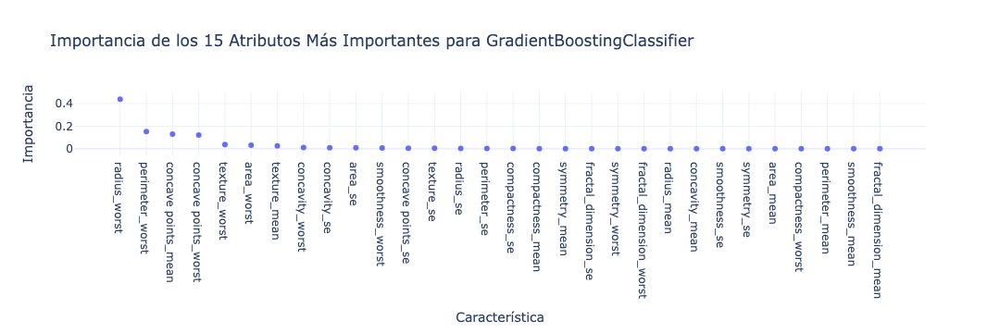

In [58]:
# Seleccionar los 15 atributos más importantes
selected_features_top15_gb_clf = selected_features_df_gb_clf.head(15)

# Crear un nuevo DataFrame llamado GradientBoostingCmodel1
GradientBoostingCmodel1 = pd.DataFrame({
    'Feature': selected_features_top15_gb_clf['Feature'],
    'Importance': selected_features_top15_gb_clf['Importance']
})

# Imprimir el nuevo DataFrame
print("Nuevo DataFrame GradientBoostingCmodel1:")
display(GradientBoostingCmodel1)

# Visualizar la importancia de las características con Plotly para GradientBoostingClassifier
fig_gb_clf_top15 = px.scatter(
    selected_features_df_gb_clf,
    x='Feature',
    y='Importance',
    title='Importancia de los 15 Atributos Más Importantes para GradientBoostingClassifier',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig_gb_clf_top15.show()


In [59]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.feature_selection import SelectFromModel
import plotly.express as px
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor

<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: lavender;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">GradientBoostingRegressor
    
</h2>
</div>

Características Seleccionadas para GradientBoostingRegressor:
['concave points_mean', 'radius_worst', 'texture_worst', 'perimeter_worst', 'concave points_worst']
Número de Características Seleccionadas para GradientBoostingRegressor: 5
Umbral de Selección para GradientBoostingRegressor: 0.03333333333333333
Importancia de Características para GradientBoostingRegressor:


,Feature,Importance
20,radius_worst,0.450938
7,concave points_mean,0.145257
22,perimeter_worst,0.142005
27,concave points_worst,0.104734
21,texture_worst,0.038253
1,texture_mean,0.027990
23,area_worst,0.024557
26,concavity_worst,0.009583
15,compactness_se,0.008376
13,area_se,0.007587


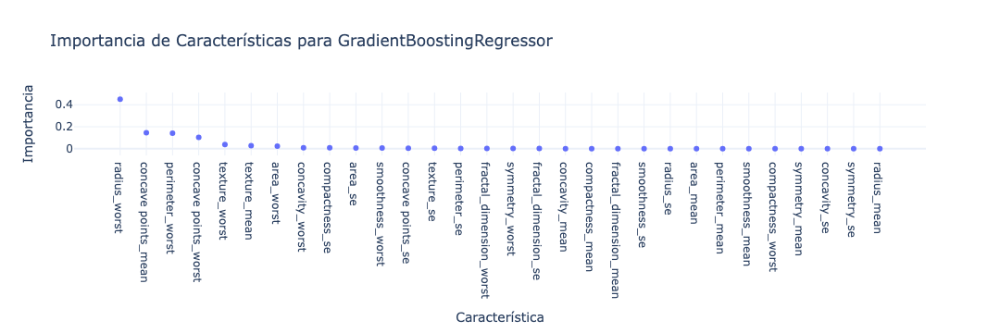

In [60]:
# Convertir etiquetas de destino a valores numéricos
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Entrenar el modelo GradientBoostingRegressor
model_gb_reg = GradientBoostingRegressor()
model_gb_reg.fit(X, y_encoded)

# Utilizar SelectFromModel para el GradientBoostingRegressor
sfm_gb_reg = SelectFromModel(model_gb_reg, threshold='mean')
sfm_gb_reg.fit(X, y_encoded)
X_new_gb_reg = sfm_gb_reg.transform(X)

# Obtener las características seleccionadas para el GradientBoostingRegressor
selected_features_gb_reg = [feature_columns[i] for i in range(len(feature_columns)) if sfm_gb_reg.get_support()[i]]

# Imprimir las características seleccionadas para el GradientBoostingRegressor
print("Características Seleccionadas para GradientBoostingRegressor:")
print(selected_features_gb_reg)

# Imprimir el número de características seleccionadas para GradientBoostingRegressor
num_selected_features_gb_reg = len(selected_features_gb_reg)
print("Número de Características Seleccionadas para GradientBoostingRegressor:", num_selected_features_gb_reg)

# Imprimir el umbral de selección para GradientBoostingRegressor
print("Umbral de Selección para GradientBoostingRegressor:", sfm_gb_reg.threshold_)

# Visualizar la importancia de las características para GradientBoostingRegressor
feature_importances_gb_reg = model_gb_reg.feature_importances_
selected_features_df_gb_reg = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': feature_importances_gb_reg
})
selected_features_df_gb_reg = selected_features_df_gb_reg.sort_values(by='Importance', ascending=False)

print("Importancia de Características para GradientBoostingRegressor:")
display(selected_features_df_gb_reg)

# Visualizar la importancia de las características con Plotly para GradientBoostingRegressor
fig_gb_reg = px.scatter(
    selected_features_df_gb_reg,
    x='Feature',
    y='Importance',
    title='Importancia de Características para GradientBoostingRegressor',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig_gb_reg.show()


## Selección de atributos ##

Características Seleccionadas para GradientBoostingRegressor:
['concave points_mean', 'radius_worst', 'texture_worst', 'perimeter_worst', 'concave points_worst']
Número de Características Seleccionadas para GradientBoostingRegressor: 5
Umbral de Selección para GradientBoostingRegressor: 0.03333333333333333
Importancia de Características para GradientBoostingRegressor:


,Feature,Importance
1,radius_worst,0.450938
0,concave points_mean,0.145257
3,perimeter_worst,0.142005
4,concave points_worst,0.104734
2,texture_worst,0.038253


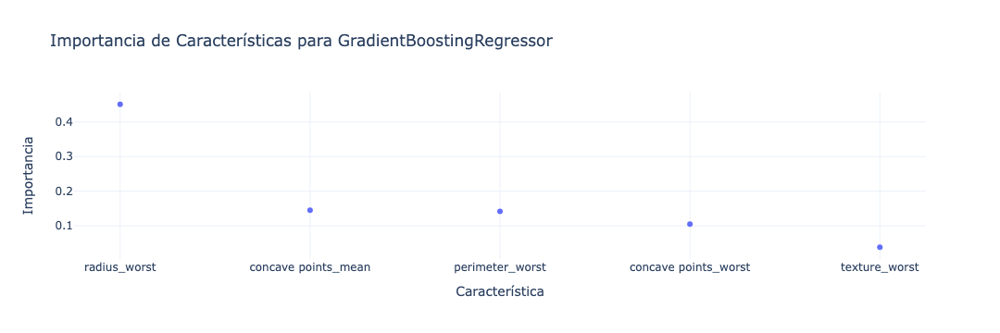

In [61]:
# Obtener las características seleccionadas para el GradientBoostingRegressor
selected_features_gb_reg = [feature_columns[i] for i in range(len(feature_columns)) if sfm_gb_reg.get_support()[i]]

# Seleccionar todos los atributos con importancia mayor a cero
selected_features_top_gb_reg = [feature for feature, importance in zip(selected_features_gb_reg, model_gb_reg.feature_importances_) if importance > 0]

# Seleccionar los 15 atributos más importantes
selected_features_top15_gb_reg = selected_features_top_gb_reg[:15]

# Obtener las importancias correspondientes a las características seleccionadas
importances_top15_gb_reg = [model_gb_reg.feature_importances_[feature_columns.index(feature)] for feature in selected_features_top15_gb_reg]

# Crear un DataFrame con los 15 atributos más importantes para el GradientBoostingRegressor
GradientBoostingRmodel_reg = pd.DataFrame({
    'Feature': selected_features_top15_gb_reg,
    'Importance': importances_top15_gb_reg
})
GradientBoostingRmodel_reg = GradientBoostingRmodel_reg.sort_values(by='Importance', ascending=False)

# Imprimir las características seleccionadas para el GradientBoostingRegressor
print("Características Seleccionadas para GradientBoostingRegressor:")
print(selected_features_top15_gb_reg)

# Imprimir el número de características seleccionadas para GradientBoostingRegressor
num_selected_features_gb_reg = len(selected_features_top15_gb_reg)
print("Número de Características Seleccionadas para GradientBoostingRegressor:", num_selected_features_gb_reg)

# Imprimir el umbral de selección para GradientBoostingRegressor
print("Umbral de Selección para GradientBoostingRegressor:", sfm_gb_reg.threshold_)

# Visualizar la importancia de las características para GradientBoostingRegressor
print("Importancia de Características para GradientBoostingRegressor:")
display(GradientBoostingRmodel_reg)

# Visualizar la importancia de las características con Plotly para GradientBoostingRegressor
fig_gb_reg = px.scatter(
    GradientBoostingRmodel_reg,
    x='Feature',
    y='Importance',
    title='Importancia de Características para GradientBoostingRegressor',
    labels={'Importance': 'Importancia', 'Feature': 'Característica'},
    template='plotly_white'
)
fig_gb_reg.show()



<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: plum;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">DataFrames
    
</h2>
</div>

In [62]:

# Crear y mostrar DataFrames para GenericUnivariateSelect
GenericUnivariateSelectTrans1 = pd.DataFrame(X[selected_features1])
GenericUnivariateSelectTrans2 = pd.DataFrame(X[selected_features2])
GenericUnivariateSelectTrans3 = pd.DataFrame(X[selected_features3])

# Mostrar los DataFrames
print("GenericUnivariateSelectTrans1:")
display(GenericUnivariateSelectTrans1.head(15))

print("\nGenericUnivariateSelectTrans2:")
display(GenericUnivariateSelectTrans2.head(15))

print("\nGenericUnivariateSelectTrans3:")
display(GenericUnivariateSelectTrans3.head(15))

# Crear DataFrames para SelectKBest
SelectKBestTrans1 = pd.DataFrame(X[selected_features_df1['Feature'].head(15).tolist()])
SelectKBestTrans2 = pd.DataFrame(X[selected_features_df2['Feature'].head(15).tolist()])
SelectKBestTrans3 = pd.DataFrame(X[selected_features_df3['Feature'].head(15).tolist()])

# Mostrar los DataFrames
print("\nSelectKBestTrans1:")
display(SelectKBestTrans1.head(15))

print("\nSelectKBestTrans2:")
display(SelectKBestTrans2.head(15))

print("\nSelectKBestTrans3:")
display(SelectKBestTrans3.head(15))

# Crear DataFrames para SelectPercentile
SelectPercentileTrans1 = pd.DataFrame(X[selected_features1])
SelectPercentileTrans2 = pd.DataFrame(X[selected_features2])
SelectPercentileTrans3 = pd.DataFrame(X[selected_features3])

# Mostrar los DataFrames
print("\nSelectPercentileTrans1:")
display(SelectPercentileTrans1.head(15))

print("\nSelectPercentileTrans2:")
display(SelectPercentileTrans2.head(15))

print("\nSelectPercentileTrans3:")
display(SelectPercentileTrans3.head(15))

# Crear DataFrames para SelectFpr
SelectFprTrans1 = pd.DataFrame(X[selected_features1])
SelectFprTrans2 = pd.DataFrame(X[selected_features2])

# Mostrar los DataFrames
print("\nSelectFprTrans1:")
display(SelectFprTrans1.head(15))

print("\nSelectFprTrans2:")
display(SelectFprTrans2.head(15))

# Crear DataFrames para SelectFdr
SelectFdrTrans1 = pd.DataFrame(X[selected_features1])
SelectFdrTrans2 = pd.DataFrame(X[selected_features2])

# Mostrar los DataFrames
print("\nSelectFdrTrans1:")
display(SelectFdrTrans1.head(15))

print("\nSelectFdrTrans2:")
display(SelectFdrTrans2.head(15))


GradientBoostingCmodel1 = pd.DataFrame({
    'Feature': selected_features_top15_gb_clf['Feature'],
    'Importance': selected_features_top15_gb_clf['Importance']
})

# Llamar el DataFrame GradientBoostingCmodel1
print("\nContenido del DataFrame GradientBoostingCmodel1:")
display(GradientBoostingCmodel1)

# Llamar el DataFrame GradientBoostingRmodel_reg
print("\nContenido del DataFrame GradientBoostingRmodel_reg:")
display(GradientBoostingRmodel_reg)

SelectFromModelLassoDF = pd.DataFrame(X_new5, columns=selected_features5)

# Crear DataFrames para SelectFromModelRidge (model6)
SelectFromModelRidgeDF = pd.DataFrame(X_new6, columns=selected_features6)

# Mostrar los DataFrames
print("\nContenido del DataFrame SelectFromModelLasso:")
display(SelectFromModelLassoDF.head(15))

print("\nContenido del DataFrame SelectFromModelRidge:")
display(SelectFromModelRidgeDF.head(15))

# Crear DataFrame para GradientBoostingRegressor
GradientBoostingRmodel_reg_df = pd.DataFrame({
    'Feature': selected_features_top15_gb_reg,
    'Importance': importances_top15_gb_reg
})

# Ordenar el DataFrame por importancia descendente
GradientBoostingRmodel_reg_df = GradientBoostingRmodel_reg_df.sort_values(by='Importance', ascending=False)

# Imprimir el DataFrame
print("\nGradientBoostingRmodel_reg_df:")
display(GradientBoostingRmodel_reg_df.head(15))


GenericUnivariateSelectTrans1:


,radius_mean,perimeter_mean,area_mean,concave points_mean,area_se,radius_worst,perimeter_worst,area_worst,concave points_worst
0,17.99,122.80,1001.0,0.14710,153.40,25.38,184.60,2019.0,0.26540
1,20.57,132.90,1326.0,0.07017,74.08,24.99,158.80,1956.0,0.18600
2,19.69,130.00,1203.0,0.12790,94.03,23.57,152.50,1709.0,0.24300
3,11.42,77.58,386.1,0.10520,27.23,14.91,98.87,567.7,0.25750
4,20.29,135.10,1297.0,0.10430,94.44,22.54,152.20,1575.0,0.16250
5,12.45,82.57,477.1,0.08089,27.19,15.47,103.40,741.6,0.17410
6,18.25,119.60,1040.0,0.07400,53.91,22.88,153.20,1606.0,0.19320
7,13.71,90.20,577.9,0.05985,50.96,17.06,110.60,897.0,0.15560
8,13.00,87.50,519.8,0.09353,24.32,15.49,106.20,739.3,0.20600
9,12.46,83.97,475.9,0.08543,23.94,15.09,97.65,711.4,0.22100



GenericUnivariateSelectTrans2:


,radius_mean,area_mean,concavity_mean,concave points_mean,radius_worst,perimeter_worst,area_worst,concave points_worst
0,17.99,1001.0,0.30010,0.14710,25.38,184.60,2019.0,0.26540
1,20.57,1326.0,0.08690,0.07017,24.99,158.80,1956.0,0.18600
2,19.69,1203.0,0.19740,0.12790,23.57,152.50,1709.0,0.24300
3,11.42,386.1,0.24140,0.10520,14.91,98.87,567.7,0.25750
4,20.29,1297.0,0.19800,0.10430,22.54,152.20,1575.0,0.16250
5,12.45,477.1,0.15780,0.08089,15.47,103.40,741.6,0.17410
6,18.25,1040.0,0.11270,0.07400,22.88,153.20,1606.0,0.19320
7,13.71,577.9,0.09366,0.05985,17.06,110.60,897.0,0.15560
8,13.00,519.8,0.18590,0.09353,15.49,106.20,739.3,0.20600
9,12.46,475.9,0.22730,0.08543,15.09,97.65,711.4,0.22100



GenericUnivariateSelectTrans3:


,texture_mean,radius_worst,texture_worst,concave points_worst
0,10.38,25.38,17.33,0.26540
1,17.77,24.99,23.41,0.18600
2,21.25,23.57,25.53,0.24300
3,20.38,14.91,26.50,0.25750
4,14.34,22.54,16.67,0.16250
5,15.70,15.47,23.75,0.17410
6,19.98,22.88,27.66,0.19320
7,20.83,17.06,28.14,0.15560
8,21.82,15.49,30.73,0.20600
9,24.04,15.09,40.68,0.22100



SelectKBestTrans1:


,concave points_worst,concave points_mean,perimeter_worst,radius_worst,area_worst,perimeter_mean,area_se,concavity_worst,concavity_mean,radius_mean,area_mean,radius_se,texture_worst,texture_mean,smoothness_worst
0,0.26540,0.14710,184.60,25.38,2019.0,122.80,153.40,0.7119,0.30010,17.99,1001.0,1.0950,17.33,10.38,0.1622
1,0.18600,0.07017,158.80,24.99,1956.0,132.90,74.08,0.2416,0.08690,20.57,1326.0,0.5435,23.41,17.77,0.1238
2,0.24300,0.12790,152.50,23.57,1709.0,130.00,94.03,0.4504,0.19740,19.69,1203.0,0.7456,25.53,21.25,0.1444
3,0.25750,0.10520,98.87,14.91,567.7,77.58,27.23,0.6869,0.24140,11.42,386.1,0.4956,26.50,20.38,0.2098
4,0.16250,0.10430,152.20,22.54,1575.0,135.10,94.44,0.4000,0.19800,20.29,1297.0,0.7572,16.67,14.34,0.1374
5,0.17410,0.08089,103.40,15.47,741.6,82.57,27.19,0.5355,0.15780,12.45,477.1,0.3345,23.75,15.70,0.1791
6,0.19320,0.07400,153.20,22.88,1606.0,119.60,53.91,0.3784,0.11270,18.25,1040.0,0.4467,27.66,19.98,0.1442
7,0.15560,0.05985,110.60,17.06,897.0,90.20,50.96,0.2678,0.09366,13.71,577.9,0.5835,28.14,20.83,0.1654
8,0.20600,0.09353,106.20,15.49,739.3,87.50,24.32,0.5390,0.18590,13.00,519.8,0.3063,30.73,21.82,0.1703
9,0.22100,0.08543,97.65,15.09,711.4,83.97,23.94,1.1050,0.22730,12.46,475.9,0.2976,40.68,24.04,0.1853



SelectKBestTrans2:


,radius_worst,perimeter_worst,area_worst,concave points_mean,concave points_worst,concavity_mean,area_mean,area_se,perimeter_mean,radius_mean,concavity_worst,texture_worst,compactness_worst,smoothness_worst,texture_mean
0,25.38,184.60,2019.0,0.14710,0.26540,0.30010,1001.0,153.40,122.80,17.99,0.7119,17.33,0.6656,0.1622,10.38
1,24.99,158.80,1956.0,0.07017,0.18600,0.08690,1326.0,74.08,132.90,20.57,0.2416,23.41,0.1866,0.1238,17.77
2,23.57,152.50,1709.0,0.12790,0.24300,0.19740,1203.0,94.03,130.00,19.69,0.4504,25.53,0.4245,0.1444,21.25
3,14.91,98.87,567.7,0.10520,0.25750,0.24140,386.1,27.23,77.58,11.42,0.6869,26.50,0.8663,0.2098,20.38
4,22.54,152.20,1575.0,0.10430,0.16250,0.19800,1297.0,94.44,135.10,20.29,0.4000,16.67,0.2050,0.1374,14.34
5,15.47,103.40,741.6,0.08089,0.17410,0.15780,477.1,27.19,82.57,12.45,0.5355,23.75,0.5249,0.1791,15.70
6,22.88,153.20,1606.0,0.07400,0.19320,0.11270,1040.0,53.91,119.60,18.25,0.3784,27.66,0.2576,0.1442,19.98
7,17.06,110.60,897.0,0.05985,0.15560,0.09366,577.9,50.96,90.20,13.71,0.2678,28.14,0.3682,0.1654,20.83
8,15.49,106.20,739.3,0.09353,0.20600,0.18590,519.8,24.32,87.50,13.00,0.5390,30.73,0.5401,0.1703,21.82
9,15.09,97.65,711.4,0.08543,0.22100,0.22730,475.9,23.94,83.97,12.46,1.1050,40.68,1.0580,0.1853,24.04



SelectKBestTrans3:


,radius_worst,concave points_worst,texture_worst,concave points_mean,texture_mean,smoothness_mean,area_worst,area_se,concavity_mean,smoothness_se,smoothness_worst,compactness_se,radius_se,concavity_worst,perimeter_worst
0,25.38,0.26540,17.33,0.14710,10.38,0.11840,2019.0,153.40,0.30010,0.006399,0.1622,0.049040,1.0950,0.7119,184.60
1,24.99,0.18600,23.41,0.07017,17.77,0.08474,1956.0,74.08,0.08690,0.005225,0.1238,0.013080,0.5435,0.2416,158.80
2,23.57,0.24300,25.53,0.12790,21.25,0.10960,1709.0,94.03,0.19740,0.006150,0.1444,0.040060,0.7456,0.4504,152.50
3,14.91,0.25750,26.50,0.10520,20.38,0.14250,567.7,27.23,0.24140,0.009110,0.2098,0.074580,0.4956,0.6869,98.87
4,22.54,0.16250,16.67,0.10430,14.34,0.10030,1575.0,94.44,0.19800,0.011490,0.1374,0.024610,0.7572,0.4000,152.20
5,15.47,0.17410,23.75,0.08089,15.70,0.12780,741.6,27.19,0.15780,0.007510,0.1791,0.033450,0.3345,0.5355,103.40
6,22.88,0.19320,27.66,0.07400,19.98,0.09463,1606.0,53.91,0.11270,0.004314,0.1442,0.013820,0.4467,0.3784,153.20
7,17.06,0.15560,28.14,0.05985,20.83,0.11890,897.0,50.96,0.09366,0.008805,0.1654,0.030290,0.5835,0.2678,110.60
8,15.49,0.20600,30.73,0.09353,21.82,0.12730,739.3,24.32,0.18590,0.005731,0.1703,0.035020,0.3063,0.5390,106.20
9,15.09,0.22100,40.68,0.08543,24.04,0.11860,711.4,23.94,0.22730,0.007149,0.1853,0.072170,0.2976,1.1050,97.65



SelectPercentileTrans1:


,radius_mean,perimeter_mean,area_mean,concave points_mean,area_se,radius_worst,perimeter_worst,area_worst,concave points_worst
0,17.99,122.80,1001.0,0.14710,153.40,25.38,184.60,2019.0,0.26540
1,20.57,132.90,1326.0,0.07017,74.08,24.99,158.80,1956.0,0.18600
2,19.69,130.00,1203.0,0.12790,94.03,23.57,152.50,1709.0,0.24300
3,11.42,77.58,386.1,0.10520,27.23,14.91,98.87,567.7,0.25750
4,20.29,135.10,1297.0,0.10430,94.44,22.54,152.20,1575.0,0.16250
5,12.45,82.57,477.1,0.08089,27.19,15.47,103.40,741.6,0.17410
6,18.25,119.60,1040.0,0.07400,53.91,22.88,153.20,1606.0,0.19320
7,13.71,90.20,577.9,0.05985,50.96,17.06,110.60,897.0,0.15560
8,13.00,87.50,519.8,0.09353,24.32,15.49,106.20,739.3,0.20600
9,12.46,83.97,475.9,0.08543,23.94,15.09,97.65,711.4,0.22100



SelectPercentileTrans2:


,radius_mean,area_mean,concavity_mean,concave points_mean,radius_worst,perimeter_worst,area_worst,concave points_worst
0,17.99,1001.0,0.30010,0.14710,25.38,184.60,2019.0,0.26540
1,20.57,1326.0,0.08690,0.07017,24.99,158.80,1956.0,0.18600
2,19.69,1203.0,0.19740,0.12790,23.57,152.50,1709.0,0.24300
3,11.42,386.1,0.24140,0.10520,14.91,98.87,567.7,0.25750
4,20.29,1297.0,0.19800,0.10430,22.54,152.20,1575.0,0.16250
5,12.45,477.1,0.15780,0.08089,15.47,103.40,741.6,0.17410
6,18.25,1040.0,0.11270,0.07400,22.88,153.20,1606.0,0.19320
7,13.71,577.9,0.09366,0.05985,17.06,110.60,897.0,0.15560
8,13.00,519.8,0.18590,0.09353,15.49,106.20,739.3,0.20600
9,12.46,475.9,0.22730,0.08543,15.09,97.65,711.4,0.22100



SelectPercentileTrans3:


,texture_mean,radius_worst,texture_worst,concave points_worst
0,10.38,25.38,17.33,0.26540
1,17.77,24.99,23.41,0.18600
2,21.25,23.57,25.53,0.24300
3,20.38,14.91,26.50,0.25750
4,14.34,22.54,16.67,0.16250
5,15.70,15.47,23.75,0.17410
6,19.98,22.88,27.66,0.19320
7,20.83,17.06,28.14,0.15560
8,21.82,15.49,30.73,0.20600
9,24.04,15.09,40.68,0.22100



SelectFprTrans1:


,radius_mean,perimeter_mean,area_mean,concave points_mean,area_se,radius_worst,perimeter_worst,area_worst,concave points_worst
0,17.99,122.80,1001.0,0.14710,153.40,25.38,184.60,2019.0,0.26540
1,20.57,132.90,1326.0,0.07017,74.08,24.99,158.80,1956.0,0.18600
2,19.69,130.00,1203.0,0.12790,94.03,23.57,152.50,1709.0,0.24300
3,11.42,77.58,386.1,0.10520,27.23,14.91,98.87,567.7,0.25750
4,20.29,135.10,1297.0,0.10430,94.44,22.54,152.20,1575.0,0.16250
5,12.45,82.57,477.1,0.08089,27.19,15.47,103.40,741.6,0.17410
6,18.25,119.60,1040.0,0.07400,53.91,22.88,153.20,1606.0,0.19320
7,13.71,90.20,577.9,0.05985,50.96,17.06,110.60,897.0,0.15560
8,13.00,87.50,519.8,0.09353,24.32,15.49,106.20,739.3,0.20600
9,12.46,83.97,475.9,0.08543,23.94,15.09,97.65,711.4,0.22100



SelectFprTrans2:


,radius_mean,area_mean,concavity_mean,concave points_mean,radius_worst,perimeter_worst,area_worst,concave points_worst
0,17.99,1001.0,0.30010,0.14710,25.38,184.60,2019.0,0.26540
1,20.57,1326.0,0.08690,0.07017,24.99,158.80,1956.0,0.18600
2,19.69,1203.0,0.19740,0.12790,23.57,152.50,1709.0,0.24300
3,11.42,386.1,0.24140,0.10520,14.91,98.87,567.7,0.25750
4,20.29,1297.0,0.19800,0.10430,22.54,152.20,1575.0,0.16250
5,12.45,477.1,0.15780,0.08089,15.47,103.40,741.6,0.17410
6,18.25,1040.0,0.11270,0.07400,22.88,153.20,1606.0,0.19320
7,13.71,577.9,0.09366,0.05985,17.06,110.60,897.0,0.15560
8,13.00,519.8,0.18590,0.09353,15.49,106.20,739.3,0.20600
9,12.46,475.9,0.22730,0.08543,15.09,97.65,711.4,0.22100



SelectFdrTrans1:


,radius_mean,perimeter_mean,area_mean,concave points_mean,area_se,radius_worst,perimeter_worst,area_worst,concave points_worst
0,17.99,122.80,1001.0,0.14710,153.40,25.38,184.60,2019.0,0.26540
1,20.57,132.90,1326.0,0.07017,74.08,24.99,158.80,1956.0,0.18600
2,19.69,130.00,1203.0,0.12790,94.03,23.57,152.50,1709.0,0.24300
3,11.42,77.58,386.1,0.10520,27.23,14.91,98.87,567.7,0.25750
4,20.29,135.10,1297.0,0.10430,94.44,22.54,152.20,1575.0,0.16250
5,12.45,82.57,477.1,0.08089,27.19,15.47,103.40,741.6,0.17410
6,18.25,119.60,1040.0,0.07400,53.91,22.88,153.20,1606.0,0.19320
7,13.71,90.20,577.9,0.05985,50.96,17.06,110.60,897.0,0.15560
8,13.00,87.50,519.8,0.09353,24.32,15.49,106.20,739.3,0.20600
9,12.46,83.97,475.9,0.08543,23.94,15.09,97.65,711.4,0.22100



SelectFdrTrans2:


,radius_mean,area_mean,concavity_mean,concave points_mean,radius_worst,perimeter_worst,area_worst,concave points_worst
0,17.99,1001.0,0.30010,0.14710,25.38,184.60,2019.0,0.26540
1,20.57,1326.0,0.08690,0.07017,24.99,158.80,1956.0,0.18600
2,19.69,1203.0,0.19740,0.12790,23.57,152.50,1709.0,0.24300
3,11.42,386.1,0.24140,0.10520,14.91,98.87,567.7,0.25750
4,20.29,1297.0,0.19800,0.10430,22.54,152.20,1575.0,0.16250
5,12.45,477.1,0.15780,0.08089,15.47,103.40,741.6,0.17410
6,18.25,1040.0,0.11270,0.07400,22.88,153.20,1606.0,0.19320
7,13.71,577.9,0.09366,0.05985,17.06,110.60,897.0,0.15560
8,13.00,519.8,0.18590,0.09353,15.49,106.20,739.3,0.20600
9,12.46,475.9,0.22730,0.08543,15.09,97.65,711.4,0.22100



Contenido del DataFrame GradientBoostingCmodel1:


,Feature,Importance
20,radius_worst,0.439207
22,perimeter_worst,0.151282
7,concave points_mean,0.129821
27,concave points_worst,0.120968
21,texture_worst,0.037820
23,area_worst,0.031333
1,texture_mean,0.024500
26,concavity_worst,0.011552
16,concavity_se,0.008457
13,area_se,0.008288



Contenido del DataFrame GradientBoostingRmodel_reg:


,Feature,Importance
1,radius_worst,0.450938
0,concave points_mean,0.145257
3,perimeter_worst,0.142005
4,concave points_worst,0.104734
2,texture_worst,0.038253



Contenido del DataFrame SelectFromModelLasso:


,perimeter_worst,area_worst
0,184.60,2019.0
1,158.80,1956.0
2,152.50,1709.0
3,98.87,567.7
4,152.20,1575.0
5,103.40,741.6
6,153.20,1606.0
7,110.60,897.0
8,106.20,739.3
9,97.65,711.4



Contenido del DataFrame SelectFromModelRidge:


,radius_mean,smoothness_mean,concavity_mean,concave points_mean,symmetry_mean,radius_se,concavity_se,radius_worst,smoothness_worst,concavity_worst,concave points_worst,symmetry_worst
0,17.99,0.11840,0.30010,0.14710,0.2419,1.0950,0.05373,25.38,0.1622,0.7119,0.26540,0.4601
1,20.57,0.08474,0.08690,0.07017,0.1812,0.5435,0.01860,24.99,0.1238,0.2416,0.18600,0.2750
2,19.69,0.10960,0.19740,0.12790,0.2069,0.7456,0.03832,23.57,0.1444,0.4504,0.24300,0.3613
3,11.42,0.14250,0.24140,0.10520,0.2597,0.4956,0.05661,14.91,0.2098,0.6869,0.25750,0.6638
4,20.29,0.10030,0.19800,0.10430,0.1809,0.7572,0.05688,22.54,0.1374,0.4000,0.16250,0.2364
5,12.45,0.12780,0.15780,0.08089,0.2087,0.3345,0.03672,15.47,0.1791,0.5355,0.17410,0.3985
6,18.25,0.09463,0.11270,0.07400,0.1794,0.4467,0.02254,22.88,0.1442,0.3784,0.19320,0.3063
7,13.71,0.11890,0.09366,0.05985,0.2196,0.5835,0.02488,17.06,0.1654,0.2678,0.15560,0.3196
8,13.00,0.12730,0.18590,0.09353,0.2350,0.3063,0.03553,15.49,0.1703,0.5390,0.20600,0.4378
9,12.46,0.11860,0.22730,0.08543,0.2030,0.2976,0.07743,15.09,0.1853,1.1050,0.22100,0.4366



GradientBoostingRmodel_reg_df:


,Feature,Importance
1,radius_worst,0.450938
0,concave points_mean,0.145257
3,perimeter_worst,0.142005
4,concave points_worst,0.104734
2,texture_worst,0.038253


In [63]:
import os

In [64]:
# Rutas de archivo de salida
output_path = "ruta_del_directorio/"

# Crear el directorio si no existe
if not os.path.exists(output_path):
    os.makedirs(output_path)

# Resto del código para guardar los DataFrames en archivos CSV...

# Guardar los DataFrames de GenericUnivariateSelect en archivos CSV
GenericUnivariateSelectTrans1.to_csv(output_path + "GenericUnivariateSelectTrans1.csv", index=False)
GenericUnivariateSelectTrans2.to_csv(output_path + "GenericUnivariateSelectTrans2.csv", index=False)
GenericUnivariateSelectTrans3.to_csv(output_path + "GenericUnivariateSelectTrans3.csv", index=False)

# Guardar los DataFrames de SelectKBest en archivos CSV
SelectKBestTrans1.to_csv(output_path + "SelectKBestTrans1.csv", index=False)
SelectKBestTrans2.to_csv(output_path + "SelectKBestTrans2.csv", index=False)
SelectKBestTrans3.to_csv(output_path + "SelectKBestTrans3.csv", index=False)

# Guardar los DataFrames de SelectPercentile en archivos CSV
SelectPercentileTrans1.to_csv(output_path + "SelectPercentileTrans1.csv", index=False)
SelectPercentileTrans2.to_csv(output_path + "SelectPercentileTrans2.csv", index=False)
SelectPercentileTrans3.to_csv(output_path + "SelectPercentileTrans3.csv", index=False)

# Guardar los DataFrames de SelectFpr en archivos CSV
SelectFprTrans1.to_csv(output_path + "SelectFprTrans1.csv", index=False)
SelectFprTrans2.to_csv(output_path + "SelectFprTrans2.csv", index=False)

# Guardar los DataFrames de SelectFdr en archivos CSV
SelectFdrTrans1.to_csv(output_path + "SelectFdrTrans1.csv", index=False)
SelectFdrTrans2.to_csv(output_path + "SelectFdrTrans2.csv", index=False)

# Guardar el DataFrame de GradientBoostingCmodel1 en un archivo CSV
GradientBoostingCmodel1.to_csv(output_path + "GradientBoostingCmodel1.csv", index=False)

# Guardar el DataFrame de SelectFromModelLassoDF en un archivo CSV
SelectFromModelLassoDF.to_csv(output_path + "SelectFromModelLassoDF.csv", index=False)

# Guardar el DataFrame de SelectFromModelRidgeDF en un archivo CSV
SelectFromModelRidgeDF.to_csv(output_path + "SelectFromModelRidgeDF.csv", index=False)

# Guardar el DataFrame de GradientBoostingRmodel_reg_df en un archivo CSV
GradientBoostingRmodel_reg_df.to_csv(output_path + "GradientBoostingRmodel_reg_df.csv", index=False)


<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: plum;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Informe de Clasificación de Filters con SVC
    
</h2>
</div>

In [65]:
from sklearn.metrics import confusion_matrix

In [66]:
pip install seaborn --upgrade

Note: you may need to restart the kernel to use updated packages.


In [67]:
estimatorSVC = SVC(kernel="linear", C=0.025, random_state=42)

Resultados de SVC
Matriz de Confusión:
[[71  0]
 [ 2 41]]
Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99        71
           1       1.00      0.95      0.98        43

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



Generic Univariate Select Trans 1
Matriz de Confusión:
[[349   8]
 [ 39 173]]
Sensibilidad (Recall): 0.8160377358490566
Especificidad: 0.9775910364145658
Informe de Clasificación:
              precision    recall  f1-score   support

     Benigno       0.90      0.98      0.94       357
     Maligno       0.96      0.82      0.88       212

    accuracy                           0.92       569
   macro avg       0.93      0.90      0.91       569
weighted avg       0.92      0.92      0.92       569

Precisión (Accuracy) para Generic Univariate Select Trans 1: 0.9173989455184535


/var/folders/pp/wmccm1s10r7fdx87b695vhqw0000gn/T/ipykernel_64315/3678602417.py:421: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




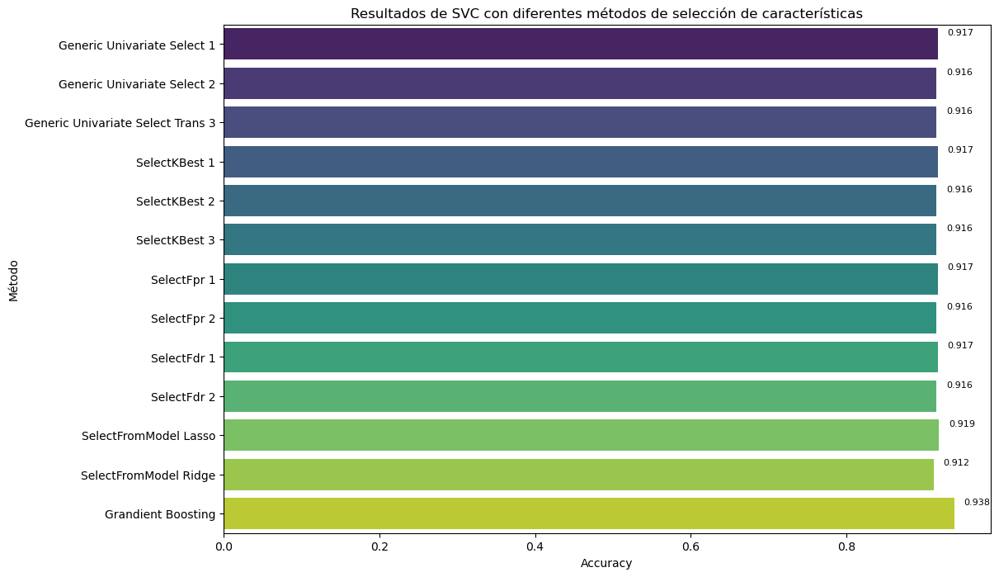

In [199]:
def evaluate_model(model, X_train, X_test, y_train, y_test, model_name):
    print(f"Resultados de {model_name}")

    # Entrenar el modelo y realizar predicciones
    model.fit(X_train, y_train)
    predicted = model.predict(X_test)

    # Calcular la matriz de confusión
    conf_matrix = confusion_matrix(y_test, predicted)
    print("Matriz de Confusión:")
    print(conf_matrix)

    # Imprimir un informe de clasificación detallado
    print("Informe de Clasificación:")
    print(classification_report(y_test, predicted))
    print("\n" + "="*50 + "\n")

    # Devolver el accuracy
    accuracy = accuracy_score(y_test, predicted)
    return accuracy

# Cargar el conjunto de datos
data = pd.read_csv("breast-cancer-clean.csv")

# Separar características (X) y etiquetas (y)
X = data[['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
    'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean',
    'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se',
    'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se',
    'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst',
    'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst',
    'compactness_worst', 'concavity_worst', 'concave points_worst',
    'symmetry_worst', 'fractal_dimension_worst']].values
y = data['diagnosis'].values

# Convertir etiquetas categóricas a valores numéricos
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Escalar características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Definir el clasificador SVC
estimatorSVC = SVC()

# Resultados para SVC
accuracy_svc = evaluate_model(estimatorSVC, X_train_scaled, X_test_scaled, y_train, y_test, "SVC")


X = df_clean[['area_worst', 'area_mean', 'area_se', 'perimeter_worst','perimeter_mean','radius_worst',
              'radius_mean','perimeter_se','texture_worst','texture_mean','concavity_worst','radius_se',
              'concavity_mean','compactness_worst','concave points_worst']].values
y = df_clean['diagnosis'].values

# Realizar predicciones utilizando K-fold cross-validation
predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Generic Univariate Select Trans 1")

# Calcular la matriz de confusión
conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

# Calcular sensibilidad y especificidad
true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

# Imprimir un informe de clasificación detallado
print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans1 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para Generic Univariate Select Trans 1: {accuracy_trans1}")


X = df_clean[['concave points_worst','perimeter_worst','concave points_mean','radius_worst','perimeter_mean',
              'area_worst', 'radius_mean','area_mean','concavity_mean','concavity_worst','compactness_mean',
              'compactness_worst','radius_se','perimeter_se','area_se']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Generic Univariate Select Trans 2")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans2 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para Generic Univariate Select Trans 2: {accuracy_trans2}")


X = df_clean[['perimeter_worst','area_worst', 'radius_worst','concave points_mean','concave points_worst','perimeter_mean',
              'concavity_mean','radius_mean','area_mean','area_se','concavity_worst','perimeter_se','radius_se',
              'compactness_worst','compactness_mean']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Generic Univariate Select Trans 3")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans3 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para Generic Univariate Select Trans 3: {accuracy_trans3}")

X = df_clean[['area_worst', 'area_mean', 'area_se', 'perimeter_worst','perimeter_mean','radius_worst',
              'radius_mean','perimeter_se','texture_worst','texture_mean','concavity_worst','radius_se',
              'concavity_mean','compactness_worst','concave points_worst']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("SelectKBest 1")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans4 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para SelectKBest 1: {accuracy_trans4}")

X = df_clean[['concave points_worst','perimeter_worst','concave points_mean','radius_worst'
              ,'perimeter_mean','area_worst','radius_mean','area_mean','concavity_mean','concavity_worst',
              'compactness_mean','compactness_worst','radius_se','perimeter_se','area_se']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("SelectKBest 2")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans5 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para SelectKBest 2: {accuracy_trans5}")

X = df_clean[['perimeter_worst','area_worst','radius_worst','concave points_mean','concave points_worst','perimeter_mean'
              ,'concavity_mean','radius_mean','area_mean','area_se','concavity_worst','perimeter_se','radius_se',
              'compactness_worst','compactness_mean']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("SelectKBest 3")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans6 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para SelectKBest 3: {accuracy_trans6}")

X = df_clean[['area_worst','area_mean','area_se','perimeter_worst','perimeter_mean',
              'radius_worst','radius_mean','perimeter_se','texture_worst','texture_mean',
              'concavity_worst','radius_se','concavity_mean','compactness_worst','concave points_worst']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("SelectFpr 1")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans7 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para SelectFpr 1: {accuracy_trans7}")

X = df_clean[['concave points_worst','perimeter_worst','concave points_mean','radius_worst',
              'perimeter_mean','area_worst','radius_mean','area_mean','concavity_mean',
              'concavity_worst','compactness_mean','compactness_worst','radius_se','perimeter_se','area_se']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("SelectFpr 2")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans8 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para SelectFpr 2: {accuracy_trans8}")

X = df_clean[['area_worst','area_mean','area_se','perimeter_worst','perimeter_mean',
              'radius_worst','radius_mean','perimeter_se','texture_worst','texture_mean',
              'concavity_worst','radius_se','concavity_mean','compactness_worst','concave points_worst']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("SelectFdr 1")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans9 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para SelectFdr 1: {accuracy_trans9}")

X = df_clean[['concave points_worst','perimeter_worst','concave points_mean','radius_worst',
              'perimeter_mean','area_worst','radius_mean','area_mean','concavity_mean',
              'concavity_worst','compactness_mean','compactness_worst','radius_se','perimeter_se','area_se']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Resultados de GPC - SelectFdr 2")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans10 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para SelectFdr 2: {accuracy_trans10}")

X = df_clean[['perimeter_worst','area_worst']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Lasso(model5)")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))


# Calcular y almacenar la precisión
accuracy_trans11 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para Lasso(model5): {accuracy_trans11}")

X = df_clean[['radius_mean','smoothness_mean', 'concavity_mean', 'concave points_mean','symmetry_mean','radius_se',
              'concavity_se', 'radius_worst', 'smoothness_worst', 'concavity_worst',  'concave points_worst',  'symmetry_worst']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Ridge(model6)")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans12 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para Ridge(model6): {accuracy_trans12}")

X = df_clean[['radius_worst','concave points_mean','perimeter_worst','concave points_worst','texture_worst']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Grandient Boosting ")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans13 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para Grandient Boosting: {accuracy_trans13}")



data = {
    'Método': ['Generic Univariate Select 1', 'Generic Univariate Select 2', 'Generic Univariate Select Trans 3', 
               'SelectKBest 1', 'SelectKBest 2', 'SelectKBest 3', 'SelectFpr 1', 'SelectFpr 2',
               'SelectFdr 1', 'SelectFdr 2', 'SelectFromModel Lasso', 'SelectFromModel Ridge', 'Grandient Boosting'],
    'Accuracy': [accuracy_trans1, accuracy_trans2, accuracy_trans3, accuracy_trans4, accuracy_trans5, accuracy_trans6,
                 accuracy_trans7, accuracy_trans8, accuracy_trans9, accuracy_trans10, accuracy_trans11,
                 accuracy_trans12, accuracy_trans13]
}

# Crear gráfico de barras con Seaborn
plt.figure(figsize=(12, 8))
barplot = sns.barplot(x='Accuracy', y='Método', data=data, palette='viridis')

# Añadir etiquetas
plt.xlabel('Accuracy')
plt.ylabel('Método')
plt.title('Resultados de SVC con diferentes métodos de selección de características')

# Agregar etiquetas de los valores de Accuracy en cada barra
for p in barplot.patches:
    barplot.annotate(f'{p.get_width():.3f}', (p.get_width(), p.get_y() + p.get_height() / 2),
                     ha='center', va='center', fontsize=8, color='black', xytext=(20, 10), textcoords='offset points')

# Mostrar la gráfica
plt.show()


<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: thistle;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Método Wrapper
    
</h2>
</div>

In [69]:
pip install mlxtend

Note: you may need to restart the kernel to use updated packages.


pip install --upgrade scikit-learn mlxtend


In [87]:
from mlxtend.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import RFE
from mlxtend.feature_selection import ExhaustiveFeatureSelector
from sklearn.feature_selection import RFECV
from sklearn.feature_selection import SelectKBest, mutual_info_regression
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import SelectKBest, f_regression

In [99]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [100]:
# Crear DataFrame X_df
X_df = pd.DataFrame(X, columns=['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
                                'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean',
                                'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se',
                                'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se',
                                'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst',
                                'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst',
                                'compactness_worst', 'concavity_worst', 'concave points_worst',
                                'symmetry_worst', 'fractal_dimension_worst'])

# Utilizar el DataFrame X_df
# Por ejemplo, puedes imprimir las primeras filas del DataFrame
print("Primeras filas de X_df:")
print(X_df.head())

Primeras filas de X_df:
   radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
0     17.99         10.38         122.80       1001.0        0.11840       
1     20.57         17.77         132.90       1326.0        0.08474       
2     19.69         21.25         130.00       1203.0        0.10960       
3     11.42         20.38          77.58        386.1        0.14250       
4     20.29         14.34         135.10       1297.0        0.10030       

   compactness_mean  concavity_mean  concave points_mean  symmetry_mean  \
0       0.27760          0.3001            0.14710           0.2419       
1       0.07864          0.0869            0.07017           0.1812       
2       0.15990          0.1974            0.12790           0.2069       
3       0.28390          0.2414            0.10520           0.2597       
4       0.13280          0.1980            0.10430           0.1809       

   fractal_dimension_mean  radius_se  texture_se  perimeter_se  area

<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: cornflowerblue;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">Sequential Feature Selector (SFS)
    
</h2>
</div>

Top 15 Características Seleccionadas (SFS):
           Feature           Coefficient
14            smoothness_se   15.854321 
17        concave points_se   10.567951 
19     fractal_dimension_se   -7.146440 
29  fractal_dimension_worst    4.303483 
5          compactness_mean   -4.222035 
16             concavity_se   -3.565468 
7       concave points_mean    2.141833 
18              symmetry_se    1.697341 
6            concavity_mean    1.397997 
28           symmetry_worst    0.556788 
24         smoothness_worst    0.542857 
27     concave points_worst    0.464310 
10                radius_se    0.434956 
26          concavity_worst    0.381191 
0               radius_mean   -0.217772 
20             radius_worst    0.195183 
8             symmetry_mean    0.102709 
4           smoothness_mean    0.084689 
25        compactness_worst    0.067158 
15           compactness_se    0.064903 
9    fractal_dimension_mean    0.033262 
2            perimeter_mean    0.023740 
12           

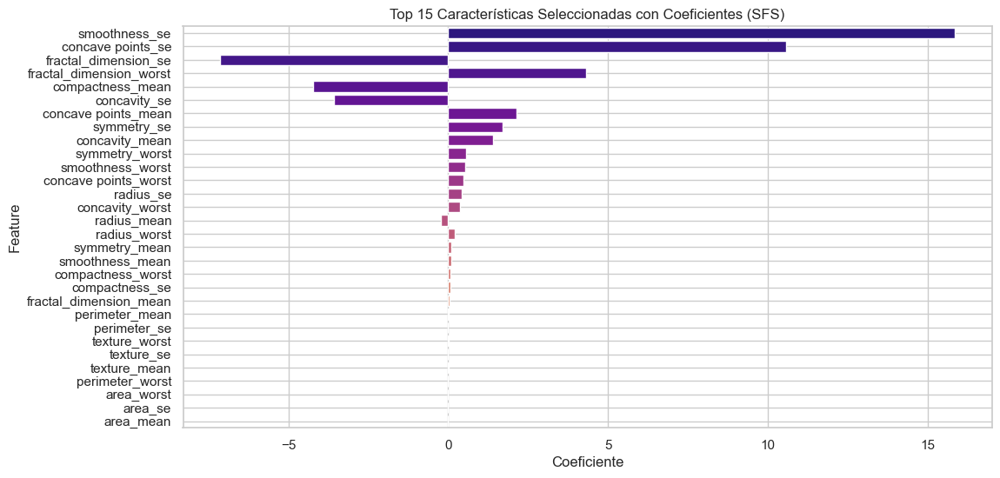

In [102]:
lr = LinearRegression()

# Inicializa el SFS con el modelo de regresión lineal y el número deseado de características a seleccionar
sfs = SequentialFeatureSelector(lr, k_features=30, forward=True, floating=False, scoring='neg_mean_squared_error', cv=5)

# Ajusta el SFS al conjunto de datos
sfs = sfs.fit(X_df, y_encoded)

# Obtiene las características seleccionadas
selected_feature_indices = list(sfs.k_feature_idx_)

# Ajusta un modelo de regresión lineal separado con las características seleccionadas
lr_selected_sfs = LinearRegression()
lr_selected_sfs.fit(X_df.iloc[:, selected_feature_indices], y_encoded)

# Obtiene los coeficientes del modelo ajustado
coefficients_sfs = lr_selected_sfs.coef_

# Creación del DataFrame y ordenación similar a RandomForestClassifier
selected_features_df_sfs = pd.DataFrame({
    'Feature': X_df.columns[selected_feature_indices],
    'Coefficient': coefficients_sfs
})

selected_features_df_sfs = selected_features_df_sfs.reindex(
    selected_features_df_sfs['Coefficient'].abs().sort_values(ascending=False).index
)

# Imprime las características seleccionadas y sus coeficientes
print("Top 15 Características Seleccionadas (SFS):")
print(selected_features_df_sfs)

# Crea un bar plot para visualizar la importancia de las características seleccionadas
plt.figure(figsize=(12, 6))
sns.barplot(x='Coefficient', y='Feature', data=selected_features_df_sfs, palette='plasma')
plt.title('Top 15 Características Seleccionadas con Coeficientes (SFS)')
plt.xlabel('Coeficiente')
plt.ylabel('Feature')
plt.grid(True)
plt.show()

## Selección de atributos ##

Top 15 Características Seleccionadas (SFS):
           Feature           Coefficient
7             smoothness_se   20.650621 
4       concave points_mean    4.716529 
5    fractal_dimension_mean   -4.698951 
14  fractal_dimension_worst    4.583104 
3          compactness_mean   -3.405841 
12     concave points_worst    1.095699 
13           symmetry_worst    0.733777 
0               radius_mean   -0.356232 
8              radius_worst    0.248895 
1            perimeter_mean    0.035019 
6                texture_se    0.013260 
9             texture_worst    0.009309 
10          perimeter_worst   -0.003381 
11               area_worst   -0.001241 
2                 area_mean    0.000672 


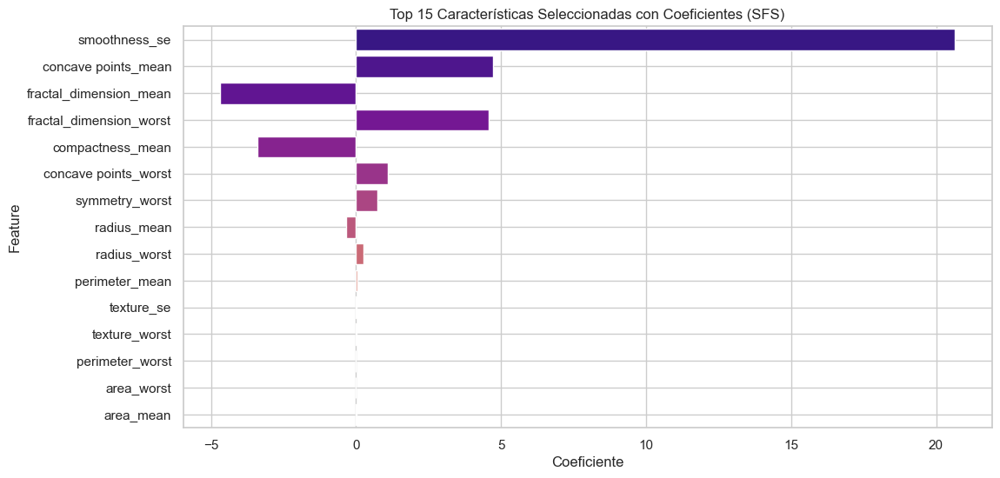

In [103]:
lr = LinearRegression()

# Inicializa el SFS con el modelo de regresión lineal y el número deseado de características a seleccionar
sfs = SequentialFeatureSelector(lr, k_features=15, forward=True, floating=False, scoring='neg_mean_squared_error', cv=5)

# Ajusta el SFS al conjunto de datos
sfs = sfs.fit(X_df, y_encoded)

# Obtiene las características seleccionadas
selected_feature_indices = list(sfs.k_feature_idx_)

# Ajusta un modelo de regresión lineal separado con las características seleccionadas
lr_selected_sfs = LinearRegression()
lr_selected_sfs.fit(X_df.iloc[:, selected_feature_indices], y_encoded)

# Obtiene los coeficientes del modelo ajustado
coefficients_sfs = lr_selected_sfs.coef_

# Creación del DataFrame y ordenación similar a RandomForestClassifier
selected_features_df_sfs = pd.DataFrame({
    'Feature': X_df.columns[selected_feature_indices],
    'Coefficient': coefficients_sfs
})

selected_features_df_sfs = selected_features_df_sfs.reindex(
    selected_features_df_sfs['Coefficient'].abs().sort_values(ascending=False).index
)
# Imprime las características seleccionadas y sus coeficientes
print("Top 15 Características Seleccionadas (SFS):")
print(selected_features_df_sfs)

# Crea un bar plot para visualizar la importancia de las características seleccionadas
plt.figure(figsize=(12, 6))
sns.barplot(x='Coefficient', y='Feature', data=selected_features_df_sfs, palette='plasma')
plt.title('Top 15 Características Seleccionadas con Coeficientes (SFS)')
plt.xlabel('Coeficiente')
plt.ylabel('Feature')
plt.grid(True)
plt.show()

<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: cornflowerblue;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">Sequential Backward Selection (SBS)
    
</h2>
</div>

Características Seleccionadas (SBS):
           Feature           Coefficient
14            smoothness_se   15.854321 
17        concave points_se   10.567951 
19     fractal_dimension_se   -7.146440 
29  fractal_dimension_worst    4.303483 
5          compactness_mean   -4.222035 
16             concavity_se   -3.565468 
7       concave points_mean    2.141833 
18              symmetry_se    1.697341 
6            concavity_mean    1.397997 
28           symmetry_worst    0.556788 
24         smoothness_worst    0.542857 
27     concave points_worst    0.464310 
10                radius_se    0.434956 
26          concavity_worst    0.381191 
0               radius_mean   -0.217772 
20             radius_worst    0.195183 
8             symmetry_mean    0.102709 
4           smoothness_mean    0.084689 
25        compactness_worst    0.067158 
15           compactness_se    0.064903 
9    fractal_dimension_mean    0.033262 
2            perimeter_mean    0.023740 
12             perim

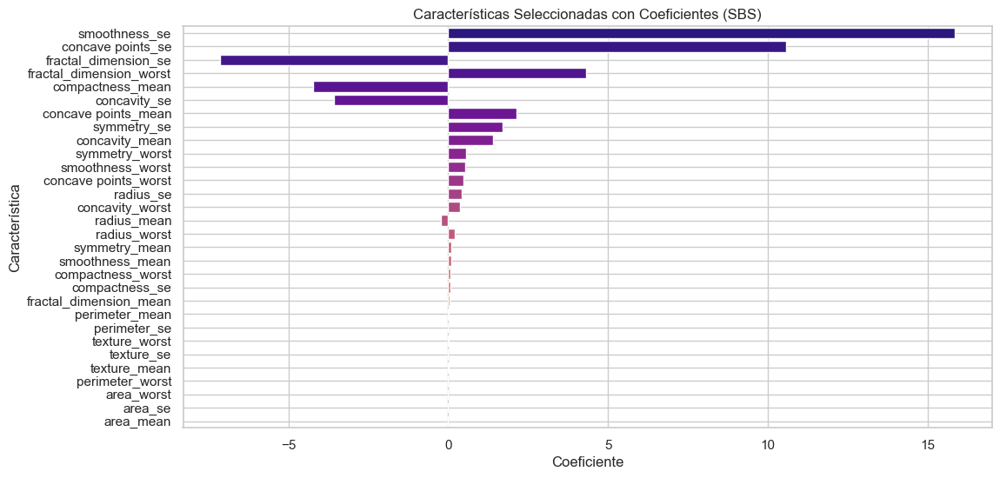

In [113]:
lr = LinearRegression()

# Inicializa el Sequential Backward Selection (SBS)
sbs = SequentialFeatureSelector(lr, k_features=30, forward=False, scoring='neg_mean_squared_error', cv=5)

# Ajusta el SBS al conjunto de datos
sbs.fit(X_df, y_encoded)

# Obtén las características seleccionadas
selected_features_sbs = list(X_df.columns[list(sbs.k_feature_idx_)])

# Ajusta un modelo de regresión lineal separado con las características seleccionadas
lr_selected_sbs = LinearRegression()
lr_selected_sbs.fit(X_df[selected_features_sbs], y_encoded)

# Obtiene los coeficientes del modelo ajustado
coefficients_sbs = lr_selected_sbs.coef_

# Crea un DataFrame con las características seleccionadas y sus coeficientes
selected_features_df_sbs = pd.DataFrame({
    'Feature': selected_features_sbs,
    'Coefficient': coefficients_sbs
})

# Ordena las características por importancia (coeficiente absoluto)
selected_features_df_sbs = selected_features_df_sbs.reindex(
    selected_features_df_sbs['Coefficient'].abs().sort_values(ascending=False).index
)

# Imprime las características seleccionadas y sus coeficientes
print("Características Seleccionadas (SBS):")
print(selected_features_df_sbs)

# Crea un bar plot para visualizar la importancia de las características seleccionadas
plt.figure(figsize=(12, 6))
sns.barplot(x='Coefficient', y='Feature', data=selected_features_df_sbs, palette='plasma')
plt.title('Características Seleccionadas con Coeficientes (SBS)')
plt.xlabel('Coeficiente')
plt.ylabel('Característica')
plt.grid(True)
plt.show()

## Selección de atributos ##

Top 15 Características Seleccionadas (SBS):
           Feature           Coefficient
6             smoothness_se   17.963345 
8         concave points_se   10.592318 
1          compactness_mean   -4.453580 
14  fractal_dimension_worst    3.993814 
7              concavity_se   -3.866614 
2            concavity_mean    2.629709 
3       concave points_mean    2.560896 
13           symmetry_worst    0.827256 
12        compactness_worst    0.367136 
4                 radius_se    0.193879 
9              radius_worst    0.181459 
0               radius_mean   -0.042080 
10            texture_worst    0.009819 
11               area_worst   -0.000962 
5                   area_se   -0.000444 


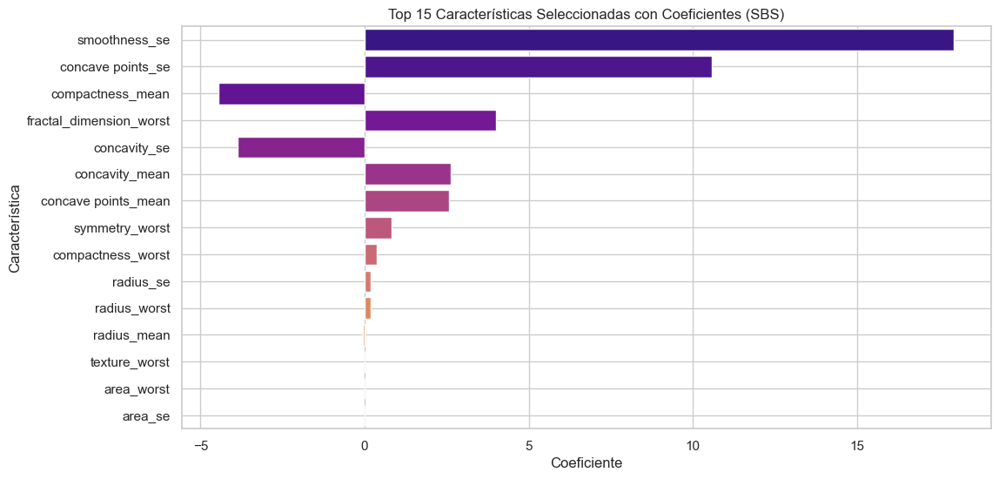

In [388]:
from mlxtend.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import LinearRegression

# Inicializa el Sequential Backward Selection (SBS)
num_features_to_select = 15  # Puedes ajustar este valor según tus necesidades
sbs = SequentialFeatureSelector(LinearRegression(), k_features=num_features_to_select, forward=False, scoring='neg_mean_squared_error', cv=5)

# Ajusta el SBS al conjunto de datos
sbs.fit(X_df, y_encoded)

# Obtén las características seleccionadas
selected_features_sbs = list(X_df.columns[list(sbs.k_feature_idx_)])

# Ajusta un modelo de regresión lineal separado con las características seleccionadas
lr_selected_sbs = LinearRegression()
lr_selected_sbs.fit(X_df[selected_features_sbs], y_encoded)

# Obtiene los coeficientes del modelo ajustado
coefficients_sbs = lr_selected_sbs.coef_

# Creación del DataFrame y ordenación similar a RandomForestClassifier
selected_features_df_sbs = pd.DataFrame({
    'Feature': selected_features_sbs,  # Utilizamos directamente las características seleccionadas
    'Coefficient': coefficients_sbs
})

# Ordena el DataFrame por la importancia de los coeficientes en valor absoluto
selected_features_df_sbs = selected_features_df_sbs.sort_values(by='Coefficient', key=abs, ascending=False)

# Imprime las características seleccionadas y sus coeficientes
print("Top 15 Características Seleccionadas (SBS):")
print(selected_features_df_sbs)

# Crea un bar plot para visualizar la importancia de las características seleccionadas
plt.figure(figsize=(12, 6))
sns.barplot(x='Coefficient', y='Feature', data=selected_features_df_sbs, palette='plasma')
plt.title('Top 15 Características Seleccionadas con Coeficientes (SBS)')
plt.xlabel('Coeficiente')
plt.ylabel('Característica')
plt.grid(True)
plt.show()

<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: cornflowerblue;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">Recursive Feature Elimination (RFE)
    
</h2>
</div>

Mejores 30 Características Seleccionadas (RFE):
           Feature           Coefficient
14            smoothness_se   15.854321 
17        concave points_se   10.567951 
19     fractal_dimension_se   -7.146440 
29  fractal_dimension_worst    4.303483 
5          compactness_mean   -4.222035 
16             concavity_se   -3.565468 
7       concave points_mean    2.141833 
18              symmetry_se    1.697341 
6            concavity_mean    1.397997 
28           symmetry_worst    0.556788 
24         smoothness_worst    0.542857 
27     concave points_worst    0.464310 
10                radius_se    0.434956 
26          concavity_worst    0.381191 
0               radius_mean   -0.217772 
20             radius_worst    0.195183 
8             symmetry_mean    0.102709 
4           smoothness_mean    0.084689 
25        compactness_worst    0.067158 
15           compactness_se    0.064903 
9    fractal_dimension_mean    0.033262 
2            perimeter_mean    0.023740 
12       

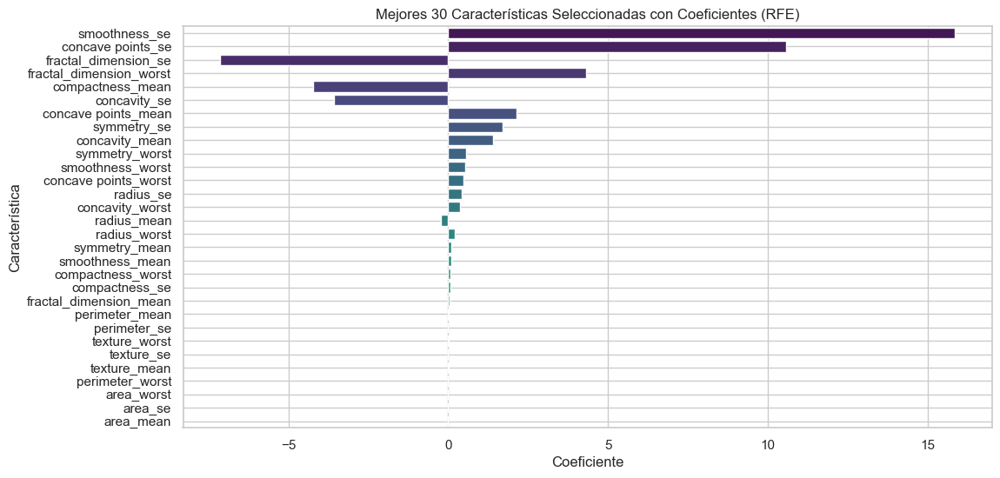

In [116]:
lr = LinearRegression()

# Inicializa RFE con el modelo de regresión lineal y el número deseado de características a seleccionar
num_features_to_select = 30  # Puedes ajustar este valor según tus necesidades
rfe = RFE(lr, n_features_to_select=num_features_to_select)

# Ajusta RFE al conjunto de datos
rfe.fit(X_df, y_encoded)

# Obtiene las características seleccionadas
selected_features_rfe = list(X_df.columns[rfe.support_])

# Ajusta un modelo de regresión lineal separado con las características seleccionadas
lr_selected_rfe = LinearRegression()
lr_selected_rfe.fit(X_df[selected_features_rfe], y_encoded)

# Obtiene los coeficientes del modelo ajustado
coefficients_rfe = lr_selected_rfe.coef_

# Crea un DataFrame con las características seleccionadas y sus coeficientes
selected_features_df_rfe = pd.DataFrame({
    'Feature': selected_features_rfe,
    'Coefficient': coefficients_rfe
})

# Ordena las características por importancia (coeficiente absoluto)
selected_features_df_rfe = selected_features_df_rfe.reindex(
    selected_features_df_rfe['Coefficient'].abs().sort_values(ascending=False).index
)

# Imprime las características seleccionadas y sus coeficientes
print("Mejores 30 Características Seleccionadas (RFE):")
print(selected_features_df_rfe)

# Crea un bar plot para visualizar la importancia de las características seleccionadas
plt.figure(figsize=(12, 6))
sns.barplot(x='Coefficient', y='Feature', data=selected_features_df_rfe, palette='viridis')
plt.title('Mejores 30 Características Seleccionadas con Coeficientes (RFE)')
plt.xlabel('Coeficiente')
plt.ylabel('Característica')
plt.grid(True)
plt.show()

## Selección de atributos ##

Mejores 15 Características Seleccionadas (RFE):
           Feature           Coefficient
4    fractal_dimension_mean  -17.748906 
6             smoothness_se   11.220817 
9         concave points_se    9.864576 
14  fractal_dimension_worst    6.255327 
2       concave points_mean    5.827787 
0           smoothness_mean   -2.962324 
8              concavity_se   -2.914924 
10         smoothness_worst    1.889790 
7            compactness_se   -1.843071 
1          compactness_mean   -1.429123 
13           symmetry_worst    1.128606 
12     concave points_worst    0.811616 
3             symmetry_mean   -0.597931 
11          concavity_worst    0.533872 
5                 radius_se    0.313184 


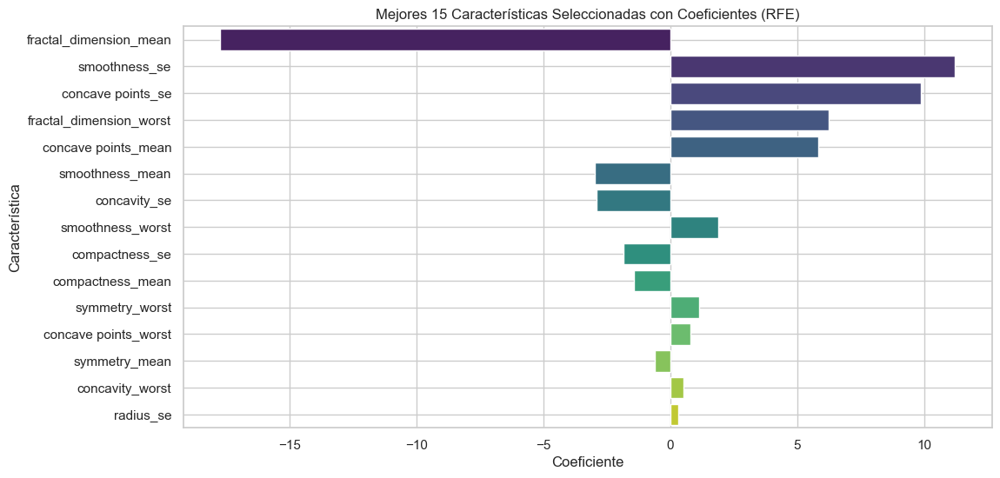

In [117]:
lr = LinearRegression()

# Inicializa RFE con el modelo de regresión lineal y el número deseado de características a seleccionar
num_features_to_select = 15  # Ajusta este valor según tus necesidades
rfe = RFE(lr, n_features_to_select=num_features_to_select)

# Ajusta RFE al conjunto de datos
rfe.fit(X_df, y_encoded)

# Obtiene las características seleccionadas
selected_features_rfe = list(X_df.columns[rfe.support_])

# Ajusta un modelo de regresión lineal separado con las características seleccionadas
lr_selected_rfe = LinearRegression()
lr_selected_rfe.fit(X_df[selected_features_rfe], y_encoded)

# Obtiene los coeficientes del modelo ajustado
coefficients_rfe = lr_selected_rfe.coef_

# Crea un DataFrame con las características seleccionadas y sus coeficientes
selected_features_df_rfe = pd.DataFrame({
    'Feature': selected_features_rfe,
    'Coefficient': coefficients_rfe
})

# Ordena las características por importancia (coeficiente absoluto)
selected_features_df_rfe = selected_features_df_rfe.reindex(
    selected_features_df_rfe['Coefficient'].abs().sort_values(ascending=False).index
)

# Imprime las características seleccionadas y sus coeficientes
print("Mejores 15 Características Seleccionadas (RFE):")
print(selected_features_df_rfe)

# Crea un bar plot para visualizar la importancia de las características seleccionadas
plt.figure(figsize=(12, 6))
sns.barplot(x='Coefficient', y='Feature', data=selected_features_df_rfe, palette='viridis')
plt.title('Mejores 15 Características Seleccionadas con Coeficientes (RFE)')
plt.xlabel('Coeficiente')
plt.ylabel('Característica')
plt.grid(True)
plt.show()


<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: cornflowerblue;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">Recursive Feature Elimination with Cross-Validation (RFECV)
    
</h2>
</div>

Características Seleccionadas (RFECV):
           Feature           Coefficient
13            smoothness_se   16.280172 
16        concave points_se    9.571741 
18     fractal_dimension_se   -7.410717 
4          compactness_mean   -4.363200 
28  fractal_dimension_worst    4.342055 
15             concavity_se   -3.464580 
6       concave points_mean    2.206082 
17              symmetry_se    1.622105 
5            concavity_mean    1.428341 
23         smoothness_worst    0.622323 
27           symmetry_worst    0.587056 
26     concave points_worst    0.543373 
9                 radius_se    0.455262 
8    fractal_dimension_mean    0.409821 
25          concavity_worst    0.365036 
0               radius_mean   -0.186541 
19             radius_worst    0.175414 
24        compactness_worst    0.079876 
7             symmetry_mean    0.064133 
14           compactness_se    0.063917 
3           smoothness_mean   -0.040315 
2            perimeter_mean    0.024696 
11             per

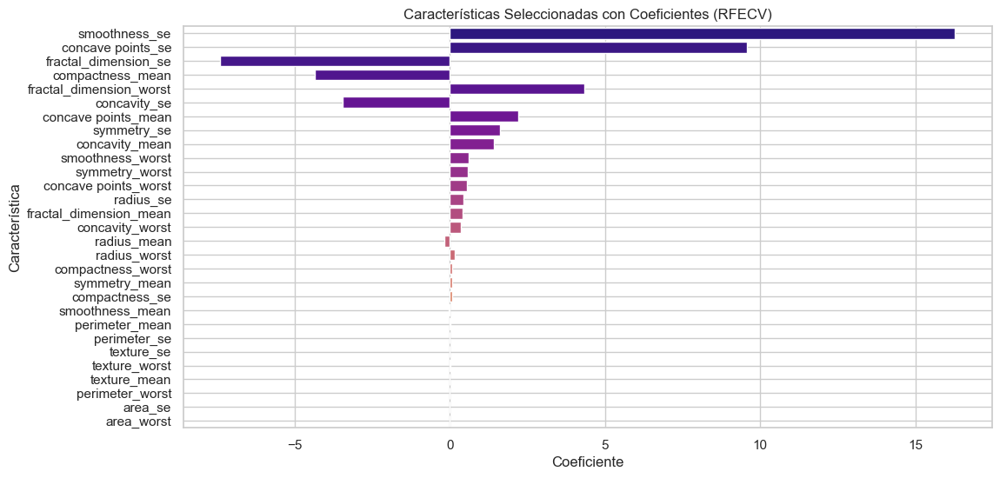

In [118]:
# Inicializa el modelo de regresión lineal
lr = LinearRegression()

# Inicializa el RFECV con el modelo de regresión lineal
rfecv = RFECV(estimator=lr, step=1, cv=5, scoring='neg_mean_squared_error')

# Ajusta el RFECV al conjunto de datos
rfecv.fit(X_df, y_encoded)

# Obtiene las características seleccionadas
selected_features_rfecv = list(X_df.columns[rfecv.support_])

# Ajusta un modelo de regresión lineal separado con las características seleccionadas
lr_selected_rfecv = LinearRegression()
lr_selected_rfecv.fit(X_df[selected_features_rfecv], y_encoded)

# Obtiene los coeficientes del modelo ajustado
coefficients_rfecv = lr_selected_rfecv.coef_

# Crea un DataFrame con las características seleccionadas y sus coeficientes
selected_features_df_rfecv = pd.DataFrame({
    'Feature': selected_features_rfecv,
    'Coefficient': coefficients_rfecv
})

# Ordena las características por importancia (coeficiente absoluto)
selected_features_df_rfecv = selected_features_df_rfecv.reindex(
    selected_features_df_rfecv['Coefficient'].abs().sort_values(ascending=False).index
)

# Imprime las características seleccionadas y sus coeficientes
print("Características Seleccionadas (RFECV):")
print(selected_features_df_rfecv)

# Crea un bar plot para visualizar la importancia de las características seleccionadas
plt.figure(figsize=(12, 6))
sns.barplot(x='Coefficient', y='Feature', data=selected_features_df_rfecv, palette='plasma')
plt.title('Características Seleccionadas con Coeficientes (RFECV)')
plt.xlabel('Coeficiente')
plt.ylabel('Característica')
plt.grid(True)
plt.show()

## Selección de atributos ##

Mejores 15 Características Seleccionadas (RFECV):
           Feature          Coefficient
6      concave points_mean   4.550517  
8   fractal_dimension_mean  -3.773620  
14          compactness_se  -2.962760  
4         compactness_mean   1.761502  
3          smoothness_mean   1.493077  
5           concavity_mean   1.300692  
7            symmetry_mean   0.773294  
9                radius_se   0.609774  
13           smoothness_se   0.486511  
0              radius_mean   0.427273  
10              texture_se  -0.085228  
2           perimeter_mean  -0.059651  
1             texture_mean   0.025357  
12                 area_se  -0.003928  
11            perimeter_se   0.003225  


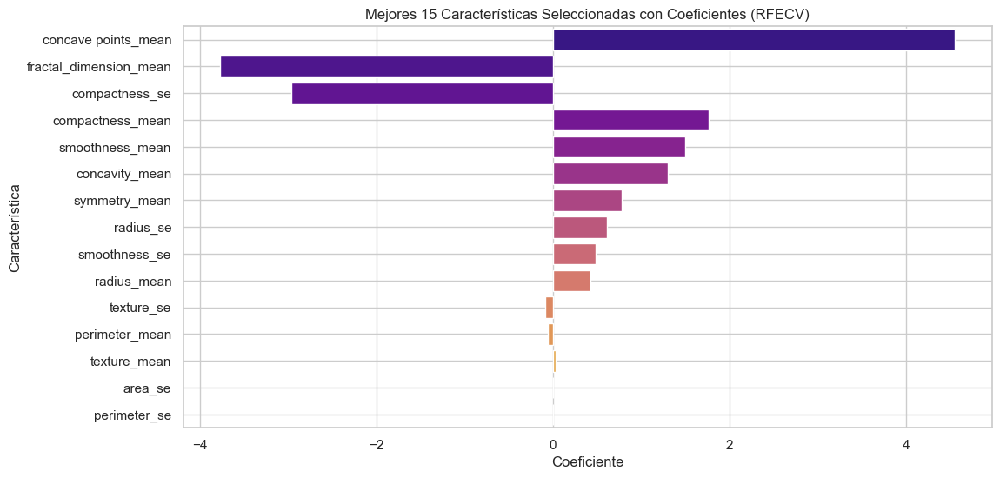

In [389]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFECV

# Supongamos que X_df es tu DataFrame de características y y_encoded es tu variable objetivo

# Inicializa el modelo de regresión lineal
lr = LinearRegression()

# Inicializa RFECV con el modelo de regresión lineal y los parámetros deseados
rfecv = RFECV(estimator=lr, step=1, cv=5, scoring='neg_mean_squared_error')

# Ajusta RFECV al conjunto de datos
rfecv.fit(X_df, y_encoded)

# Obtiene las características seleccionadas
selected_features_rfecv = list(X_df.columns[rfecv.support_])

# Selecciona los 15 atributos más altos
selected_features_rfecv_top15 = selected_features_rfecv[:15]

# Ajusta un modelo de regresión lineal separado con las características seleccionadas
lr_selected_rfecv = LinearRegression()
lr_selected_rfecv.fit(X_df[selected_features_rfecv_top15], y_encoded)

# Obtiene los coeficientes del modelo ajustado
coefficients_rfecv = lr_selected_rfecv.coef_

# Crea un DataFrame con las características seleccionadas y sus coeficientes
selected_features_df_rfecv_top15 = pd.DataFrame({
    'Feature': selected_features_rfecv_top15,
    'Coefficient': coefficients_rfecv
})

# Ordena las características por importancia (coeficiente absoluto)
selected_features_df_rfecv_top15 = selected_features_df_rfecv_top15.reindex(
    selected_features_df_rfecv_top15['Coefficient'].abs().sort_values(ascending=False).index
)

# Imprime las características seleccionadas y sus coeficientes
print("Mejores 15 Características Seleccionadas (RFECV):")
print(selected_features_df_rfecv_top15)

# Crea un bar plot para visualizar la importancia de las características seleccionadas
plt.figure(figsize=(12, 6))
sns.barplot(x='Coefficient', y='Feature', data=selected_features_df_rfecv_top15, palette='plasma')
plt.title('Mejores 15 Características Seleccionadas con Coeficientes (RFECV)')
plt.xlabel('Coeficiente')
plt.ylabel('Característica')
plt.grid(True)
plt.show()


<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: cornflowerblue;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">Randomized Feature Elimination (RFE Randomized)
    
</h2>
</div>

Características Seleccionadas (Randomized Feature Elimination):
           Feature           Coefficient
17            smoothness_se   17.897476 
1           smoothness_mean   -5.285575 
19           compactness_se   -4.759046 
12      concave points_mean    4.234777 
7               symmetry_se    3.157400 
15  fractal_dimension_worst    2.377090 
4          smoothness_worst    2.241039 
9            concavity_mean   -0.984859 
5      concave points_worst    0.756487 
11          concavity_worst    0.564079 
0             symmetry_mean    0.440470 
3              radius_worst    0.216526 
8                texture_se    0.077271 
18        compactness_worst    0.041240 
2         concave points_se   -0.040730 
6              perimeter_se    0.011229 
10           perimeter_mean   -0.007218 
14          perimeter_worst   -0.004036 
13               area_worst   -0.000996 
16                  area_se    0.000595 


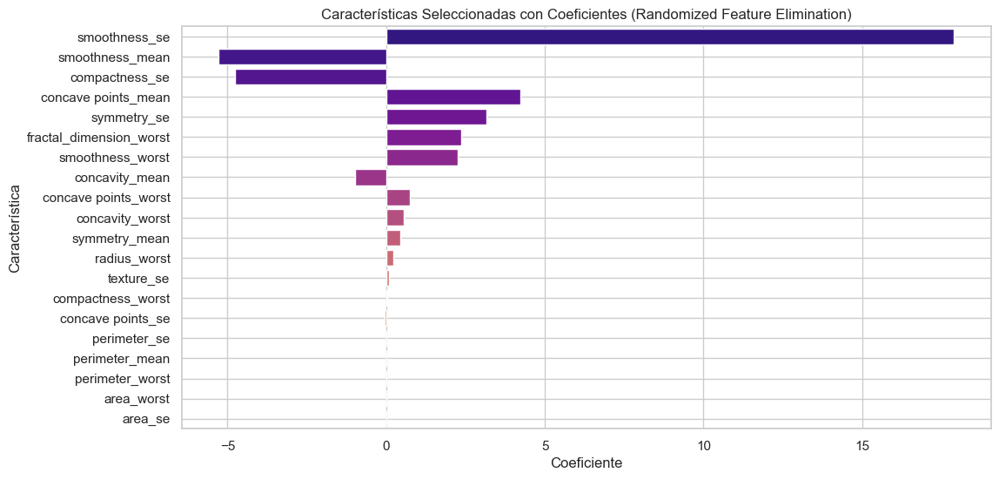

In [120]:


# Supongamos que X_df es tu DataFrame de características y y_encoded es tu variable objetivo
# Asegúrate de que X_df y y_encoded estén definidos antes de ejecutar este código

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_df, y_encoded, test_size=0.2, random_state=42)

# Inicializa el modelo de regresión lineal
lr = LinearRegression()

# Inicializa el número de iteraciones y la lista para almacenar resultados
num_iterations = 100
mse_scores = []

for _ in range(num_iterations):
    # Selecciona aleatoriamente un subconjunto de características
    num_features = np.random.randint(1, X_train.shape[1] + 1)
    random_indices = np.random.choice(X_train.shape[1], size=num_features, replace=False)
    X_train_random = X_train.iloc[:, random_indices]

    # Ajusta el modelo de regresión lineal con el subconjunto seleccionado
    lr.fit(X_train_random, y_train)

    # Evalúa el modelo en el conjunto de prueba
    mse = np.mean((lr.predict(X_test.iloc[:, random_indices]) - y_test) ** 2)
    mse_scores.append(mse)

# Encuentra el índice del subconjunto con el menor error cuadrático medio
best_subset_index = np.argmin(mse_scores)

# Obtiene las características seleccionadas en la iteración con el menor error
selected_features_random = list(X_train.columns[np.random.choice(X_train.shape[1], size=num_features, replace=False)])

# Ajusta un modelo de regresión lineal separado con las características seleccionadas
lr_selected_random = LinearRegression()
lr_selected_random.fit(X_df[selected_features_random], y_encoded)

# Obtiene los coeficientes del modelo ajustado
coefficients_random = lr_selected_random.coef_

# Crea un DataFrame con las características seleccionadas y sus coeficientes
selected_features_df_random = pd.DataFrame({
    'Feature': selected_features_random,
    'Coefficient': coefficients_random
})

# Ordena las características por importancia (coeficiente absoluto)
selected_features_df_random = selected_features_df_random.reindex(
    selected_features_df_random['Coefficient'].abs().sort_values(ascending=False).index
)

# Imprime las características seleccionadas y sus coeficientes
print("Características Seleccionadas (Randomized Feature Elimination):")
print(selected_features_df_random)

# Crea un bar plot para visualizar la importancia de las características seleccionadas
plt.figure(figsize=(12, 6))
sns.barplot(x='Coefficient', y='Feature', data=selected_features_df_random, palette='plasma')
plt.title('Características Seleccionadas con Coeficientes (Randomized Feature Elimination)')
plt.xlabel('Coeficiente')
plt.ylabel('Característica')
plt.grid(True)
plt.show()


## Selección de atributos ##

Top 15 Características Seleccionadas (Randomized Feature Elimination):
           Feature          Coefficient
12  fractal_dimension_mean   5.755205  
14     concave points_mean   4.848044  
4              symmetry_se   4.782440  
1         compactness_mean  -3.206788  
7         smoothness_worst   2.580231  
8             concavity_se  -1.938965  
5          concavity_worst   0.750299  
3                radius_se   0.302018  
11            radius_worst   0.152340  
9           concavity_mean  -0.077738  
6             perimeter_se  -0.009330  
2             texture_mean   0.007758  
10           texture_worst   0.006027  
13              area_worst  -0.000839  
0                area_mean  -0.000295  


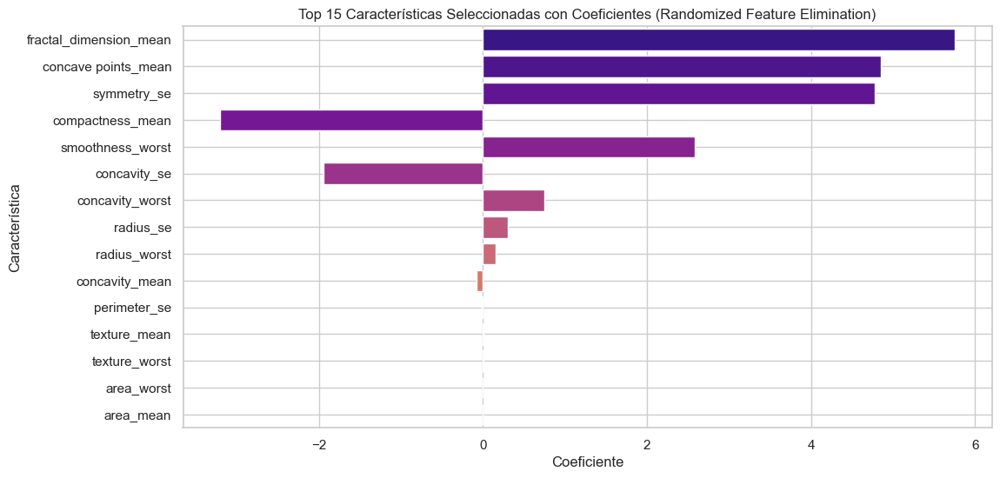

In [390]:
# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_df, y_encoded, test_size=0.2, random_state=42)

# Inicializa el modelo de regresión lineal
lr = LinearRegression()

# Inicializa el número de iteraciones y la lista para almacenar resultados
num_iterations = 100
mse_scores = []

for _ in range(num_iterations):
    # Selecciona aleatoriamente un subconjunto de características
    num_features = np.random.randint(1, X_train.shape[1] + 1)
    random_indices = np.random.choice(X_train.shape[1], size=num_features, replace=False)
    X_train_random = X_train.iloc[:, random_indices]

    # Ajusta el modelo de regresión lineal con el subconjunto seleccionado
    lr.fit(X_train_random, y_train)

    # Evalúa el modelo en el conjunto de prueba
    mse = np.mean((lr.predict(X_test.iloc[:, random_indices]) - y_test) ** 2)
    mse_scores.append(mse)

# Encuentra el índice del subconjunto con el menor error cuadrático medio
best_subset_index = np.argmin(mse_scores)

# Obtiene las características seleccionadas en la iteración con el menor error
selected_features_random = list(X_train.columns[np.random.choice(X_train.shape[1], size=num_features, replace=False)])

# Selecciona solo los 15 atributos más altos
selected_features_random = selected_features_random[:15]

# Ajusta un modelo de regresión lineal separado con las características seleccionadas
lr_selected_random = LinearRegression()
lr_selected_random.fit(X_df[selected_features_random], y_encoded)

# Obtiene los coeficientes del modelo ajustado
coefficients_random = lr_selected_random.coef_

# Crea un DataFrame con las características seleccionadas y sus coeficientes
selected_features_df_random = pd.DataFrame({
    'Feature': selected_features_random,
    'Coefficient': coefficients_random
})

# Ordena las características por importancia (coeficiente absoluto)
selected_features_df_random = selected_features_df_random.reindex(
    selected_features_df_random['Coefficient'].abs().sort_values(ascending=False).index
)

# Imprime las características seleccionadas y sus coeficientes
print("Top 15 Características Seleccionadas (Randomized Feature Elimination):")
print(selected_features_df_random)

# Crea un bar plot para visualizar la importancia de las características seleccionadas
plt.figure(figsize=(12, 6))
sns.barplot(x='Coefficient', y='Feature', data=selected_features_df_random, palette='plasma')
plt.title('Top 15 Características Seleccionadas con Coeficientes (Randomized Feature Elimination)')
plt.xlabel('Coeficiente')
plt.ylabel('Característica')
plt.grid(True)
plt.show()


<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: cornflowerblue;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">Sequential Floating Forward Selection (SFFS)
</h2>
</div>

Características Seleccionadas (SFFS):
           Feature           Coefficient
8      fractal_dimension_se  -21.780174 
6             smoothness_se   19.601320 
15  fractal_dimension_worst    6.195835 
3       concave points_mean    5.578333 
7         concave points_se    5.516780 
2          compactness_mean   -4.891024 
14           symmetry_worst    0.740040 
13        compactness_worst    0.368876 
4                 radius_se    0.328241 
0               radius_mean   -0.312786 
9              radius_worst    0.201916 
1            perimeter_mean    0.042793 
10            texture_worst    0.010095 
11          perimeter_worst   -0.005178 
5                   area_se   -0.001093 
12               area_worst   -0.000906 


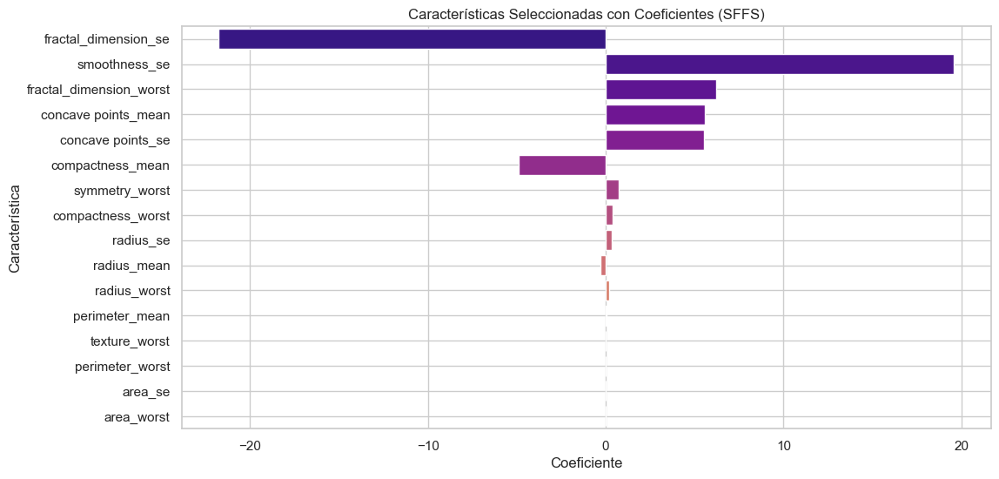

In [123]:
# Inicializa el modelo de regresión lineal
lr = LinearRegression()

# Inicializa el SFS con el modelo de regresión lineal y el número deseado de características a seleccionar
sfs = SFS(lr, k_features=(1, len(X_df.columns)), forward=True, floating=True, scoring='neg_mean_squared_error', cv=5)

# Ajusta el SFS al conjunto de datos
sfs = sfs.fit(X_df, y_encoded)

# Obtiene las características seleccionadas
selected_features_sffs = list(sfs.k_feature_names_)

# Ajusta un modelo de regresión lineal separado con las características seleccionadas
lr_selected_sffs = LinearRegression()
lr_selected_sffs.fit(X_df[selected_features_sffs], y_encoded)

# Obtiene los coeficientes del modelo ajustado
coefficients_sffs = lr_selected_sffs.coef_

# Crea un DataFrame con las características seleccionadas y sus coeficientes
selected_features_df_sffs = pd.DataFrame({
    'Feature': selected_features_sffs,
    'Coefficient': coefficients_sffs
})

# Ordena las características por importancia (coeficiente absoluto)
selected_features_df_sffs = selected_features_df_sffs.reindex(
    selected_features_df_sffs['Coefficient'].abs().sort_values(ascending=False).index
)

# Selecciona las primeras características más importantes
top_15_features_sffs = selected_features_df_sffs.head(30)

# Imprime las características seleccionadas y sus coeficientes
print("Características Seleccionadas (SFFS):")
print(top_15_features_sffs)

# Crea un bar plot para visualizar las 15 características más importantes
plt.figure(figsize=(12, 6))
sns.barplot(x='Coefficient', y='Feature', data=top_15_features_sffs, palette='plasma')
plt.title('Características Seleccionadas con Coeficientes (SFFS)')
plt.xlabel('Coeficiente')
plt.ylabel('Característica')
plt.grid(True)
plt.show()


## Selección de atributos ##

Top 15 Características Seleccionadas (SFFS):
           Feature           Coefficient
8      fractal_dimension_se  -21.780174 
6             smoothness_se   19.601320 
15  fractal_dimension_worst    6.195835 
3       concave points_mean    5.578333 
7         concave points_se    5.516780 
2          compactness_mean   -4.891024 
14           symmetry_worst    0.740040 
13        compactness_worst    0.368876 
4                 radius_se    0.328241 
0               radius_mean   -0.312786 
9              radius_worst    0.201916 
1            perimeter_mean    0.042793 
10            texture_worst    0.010095 
11          perimeter_worst   -0.005178 
5                   area_se   -0.001093 


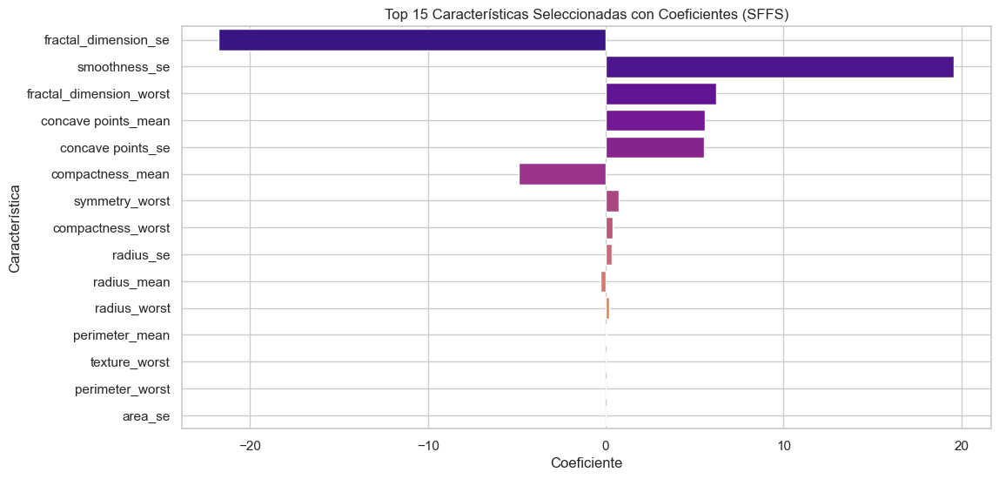

In [124]:
# Inicializa el modelo de regresión lineal
lr = LinearRegression()

# Inicializa el SFS con el modelo de regresión lineal y el número deseado de características a seleccionar
sfs = SFS(lr, k_features=(1, len(X_df.columns)), forward=True, floating=True, scoring='neg_mean_squared_error', cv=5)

# Ajusta el SFS al conjunto de datos
sfs = sfs.fit(X_df, y_encoded)

# Obtiene las características seleccionadas
selected_features_sffs = list(sfs.k_feature_names_)

# Ajusta un modelo de regresión lineal separado con las características seleccionadas
lr_selected_sffs = LinearRegression()
lr_selected_sffs.fit(X_df[selected_features_sffs], y_encoded)

# Obtiene los coeficientes del modelo ajustado
coefficients_sffs = lr_selected_sffs.coef_

# Crea un DataFrame con las características seleccionadas y sus coeficientes
selected_features_df_sffs = pd.DataFrame({
    'Feature': selected_features_sffs,
    'Coefficient': coefficients_sffs
})

# Ordena las características por importancia (coeficiente absoluto)
selected_features_df_sffs = selected_features_df_sffs.reindex(
    selected_features_df_sffs['Coefficient'].abs().sort_values(ascending=False).index
)

# Selecciona las primeras 15 características más importantes
top_15_features_sffs = selected_features_df_sffs.head(15)

# Imprime las características seleccionadas y sus coeficientes
print("Top 15 Características Seleccionadas (SFFS):")
print(top_15_features_sffs)

# Crea un bar plot para visualizar las 15 características más importantes
plt.figure(figsize=(12, 6))
sns.barplot(x='Coefficient', y='Feature', data=top_15_features_sffs, palette='plasma')
plt.title('Top 15 Características Seleccionadas con Coeficientes (SFFS)')
plt.xlabel('Coeficiente')
plt.ylabel('Característica')
plt.grid(True)
plt.show()


<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: cornflowerblue;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">Sequential Floating Backward Selection (SFBS) 
</h2>
</div>

Características Seleccionadas (SFBS):
           Feature           Coefficient
5             smoothness_se   18.514399 
7         concave points_se   13.879792 
12  fractal_dimension_worst    5.609893 
6              concavity_se   -4.918757 
2            concavity_mean    3.609095 
1          compactness_mean   -3.504090 
3    fractal_dimension_mean   -3.328815 
11           symmetry_worst    0.916975 
8              radius_worst    0.192143 
4                 radius_se    0.112370 
0               radius_mean   -0.045228 
9             texture_worst    0.009719 
10               area_worst   -0.001000 


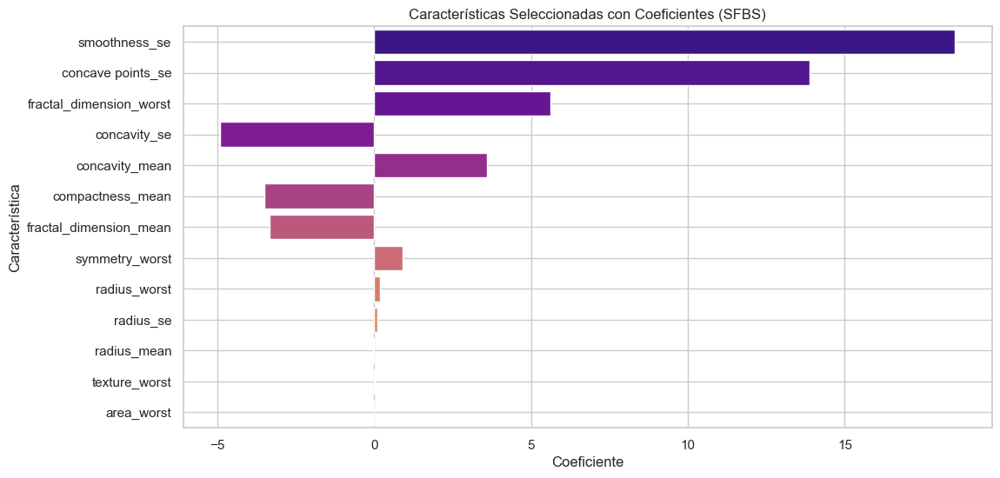

In [125]:
lr = LinearRegression()

# Inicializa el SFBS con el modelo de regresión lineal y el número deseado de características a seleccionar
sfbs = SequentialFeatureSelector(lr, k_features='best', forward=False, floating=True, scoring='neg_mean_squared_error', cv=5)

# Ajusta el SFBS al conjunto de datos
sfbs.fit(X_df, y_encoded)

# Obtiene las características seleccionadas
selected_features_sfbs = list(X_df.columns[list(sfbs.k_feature_idx_)])

# Ajusta un modelo de regresión lineal separado con las características seleccionadas
lr_selected_sfbs = LinearRegression()
lr_selected_sfbs.fit(X_df[selected_features_sfbs], y_encoded)

# Obtiene los coeficientes del modelo ajustado
coefficients_sfbs = lr_selected_sfbs.coef_

# Crea un DataFrame con las características seleccionadas y sus coeficientes
selected_features_df_sfbs = pd.DataFrame({
    'Feature': selected_features_sfbs,
    'Coefficient': coefficients_sfbs
})

# Ordena las características por importancia (coeficiente absoluto)
selected_features_df_sfbs = selected_features_df_sfbs.reindex(
    selected_features_df_sfbs['Coefficient'].abs().sort_values(ascending=False).index
)

# Imprime las características seleccionadas y sus coeficientes
print("Características Seleccionadas (SFBS):")
print(selected_features_df_sfbs)

# Crea un bar plot para visualizar la importancia de las características seleccionadas
plt.figure(figsize=(12, 6))
sns.barplot(x='Coefficient', y='Feature', data=selected_features_df_sfbs, palette='plasma')
plt.title('Características Seleccionadas con Coeficientes (SFBS)')
plt.xlabel('Coeficiente')
plt.ylabel('Característica')
plt.grid(True)
plt.show()

<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: plum;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Informe de Clasificación de Wrappers con SVC
    
</h2>
</div>

Resultados de SVC
Matriz de Confusión:
[[71  0]
 [ 2 41]]
Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99        71
           1       1.00      0.95      0.98        43

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



Sequential Feature Selector (SFS)
Matriz de Confusión:
[[349   8]
 [ 40 172]]
Sensibilidad (Recall): 0.8113207547169812
Especificidad: 0.9775910364145658
Informe de Clasificación:
              precision    recall  f1-score   support

     Benigno       0.90      0.98      0.94       357
     Maligno       0.96      0.81      0.88       212

    accuracy                           0.92       569
   macro avg       0.93      0.89      0.91       569
weighted avg       0.92      0.92      0.91       569

Precisión (Accuracy) para SFS: 0.9156414762741653
Sequential Backward Selection 

/var/folders/pp/wmccm1s10r7fdx87b695vhqw0000gn/T/ipykernel_64315/805205694.py:261: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




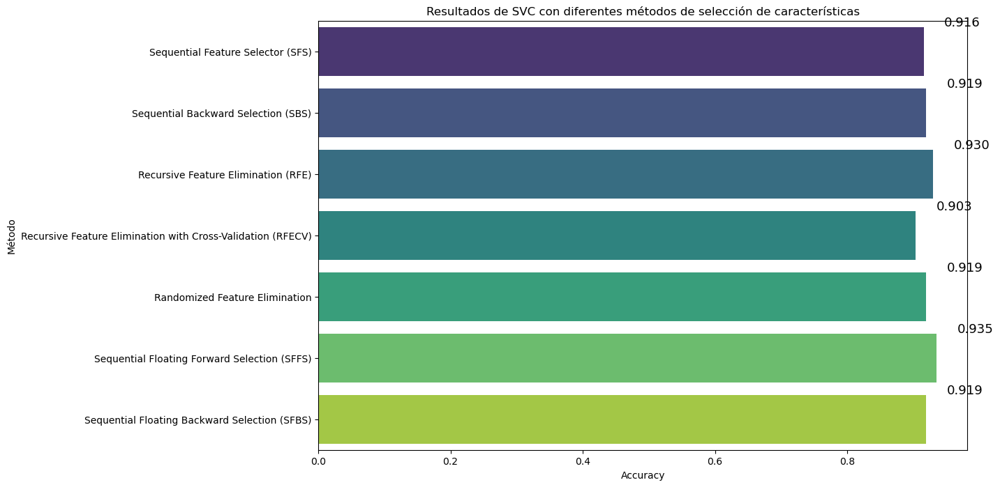

In [106]:
def evaluate_model(model, X_train, X_test, y_train, y_test, model_name):
    print(f"Resultados de {model_name}")

    # Entrenar el modelo y realizar predicciones
    model.fit(X_train, y_train)
    predicted = model.predict(X_test)

    # Calcular la matriz de confusión
    conf_matrix = confusion_matrix(y_test, predicted)
    print("Matriz de Confusión:")
    print(conf_matrix)

    # Imprimir un informe de clasificación detallado
    print("Informe de Clasificación:")
    print(classification_report(y_test, predicted))
    print("\n" + "="*50 + "\n")

    # Devolver el accuracy
    accuracy = accuracy_score(y_test, predicted)
    return accuracy

# Cargar el conjunto de datos
data = pd.read_csv("breast-cancer-clean.csv")

# Separar características (X) y etiquetas (y)
X = data[['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
    'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean',
    'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se',
    'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se',
    'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst',
    'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst',
    'compactness_worst', 'concavity_worst', 'concave points_worst',
    'symmetry_worst', 'fractal_dimension_worst']].values
y = data['diagnosis'].values

# Convertir etiquetas categóricas a valores numéricos
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Escalar características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Definir el clasificador SVC
estimatorSVC = SVC()

# Resultados para SVC
accuracy_svc = evaluate_model(estimatorSVC, X_train_scaled, X_test_scaled, y_train, y_test, "SVC")


X = df_clean[['smoothness_se','concave points_mean','fractal_dimension_mean','fractal_dimension_worst','compactness_mean'
              ,'concave points_worst','symmetry_worst','radius_mean','radius_worst','perimeter_mean','texture_se'
              ,'texture_worst','perimeter_worst','area_worst','area_mean']].values
y = df_clean['diagnosis'].values

# Realizar predicciones utilizando K-fold cross-validation
predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Sequential Feature Selector (SFS)")

# Calcular la matriz de confusión
conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

# Calcular sensibilidad y especificidad
true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

# Imprimir un informe de clasificación detallado
print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans1 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para SFS: {accuracy_trans1}")

X = df_clean[['smoothness_se','concave points_mean','compactness_mean','fractal_dimension_worst','concavity_se',
              'concave points_mean','symmetry_worst','compactness_worst','radius_se','radius_worst','radius_mean'
              ,'texture_worst','area_worst','area_se']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Sequential Backward Selection (SBS)")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans2 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para (SBS): {accuracy_trans2}")


X = df_clean[['fractal_dimension_mean','smoothness_se', 'concave points_se','fractal_dimension_worst','concave points_mean','smoothness_mean',
              'concavity_se','smoothness_worst','compactness_se','compactness_mean','symmetry_worst','concave points_worst','symmetry_mean',
              'concavity_worst','radius_se']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Recursive Feature Elimination (RFE)")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans3 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para (RFE): {accuracy_trans3}")

X = df_clean[['concave points_mean','fractal_dimension_mean','compactness_se','compactness_mean','smoothness_mean'
              ,'concavity_mean','symmetry_mean','radius_se','smoothness_se','radius_mean','texture_se',
              'perimeter_mean','texture_mean','area_se','perimeter_se']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Recursive Feature Elimination with Cross-Validation (RFECV)")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans4 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para (RFECV): {accuracy_trans4}")

X = df_clean[['fractal_dimension_se','concavity_se','compactness_mean','smoothness_worst','concavity_mean',
              'compactness_se','concave points_worst','symmetry_mean','smoothness_mean','radius_worst',
              'perimeter_se','texture_worst','perimeter_mean','area_worst','area_se']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Randomized Feature Elimination ")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans5 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para (RFE Randomized) : {accuracy_trans5}")


X = df_clean[['fractal_dimension_se','smoothness_se','fractal_dimension_worst','concave points_mean'
              ,'concave points_se','compactness_mean','symmetry_worst','compactness_worst','radius_se'
              ,'radius_mean','radius_worst','perimeter_mean','texture_worst','perimeter_worst','area_se']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Sequential Floating Forward Selection (SFFS)")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans6 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para (SFFS): {accuracy_trans6}")

X = df_clean[['smoothness_se','concave points_se','fractal_dimension_worst','concavity_se'
              ,'concavity_mean','compactness_mean' ,'fractal_dimension_mean','symmetry_worst','radius_worst',
              'radius_se','radius_mean','texture_worst','area_worst']].values
y = df_clean['diagnosis'].values

predicted = cross_val_predict(estimatorSVC, X, y, cv=10)  # 'cv' es el número de splits (K en K-fold)

print("Sequential Floating Backward Selection (SFBS)")

conf_matrix = confusion_matrix(y, predicted)
print("Matriz de Confusión:")
print(conf_matrix)

true_negatives, false_positives, false_negatives, true_positives = conf_matrix.ravel()
sensitivity = true_positives / (true_positives + false_negatives)
specificity = true_negatives / (true_negatives + false_positives)

print(f"Sensibilidad (Recall): {sensitivity}")
print(f"Especificidad: {specificity}")

print("Informe de Clasificación:")
print(classification_report(y, predicted))

# Calcular y almacenar la precisión
accuracy_trans7 = accuracy_score(y, predicted)
print(f"Precisión (Accuracy) para (SFBS): {accuracy_trans7}")
 

data = {
    'Método': ['Sequential Feature Selector (SFS)', 'Sequential Backward Selection (SBS)', 'Recursive Feature Elimination (RFE)', 
               'Recursive Feature Elimination with Cross-Validation (RFECV)','Randomized Feature Elimination', 
               'Sequential Floating Forward Selection (SFFS)', 'Sequential Floating Backward Selection (SFBS)'],
    'Accuracy': [accuracy_trans1, accuracy_trans2, accuracy_trans3, accuracy_trans4, accuracy_trans5, accuracy_trans6,
                 accuracy_trans7]
}

# Crear gráfico de barras con Seaborn
plt.figure(figsize=(12, 8))
barplot = sns.barplot(x='Accuracy', y='Método', data=data, palette='viridis')

# Añadir etiquetas
plt.xlabel('Accuracy')
plt.ylabel('Método')
plt.title('Resultados de SVC con diferentes métodos de selección de características')

# Agregar etiquetas de los valores de Accuracy en cada barra
for p in barplot.patches:
    barplot.annotate(f'{p.get_width():.3f}', (p.get_width(), p.get_y() + p.get_height() / 2),
                     ha='center', va='center', fontsize=13, color='black', xytext=(40, 30), textcoords='offset points')

# Mostrar la gráfica
plt.show()

<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: plum;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Informe de Clasificación de Wrappers con SVC
    
</h2>
</div>

Resultados de SVC
Matriz de Confusión:
[[71  0]
 [ 2 41]]
Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99        71
           1       1.00      0.95      0.98        43

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



Resultados para Grandient Boosting:
Matriz de Confusión:
[[348   9]
 [ 26 186]]
Sensibilidad (Recall): 0.8773584905660378
Especificidad: 0.9747899159663865
Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.93      0.97      0.95       357
           1       0.95      0.88      0.91       212

    accuracy                           0.94       569
   macro avg       0.94      0.93      0.93       569
weighted avg       0.94      0.94      0.94       569

Precisión (Accuracy) para Grandient Boosting: 0.9384885764499121
Resultados pa

/var/folders/pp/wmccm1s10r7fdx87b695vhqw0000gn/T/ipykernel_64315/2126334804.py:147: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




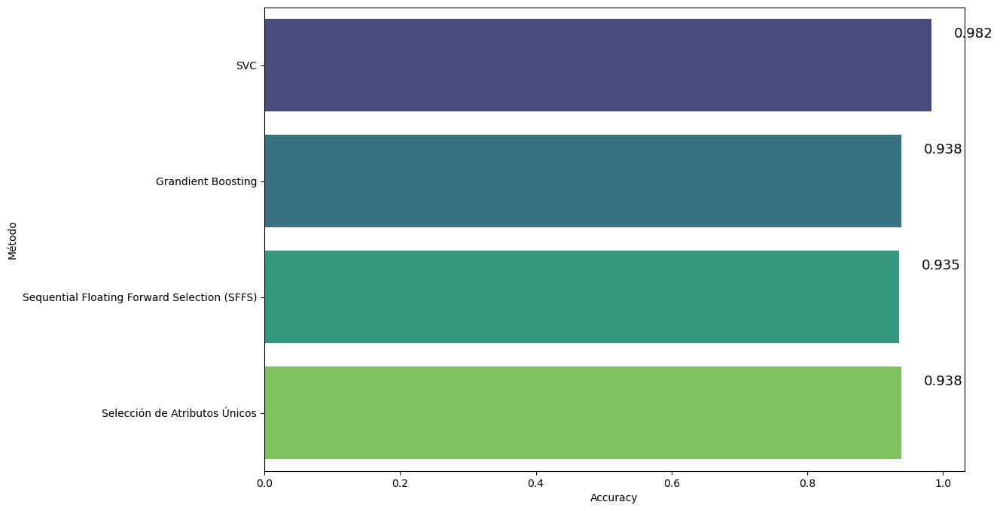

In [105]:
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.svm import SVC
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_model(model, X_train, X_test, y_train, y_test, model_name):
    print(f"Resultados de {model_name}")

    # Entrenar el modelo y realizar predicciones
    model.fit(X_train, y_train)
    predicted = model.predict(X_test)

    # Calcular la matriz de confusión
    conf_matrix = confusion_matrix(y_test, predicted)
    print("Matriz de Confusión:")
    print(conf_matrix)

    # Imprimir un informe de clasificación detallado
    print("Informe de Clasificación:")
    print(classification_report(y_test, predicted))
    print("\n" + "="*50 + "\n")

    # Devolver el accuracy
    accuracy = accuracy_score(y_test, predicted)
    return accuracy

# Cargar el conjunto de datos
data = pd.read_csv("breast-cancer-clean.csv")

# Separar características (X) y etiquetas (y)
X = data[['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
    'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean',
    'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se',
    'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se',
    'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst',
    'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst',
    'compactness_worst', 'concavity_worst', 'concave points_worst',
    'symmetry_worst', 'fractal_dimension_worst']].values
y = data['diagnosis'].values

# Convertir etiquetas categóricas a valores numéricos
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Escalar características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Definir el clasificador SVC
estimatorSVC = SVC()

# Resultados para SVC
accuracy_svc = evaluate_model(estimatorSVC, X_train_scaled, X_test_scaled, y_train, y_test, "SVC")

# Imprimir resultados para Grandient Boosting
X_gb = data[['radius_worst', 'concave points_mean', 'perimeter_worst', 'concave points_worst', 'texture_worst']].values
y_gb = data['diagnosis'].values

predicted_gb = cross_val_predict(estimatorSVC, X_gb, y_gb, cv=10)

print("Resultados para Grandient Boosting:")
conf_matrix_gb = confusion_matrix(y_gb, predicted_gb)
print("Matriz de Confusión:")
print(conf_matrix_gb)

true_negatives_gb, false_positives_gb, false_negatives_gb, true_positives_gb = conf_matrix_gb.ravel()
sensitivity_gb = true_positives_gb / (true_positives_gb + false_negatives_gb)
specificity_gb = true_negatives_gb / (true_negatives_gb + false_positives_gb)

print(f"Sensibilidad (Recall): {sensitivity_gb}")
print(f"Especificidad: {specificity_gb}")

print("Informe de Clasificación:")
print(classification_report(y_gb, predicted_gb))

# Calcular y almacenar la precisión
accuracy_gb = accuracy_score(y_gb, predicted_gb)
print(f"Precisión (Accuracy) para Grandient Boosting: {accuracy_gb}")

# Imprimir resultados para Sequential Floating Forward Selection (SFFS)
X_sffs = data[['fractal_dimension_se', 'smoothness_se', 'fractal_dimension_worst', 'concave points_mean',
                'concave points_se', 'compactness_mean', 'symmetry_worst', 'compactness_worst', 'radius_se',
                'radius_mean', 'radius_worst', 'perimeter_mean', 'texture_worst', 'perimeter_worst', 'area_se']].values
y_sffs = data['diagnosis'].values

predicted_sffs = cross_val_predict(estimatorSVC, X_sffs, y_sffs, cv=10)

print("Resultados para Sequential Floating Forward Selection (SFFS):")
conf_matrix_sffs = confusion_matrix(y_sffs, predicted_sffs)
print("Matriz de Confusión:")
print(conf_matrix_sffs)

true_negatives_sffs, false_positives_sffs, false_negatives_sffs, true_positives_sffs = conf_matrix_sffs.ravel()
sensitivity_sffs = true_positives_sffs / (true_positives_sffs + false_negatives_sffs)
specificity_sffs = true_negatives_sffs / (true_negatives_sffs + false_positives_sffs)

print(f"Sensibilidad (Recall): {sensitivity_sffs}")
print(f"Especificidad: {specificity_sffs}")

print("Informe de Clasificación:")
print(classification_report(y_sffs, predicted_sffs))

# Calcular y almacenar la precisión
accuracy_sffs = accuracy_score(y_sffs, predicted_sffs)
print(f"Precisión (Accuracy) para Sequential Floating Forward Selection (SFFS): {accuracy_sffs}")

# Imprimir resultados para Selección de Atributos Únicos
X_attr = data[['radius_worst', 'concave points_mean', 'perimeter_worst', 'texture_worst', 'perimeter_mean']].values
y_attr = data['diagnosis'].values

predicted_attr = cross_val_predict(estimatorSVC, X_attr, y_attr, cv=10)

print("Resultados para Selección de Atributos Únicos:")
conf_matrix_attr = confusion_matrix(y_attr, predicted_attr)
print("Matriz de Confusión:")
print(conf_matrix_attr)

true_negatives_attr, false_positives_attr, false_negatives_attr, true_positives_attr = conf_matrix_attr.ravel()
sensitivity_attr = true_positives_attr / (true_positives_attr + false_negatives_attr)
specificity_attr = true_negatives_attr / (true_negatives_attr + false_positives_attr)

print(f"Sensibilidad (Recall): {sensitivity_attr}")
print(f"Especificidad: {specificity_attr}")

print("Informe de Clasificación:")
print(classification_report(y_attr, predicted_attr))

# Calcular y almacenar la precisión
accuracy_attr = accuracy_score(y_attr, predicted_attr)
print(f"Precisión (Accuracy) para Selección de Atributos Únicos: {accuracy_attr}")

# Crear DataFrame de resultados
results_df = pd.DataFrame({
    'Método': ['SVC', 'Grandient Boosting', 'Sequential Floating Forward Selection (SFFS)', 'Selección de Atributos Únicos'],
    'Accuracy': [accuracy_svc, accuracy_gb, accuracy_sffs, accuracy_attr]
})

# Crear gráfico de barras con Seaborn
plt.figure(figsize=(12, 8))
barplot = sns.barplot(x='Accuracy', y='Método', data=results_df, palette='viridis')

# Agregar etiquetas de los valores de Accuracy en cada barra
for p in barplot.patches:
    barplot.annotate(f'{p.get_width():.3f}', (p.get_width(), p.get_y() + p.get_height() / 2),
                     ha='center', va='center', fontsize=13, color='black', xytext=(40, 30), textcoords='offset points')

# Mostrar la gráfica
plt.show()

<center>
<div style="color:;
           display:fill;
           border-radius:1px;
           background-color: plum;
           font-size:110%;
           letter-spacing:0.3px">

<h2 style="padding: 10px;
              color:white;">Selección de mejores modelos 
</h2>
</div>

<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: thistle;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Datos originales 
    
</h2>
</div>

In [218]:
X = df_clean[['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
    'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean',
    'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se',
    'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se',
    'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst',
    'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst',
    'compactness_worst', 'concavity_worst', 'concave points_worst',
    'symmetry_worst', 'fractal_dimension_worst']].values
y = df_clean['diagnosis'].values

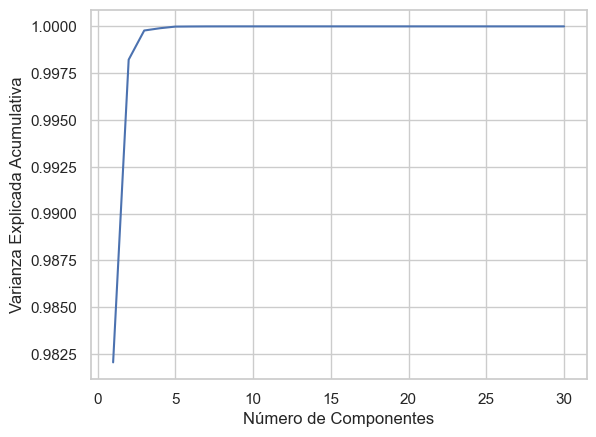

In [219]:
# Supongamos que X es tu conjunto de datos
pca = PCA()
pca.fit(X)
explained_variance_ratio = pca.explained_variance_ratio_
# Graficar el codo (Scree Plot)
plt.plot(range(1, len(explained_variance_ratio) + 1), np.cumsum(explained_variance_ratio))
plt.xlabel('Número de Componentes')
plt.ylabel('Varianza Explicada Acumulativa')
plt.show()

<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: thistle;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Sequential Wrapper - (SFFS) 
    
</h2>
</div>

In [220]:
X = df_clean[['fractal_dimension_se','smoothness_se','fractal_dimension_worst','concave points_mean'
              ,'concave points_se','compactness_mean','symmetry_worst','compactness_worst','radius_se'
              ,'radius_mean','radius_worst','perimeter_mean','texture_worst','perimeter_worst','area_se']].values
y = df_clean['diagnosis'].values

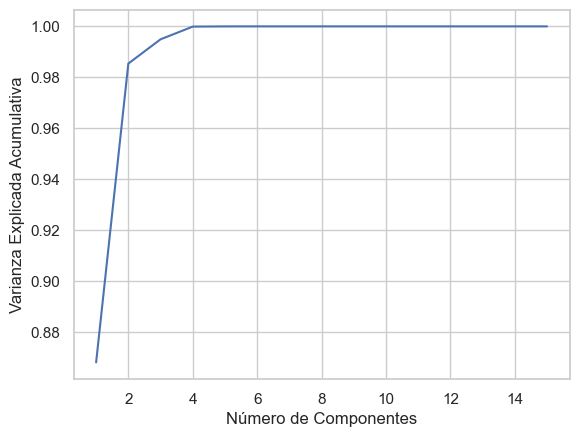

In [221]:
# Supongamos que X es tu conjunto de datos
pca = PCA()
pca.fit(X)
explained_variance_ratio = pca.explained_variance_ratio_
# Graficar el codo (Scree Plot)
plt.plot(range(1, len(explained_variance_ratio) + 1), np.cumsum(explained_variance_ratio))
plt.xlabel('Número de Componentes')
plt.ylabel('Varianza Explicada Acumulativa')
plt.show()

<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: thistle;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Filter - Grandient Boosting
    
</h2>
</div> 

In [223]:
X = df_clean[['radius_worst','concave points_mean','perimeter_worst','concave points_worst','texture_worst']].values
y = df_clean['diagnosis'].values

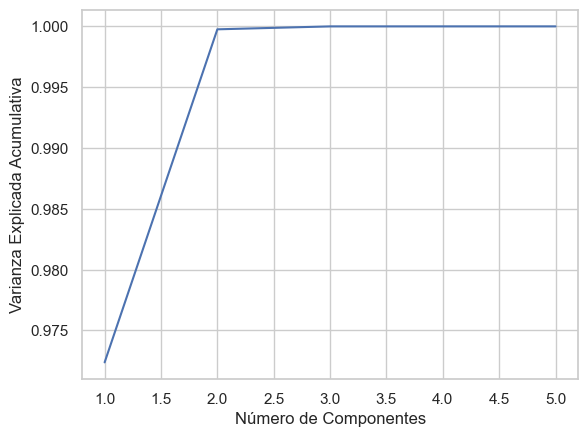

In [224]:
# Supongamos que X es tu conjunto de datos
pca = PCA()
pca.fit(X)
explained_variance_ratio = pca.explained_variance_ratio_
# Graficar el codo (Scree Plot)
plt.plot(range(1, len(explained_variance_ratio) + 1), np.cumsum(explained_variance_ratio))
plt.xlabel('Número de Componentes')
plt.ylabel('Varianza Explicada Acumulativa')
plt.show()

<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: thistle;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">Atributos Únicos
    
</h2>
</div> 

In [368]:
X = df_clean[['radius_worst', 'concave points_mean','perimeter_worst','texture_worst','perimeter_mean']].values
y = df_clean['diagnosis'].values

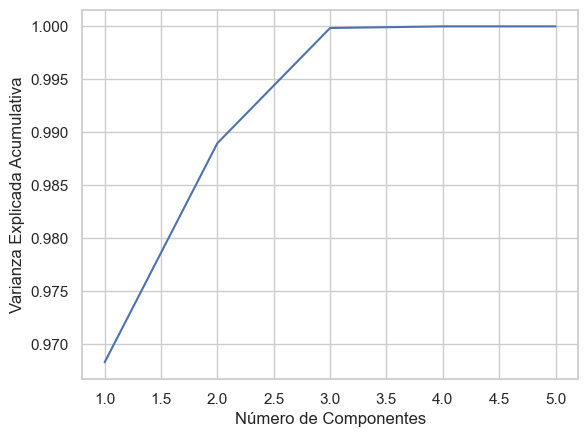

In [369]:
# Supongamos que X es tu conjunto de datos
pca = PCA()
pca.fit(X)
explained_variance_ratio = pca.explained_variance_ratio_
# Graficar el codo (Scree Plot)
plt.plot(range(1, len(explained_variance_ratio) + 1), np.cumsum(explained_variance_ratio))
plt.xlabel('Número de Componentes')
plt.ylabel('Varianza Explicada Acumulativa')
plt.show()

In [332]:
df = pd.read_csv('breast-cancer-clean.csv', index_col=False)
df


,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [334]:
if 'Unnamed: 0' in df.columns:
    df.drop('Unnamed: 0', axis=1, inplace=True)
else:
    print("La columna 'Unnamed: 0' no está presente en el DataFrame.")

La columna 'Unnamed: 0' no está presente en el DataFrame.


In [335]:
print(df.columns)

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')


In [337]:
df.diagnosis.unique()

array([1, 0])

In [338]:
# Group by diagnosis and review the output.
diag_gr = df.groupby('diagnosis', axis=0)
pd.DataFrame(diag_gr.size(), columns=['# of observations'])

,# of observations
diagnosis,
0,357
1,212


In [340]:
X = df_clean[['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
    'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean',
    'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se',
    'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se',
    'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst',
    'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst',
    'compactness_worst', 'concavity_worst', 'concave points_worst',
    'symmetry_worst', 'fractal_dimension_worst']].values
y = df_clean['diagnosis'].values
df

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: hotpink;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">PCA - Datos originales
    
</h2>
</div> 

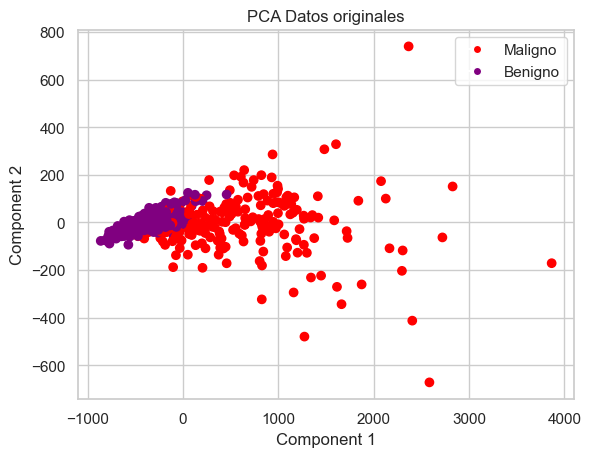

In [393]:

X = df_clean[['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
              'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean',
              'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se',
              'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se',
              'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst',
              'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst',
              'compactness_worst', 'concavity_worst', 'concave points_worst',
              'symmetry_worst', 'fractal_dimension_worst']].values

y = df_clean['diagnosis'].values

# Aplicar PCA
X_PCA = PCA(n_components=2).fit_transform(X)

# Asignar colores a las clases
colors = {'Maligno': 'red', 'Benigno': 'purple'}
colores = [colors[label] for label in y]

# Crear un gráfico de dispersión
scatter = plt.scatter(X_PCA[:, 0], X_PCA[:, 1], c=colores)
plt.title('PCA Datos originales')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

# Crear leyenda
legend_labels = [plt.Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=colors[label]) for label in colors]
plt.legend(handles=legend_labels)

plt.show()



<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: hotpink;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">PCA - Sequential Wrapper (SFFS)
    
</h2>
</div> 

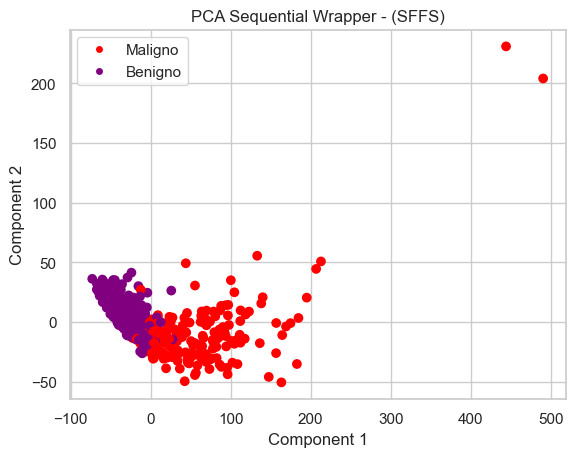

In [381]:

# Definir X e y
X = df_clean[['fractal_dimension_se','smoothness_se','fractal_dimension_worst','concave points_mean'
              ,'concave points_se','compactness_mean','symmetry_worst','compactness_worst','radius_se'
              ,'radius_mean','radius_worst','perimeter_mean','texture_worst','perimeter_worst','area_se']].values

y = df_clean['diagnosis'].values

# Aplicar PCA
X_PCA = PCA(n_components=2).fit_transform(X)

# Asignar colores a las clases
colors = {'Maligno': 'red', 'Benigno': 'purple'}
colores = [colors[label] for label in y]

# Crear un gráfico de dispersión
scatter = plt.scatter(X_PCA[:, 0], X_PCA[:, 1], c=colores)
plt.title('PCA Sequential Wrapper - (SFFS)')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

# Crear leyenda
legend_labels = [plt.Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=colors[label]) for label in colors]
plt.legend(handles=legend_labels)

plt.show()



<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: hotpink;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">PCA - Grandient Boosting
    
</h2>
</div> 

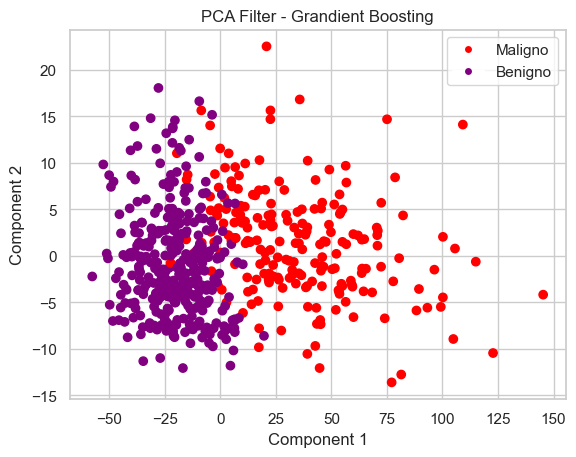

In [382]:

# Definir X e y
X = df_clean[['radius_worst','concave points_mean','perimeter_worst','concave points_worst','texture_worst']].values

y = df_clean['diagnosis'].values

# Aplicar PCA
X_PCA = PCA(n_components=2).fit_transform(X)

# Asignar colores a las clases
colors = {'Maligno': 'red', 'Benigno': 'purple'}
colores = [colors[label] for label in y]

# Crear un gráfico de dispersión
scatter = plt.scatter(X_PCA[:, 0], X_PCA[:, 1], c=colores)
plt.title('PCA Filter - Grandient Boosting')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

# Crear leyenda
legend_labels = [plt.Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=colors[label]) for label in colors]
plt.legend(handles=legend_labels)

plt.show()



<center>
<div style="color:;
           display:fill;
           border-radius:5px;
           background-color: hotpink;
           font-size:110%;
           letter-spacing:0.5px">

<h2 style="padding: 10px;
              color:white;">PCA - Atributos Únicos
    
</h2>
</div> 

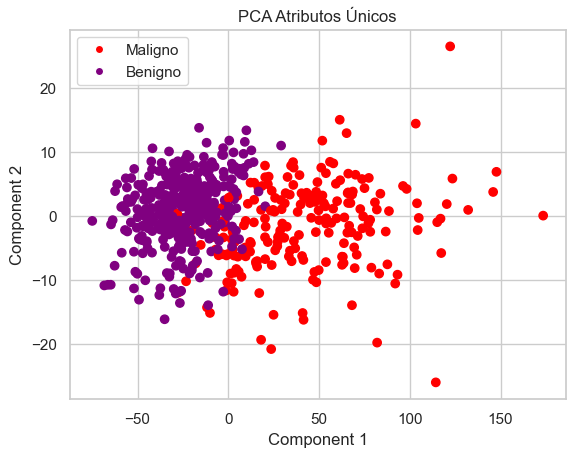

In [383]:

# Definir X e y
X = df_clean[['radius_worst', 'concave points_mean','perimeter_worst','texture_worst','perimeter_mean']].values

y = df_clean['diagnosis'].values

# Aplicar PCA
X_PCA = PCA(n_components=2).fit_transform(X)

# Asignar colores a las clases
colors = {'Maligno': 'red', 'Benigno': 'purple'}
colores = [colors[label] for label in y]

# Crear un gráfico de dispersión
scatter = plt.scatter(X_PCA[:, 0], X_PCA[:, 1], c=colores)
plt.title('PCA Atributos Únicos')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

# Crear leyenda
legend_labels = [plt.Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=colors[label]) for label in colors]
plt.legend(handles=legend_labels)

plt.show()

